# Final Project 

In [ ]:
'''

Course: Programming For Business Intelligence 
Team: 3A
Team members:

Jayakar, Nikita- nmj303
Kappagantula, Sesha Sai Sreevani- ssk785
Kshirsagar, Rajas Paresh- rpk304
Kumbhar, Omkar- opk208
Li, Jiayi- jl12009

Topic: World Development Indicators related to Trade services among 12 countries

colab link: https://colab.research.google.com/drive/1O3LoTa4T_JB55Ht9FkgjMlZ92AsuGcs6?authuser=1#scrollTo=vzFZYf-tzeT5

'''

'\n\nCourse: Programming For Business Intelligence \nTeam: 3A\nTeam members:\n\nJayakar, Nikita- nmj303\nKappagantula, Sesha Sai Sreevani- ssk785\nKshirsagar, Rajas Paresh- rpk304\nKumbhar, Omkar- opk208\nLi, Jiayi- jl12009\n\nTopic: World Development Indicators related to Trade services among 12 countries\n\n'

In [ ]:
!pip install joypy

In [ ]:
# Import necessary libraries
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import joypy
import random
import matplotlib as cm
from itertools import cycle
from sklearn.linear_model import LinearRegression

In [ ]:
pwd

'/content'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Data Collection and Cleaning

Upload the CSV file after every runtime session on your drive for this notebook to work

In [ ]:
# get the csv file
csv_path = '9d02f30e-af5a-406a-9d93-a1b82876a8cf_Data.csv'
# read the csv data file of Exports as a capacity to imports of countries over years 1990-2019
df = pd.read_csv(csv_path)
# Remove 'Data from database: World Development Indicators' 'Last Updated: 02/17/2021' from csv file
df=df[:len(df)-1]
# as 2020 data not present but column is present in csv
del df['2020 [YR2020]']

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

In [ ]:
pwd

'/content'

### Basic information about dataset 

In [ ]:
# Prints length of dataframe, number of values in it, number of unique column values, first rows,last rows, data types of columns and basic stats of data
print("Total number of rows:",len(df))
print("\n\nValue count in each column\n",df.count())
print("Countries:\n")
print(df['Country Name'].unique())
print("Parameters Compared:\n")
print(df['Series Name'].unique())
print(df.head(5))
print(df.tail(5))
print(df.dtypes)
print(df.describe())

Total number of rows: 38548


Value count in each column
 Series Name      38545
Series Code      38544
Country Name     38544
Country Code     38544
1990 [YR1990]    38544
2000 [YR2000]    38544
2011 [YR2011]    38544
2012 [YR2012]    38544
2013 [YR2013]    38544
2014 [YR2014]    38544
2015 [YR2015]    38544
2016 [YR2016]    38544
2017 [YR2017]    38544
2018 [YR2018]    38544
2019 [YR2019]    38544
dtype: int64
Countries:

['Afghanistan' 'Albania' 'Algeria' 'American Samoa' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Aruba' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas, The' 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bermuda' 'Bhutan' 'Bolivia'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'British Virgin Islands'
 'Brunei Darussalam' 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde'
 'Cambodia' 'Cameroon' 'Canada' 'Cayman Islands'
 'Central African Republic' 'Chad' 'Channel Islands' 'Chile' 'China'
 'Colombia' 'Comoros' 'Congo, Dem. Re

### Renaming existing column names 

In [ ]:
# rename columns for easier access of column names
df = df.rename(columns={"Series Name":"series",
                              "Series Code":"series_code",
                              "Country Name": "country",
                              "Country Code":"country_code",
                              "1990 [YR1990]":"1990",
                              "2000 [YR2000]":"2000",
                              "2011 [YR2011]":"2011",
                              "2012 [YR2012]":"2012",
                              "2013 [YR2013]":"2013",
                              "2014 [YR2014]":"2014",
                              "2015 [YR2015]":"2015",
                              "2016 [YR2016]":"2016",
                              "2017 [YR2017]":"2017",
                              "2018 [YR2018]":"2018",
                              "2019 [YR2019]":"2019",
                             }
                    )
print(df.head(5))

                         series  ...              2019
0  Trade in services (% of GDP)  ...  9.66617507412919
1  Trade in services (% of GDP)  ...  40.5870861070526
2  Trade in services (% of GDP)  ...   7.7511398619611
3  Trade in services (% of GDP)  ...                ..
4  Trade in services (% of GDP)  ...                ..

[5 rows x 15 columns]


### Finding duplicate rows and dropping them 

In [ ]:
# Total number of rows and columns
print(df.shape)
# Rows containing duplicate data
duplicate_rows_df = df[df.duplicated()]
print(duplicate_rows_df)
print('number of duplicate rows:', duplicate_rows_df.shape)

(38548, 15)
      series series_code country country_code 1990  ... 2015 2016 2017 2018 2019
38545    NaN         NaN     NaN          NaN  NaN  ...  NaN  NaN  NaN  NaN  NaN
38546    NaN         NaN     NaN          NaN  NaN  ...  NaN  NaN  NaN  NaN  NaN

[2 rows x 15 columns]
number of duplicate rows: (2, 15)


In [ ]:
# Dropping the duplicates 
df = df.drop_duplicates()
print('number of duplicate rows:', df[df.duplicated()])

number of duplicate rows: Empty DataFrame
Columns: [series, series_code, country, country_code, 1990, 2000, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Index: []


### Finding null values and dropping them 

In [ ]:
# Finding the null values count in each column.
print("\n\nNull values in each column:\n",df.isnull().sum())
df=df.dropna()
print("\n\nAfter removing Null values:\n",df.isnull().sum())




Null values in each column:
 series          1
series_code     2
country         2
country_code    2
1990            2
2000            2
2011            2
2012            2
2013            2
2014            2
2015            2
2016            2
2017            2
2018            2
2019            2
dtype: int64


After removing Null values:
 series          0
series_code     0
country         0
country_code    0
1990            0
2000            0
2011            0
2012            0
2013            0
2014            0
2015            0
2016            0
2017            0
2018            0
2019            0
dtype: int64


### Organizing data into data structures for easy computations 

In [ ]:
'''Data Structures Used:
    List
    Nested Dictionary
    Pandas Dataframe
    Numpy Arrays
'''

'Data Structures Used:\n    List\n    Nested Dictionary\n    Pandas Dataframe\n    Numpy Arrays\n'

In [ ]:
# Below are selected 12 countries put in the form of list
countries = ['India','Japan','Brazil','Australia','Germany','Spain',
            'United States','United Kingdom','Sweden','Portugal','New Zealand','China']

In [ ]:
# Below are 12 features selected put in the form of list
services = ['Trade (% of GDP)',
            'Merchandise trade (% of GDP)','Imports of goods and services (% of GDP)',
            'Import value index (2000 = 100)','Import volume index (2000 = 100)',
            'Food exports (% of merchandise exports)','Food imports (% of merchandise imports)',
            'Fuel exports (% of merchandise exports)','Fuel imports (% of merchandise imports)',
            'Exports of goods and services (% of GDP)','Export value index (2000 = 100)',
            'Export volume index (2000 = 100)']

In [ ]:
# Below are the years for which data is already available and is put in the form of list
years = ['1990', '2000', '2011', '2012',
         '2013', '2014', '2015', '2016',
         '2017', '2018', '2019']

## Methods of storing the data
1. Using dataframes for each service
2. Using a nested dictionary

In [ ]:
# 1. Using dataframes for each service

# maps service-> countries-> year values and creates a nested dictionary first
services_struct = {service:[] for service in services}
for i,value in df.iterrows():
    service = value['series']
    if service in services:
        country = value['country']
        if country in countries:
            years_dict = {int(year):float(value) 
                          if value != '..' else None
                          for year,value in zip(years,list(df[years].iloc[i]))}
            
            years_dict['country'] = country
            services_struct[service].append(years_dict)
# From the nested dictionary we can create one data frame for each mapping of a service, where services will be keys or column names for dataframe
service_dfs = {service:None for service in services}
for key in service_dfs.keys():
    service_df = pd.DataFrame.from_records(services_struct[key]).set_index('country')
    service_dfs[key] = service_df

In [ ]:
# 2. Using a nested dictionary

# Below is a dictionary of dictionary(nested dictionary) is created which maps a service with its countries for which 
# each country is further mapped with values for all the years 
services_dict = {service:{} for service in services}
# maps service-> countries-> year values
for i,value in df.iterrows():
    service = value['series']
    if service in services:
        country = value['country']
        if country in countries:
            services_dict[service][country] = {year:value for year,value in zip(years,list(df[years].iloc[i]))}
# Based on our analysis we decided to use nested dictionary structure for rest of our project

### Print the next line to see what the cleaned data looks like and what the organized data structures store 

In [ ]:
# print(services_dict)
# print(years)
# print(services)
# print(countries)

# Plotting Graphs

## Country wise feature plotting 

In [ ]:
# plots line graph with service line values of country given over the years(1990-2019)
def plot_gdp_time_series_data(services_dict,service,country,color):
    # get and store corresponding service values of the given country
    plotme = services_dict[service][country]
    # set the figure and labels
    fig = plt.figure(figsize=(10,5))
    labels = list(plotme.keys())[2:]
    # get x and y coordinates to plot by filtering out '..'(unnecessary values)
    x = list(range(len(labels)))
    y = [float(val) if val != '..' else 0 for val in list(plotme.values())[2:]]
    # plot x ticks and format year string values on x axis 
    plt.xticks(x,labels)
    fig.autofmt_xdate()
    # set the title along with x and y labels
    plt.xlabel('years')
    plt.ylabel(service)
    plt.title('{} for Country:{}'.format(service,country))
    # plot the line graph
    plt.plot(x,y,'{}o-'.format(color))

### Plotting Trade (%GDP) values for each of 12 countries

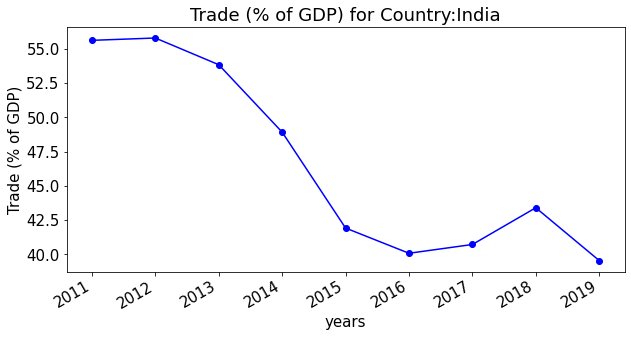

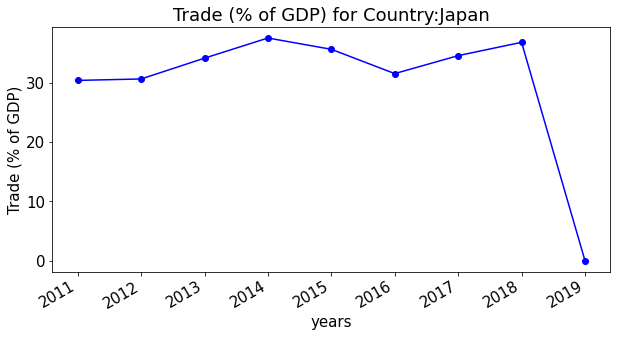

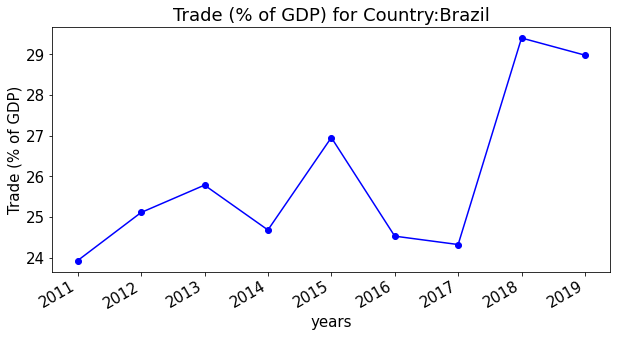

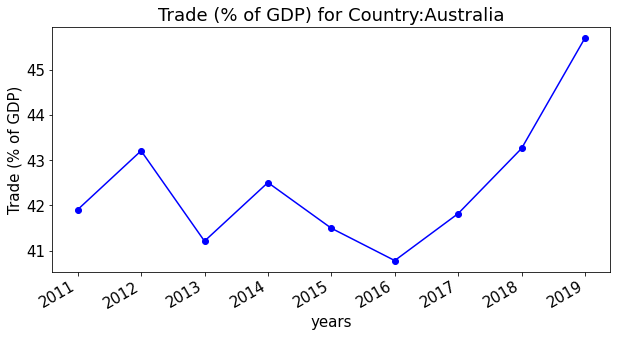

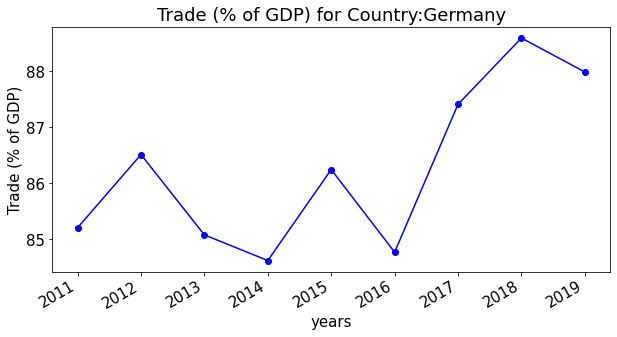

...

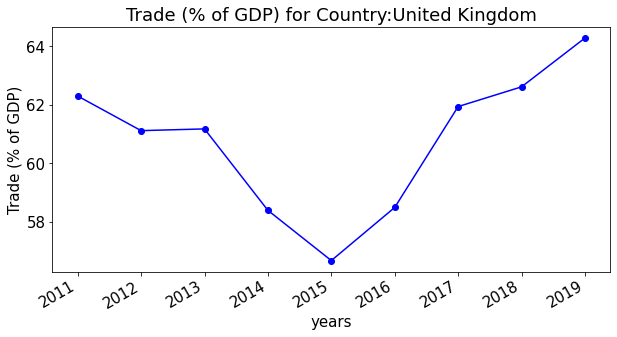

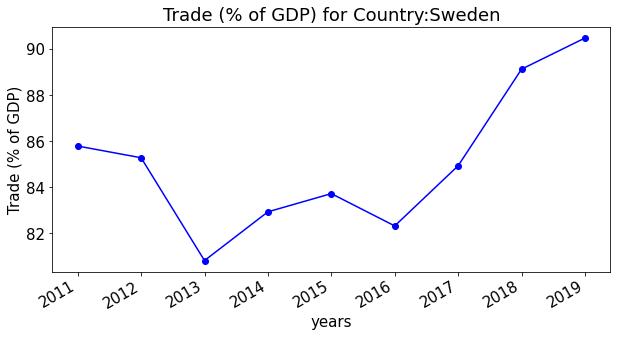

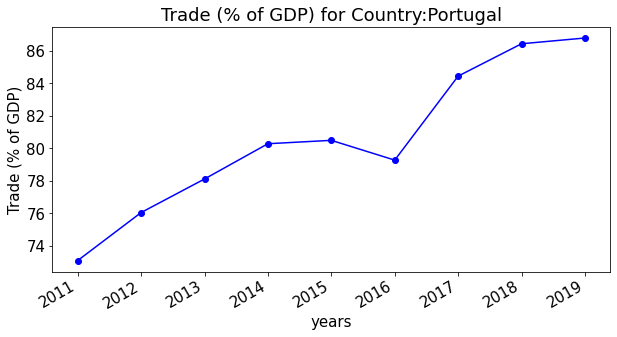

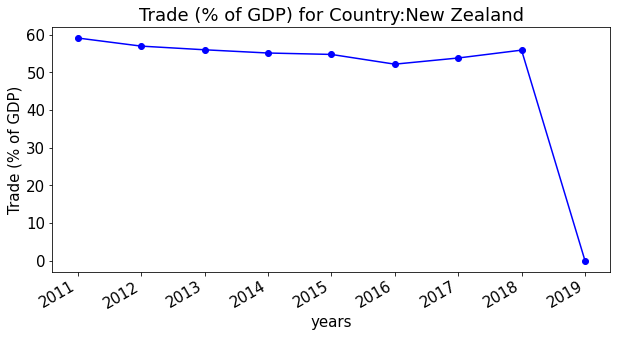

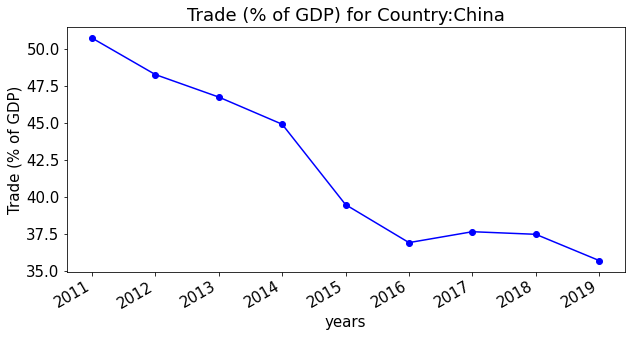

In [ ]:
# for each country we plot the trade % gdp values line graphs of all years(1990-2019) by calling plot_gdp_time_series_data method
for country in countries:
    plot_gdp_time_series_data(services_dict,service='Trade (% of GDP)',country=country,color='b') 

### Plotting Merchandise trade (% GDP) values for each of 12 countries 

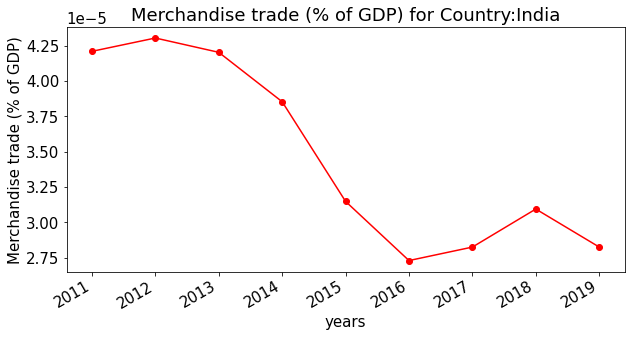

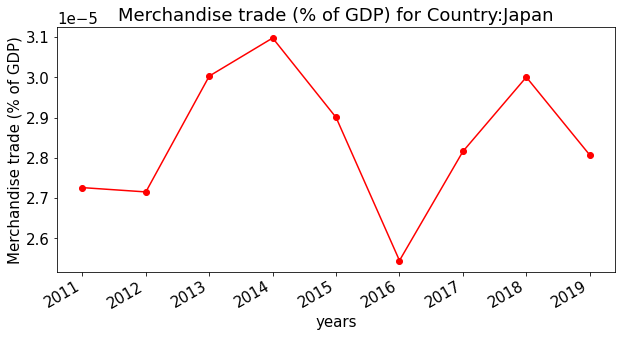

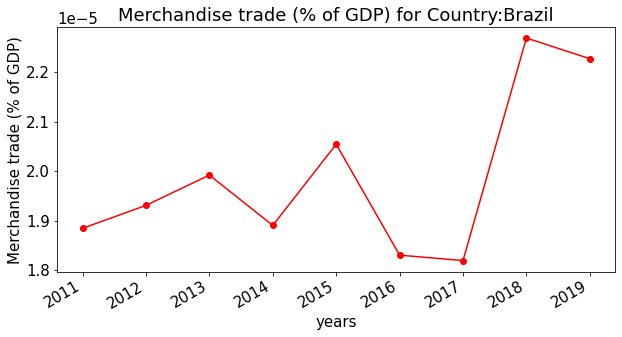

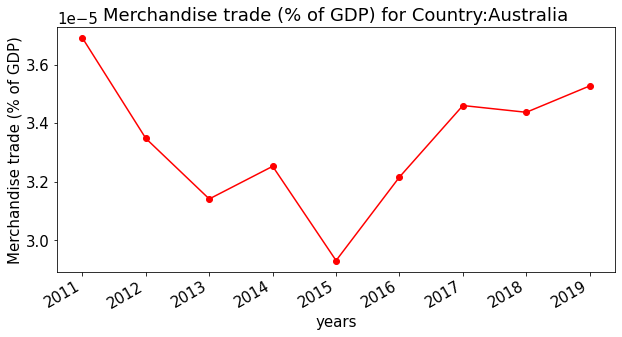

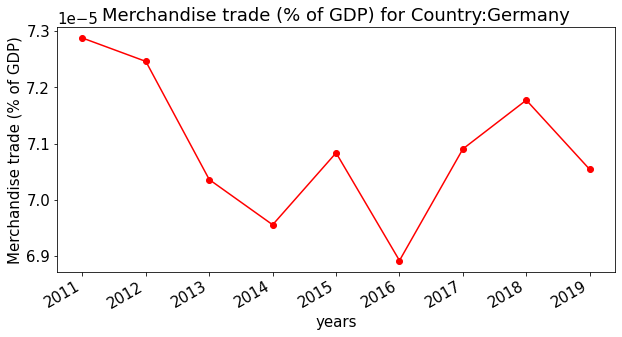

...

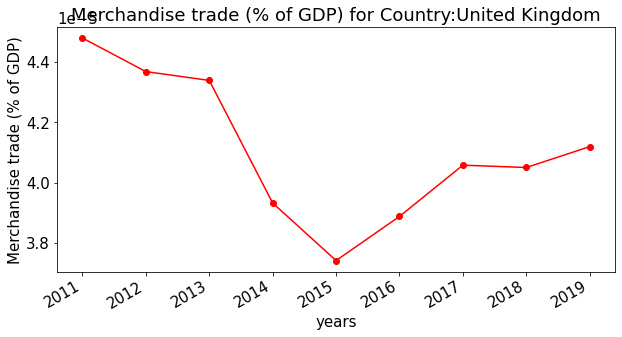

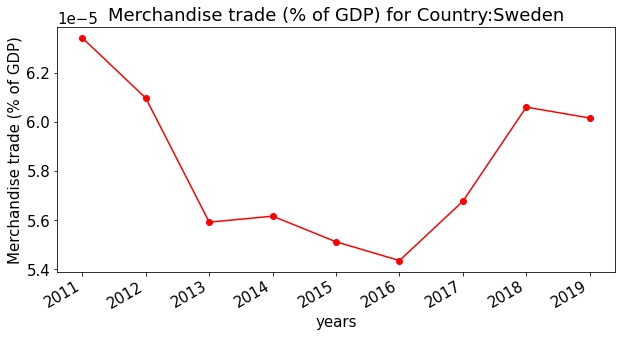

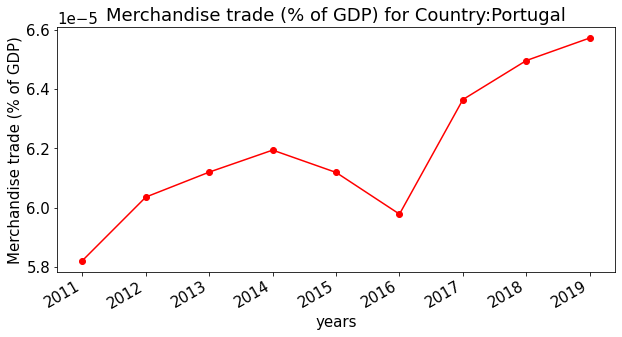

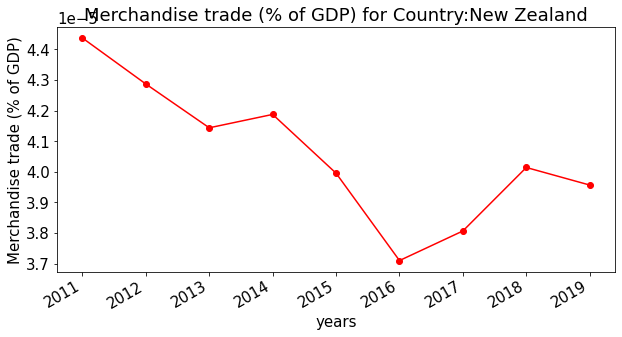

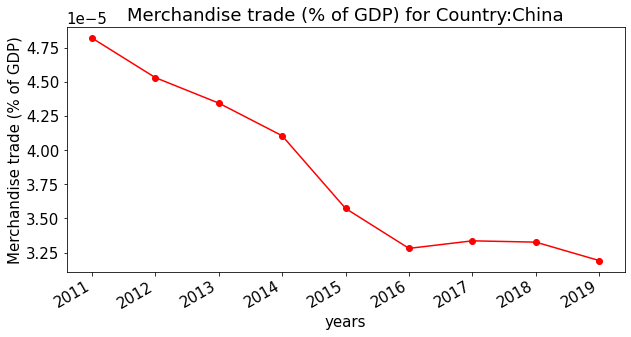

In [ ]:
# for each country we plot the merchandise trade % gdp values line graphs of all years(1990-2019) by calling plot_gdp_time_series_data method
for country in countries:
    plot_gdp_time_series_data(services_dict,service='Merchandise trade (% of GDP)',country=country,color='r')

In [ ]:
# plots line graph with service 1 and service2 line values of country given over the years(1990-2019)
def plot_import_export(services_dict,service1,service2,country):
    # get and store corresponding service1 and service 2 values of the given country
    plotme1 = services_dict[service1][country]
    plotme2 = services_dict[service2][country]
    # gather labels
    labels = list(plotme1.keys())[2:]
    # get x coordinates and two y coordinates (one line for each service)
    x_values = list(range(len(labels)))
    y1_values = [float(val) if val != '..' else 0 for val in list(plotme1.values())[2:]]
    y2_values = [float(val) if val != '..' else 0 for val in list(plotme2.values())[2:]]
    # set the figure
    fig = plt.figure(figsize=(10,5))
    # plot both the service value lines with different marker and color
    plt.plot( x_values, y1_values, marker='o', markerfacecolor='blue', color='skyblue', linewidth=4,label=service1)
    plt.plot( x_values, y2_values, marker='*', markerfacecolor='green',color='lightgreen', linewidth=4, label=service2)
    # set x ticks and format year string value
    x = list(range(len(labels)))
    plt.xticks(x,labels)
    fig.autofmt_xdate()
    # add title, x and y labels
    plt.title('{} vs {} for Country : {}'.format(service1,service2,country))
    plt.xlabel('Years')
    plt.ylabel('Service values')
    # set legend
    plt.legend(loc='upper right')
    # plot the line graph
    plt.show()

### Plotting Imports (%GDP) vs Exports (%GDP) of goods and services for each of 12 countries

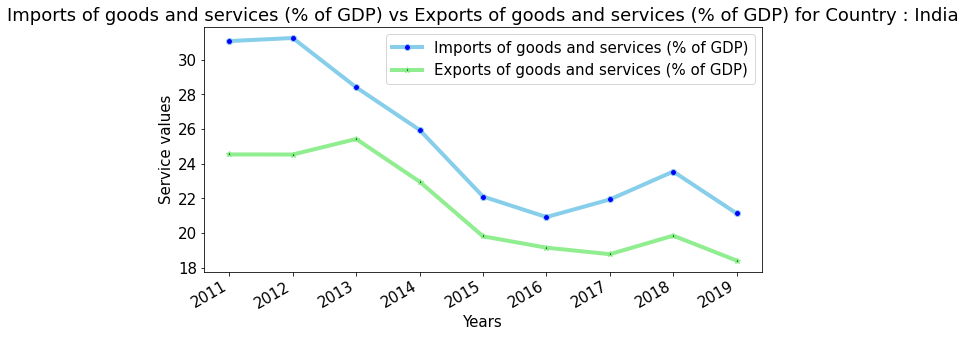

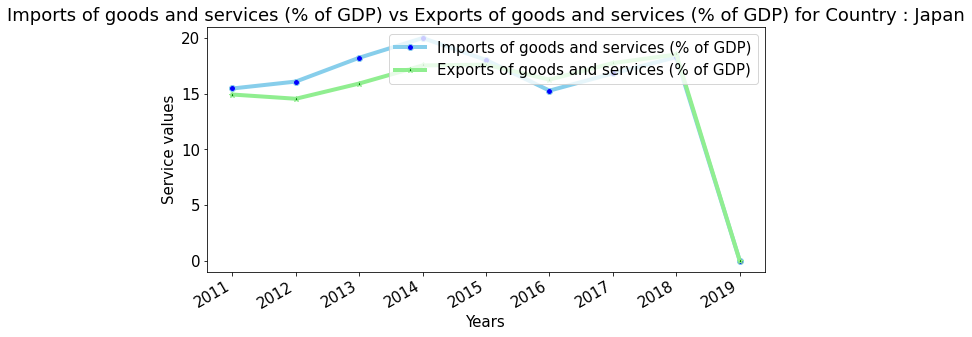

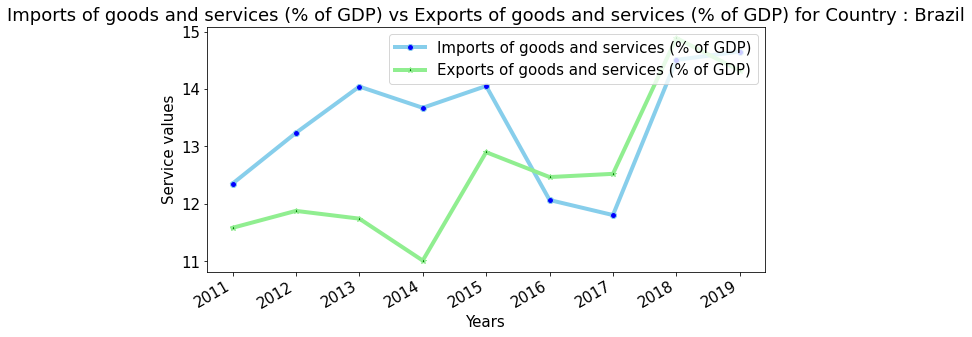

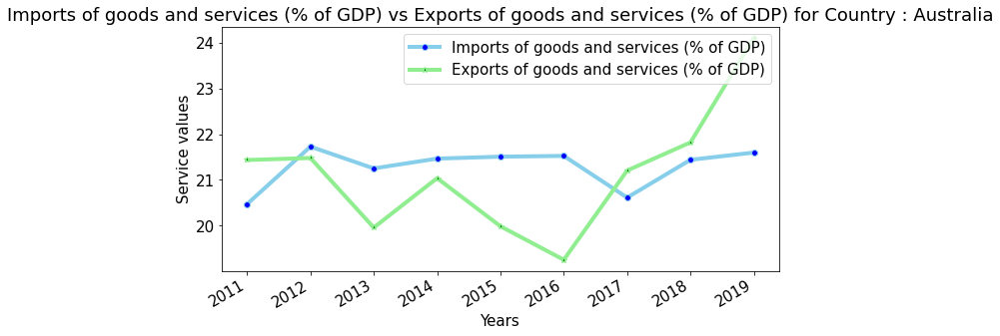

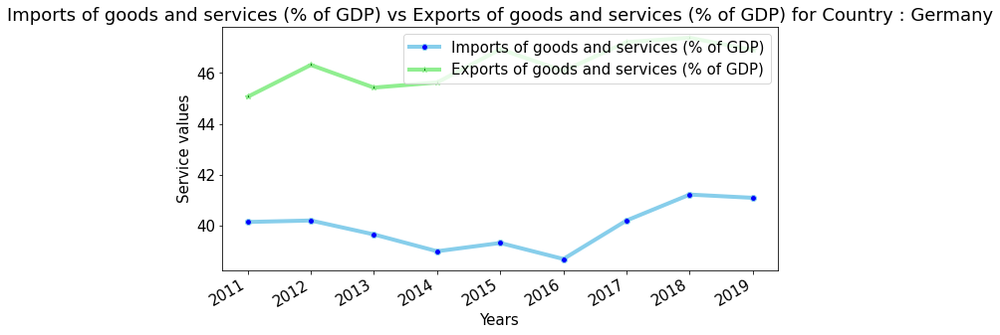

...

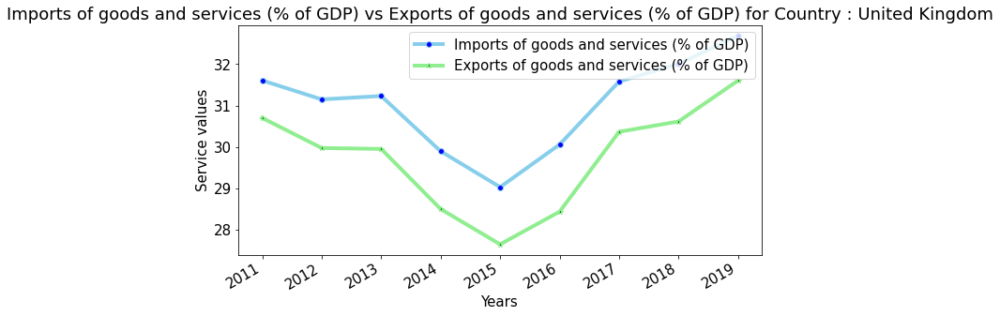

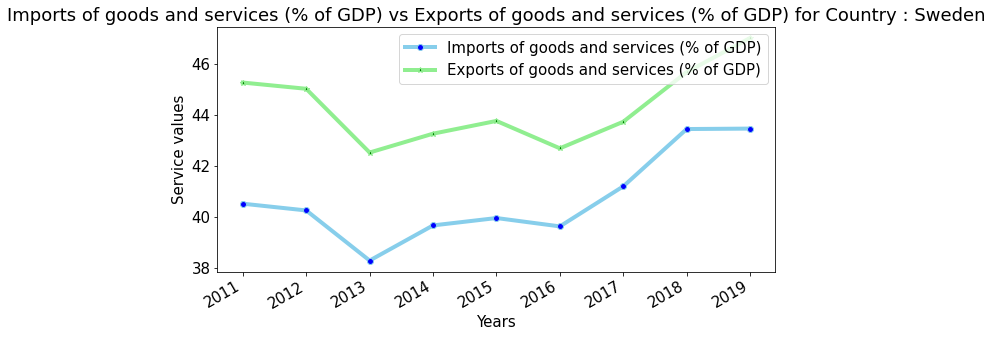

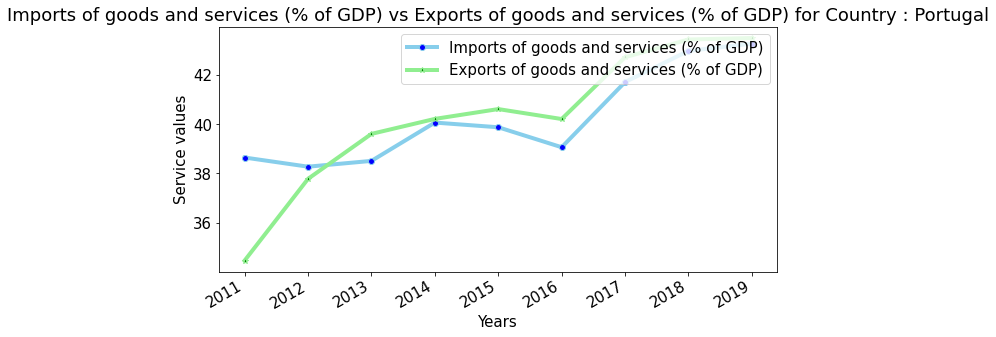

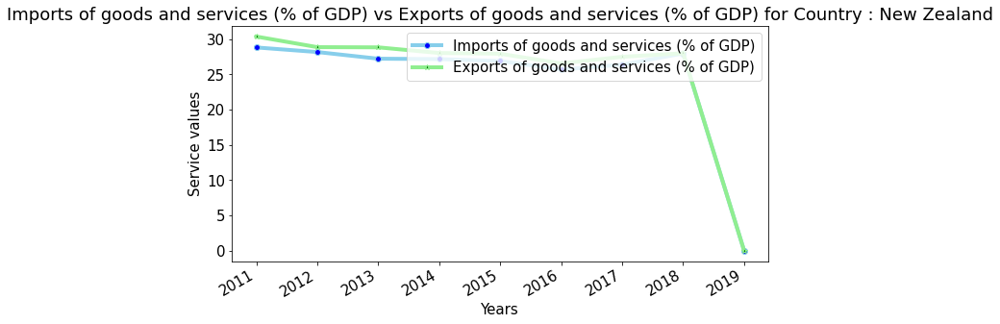

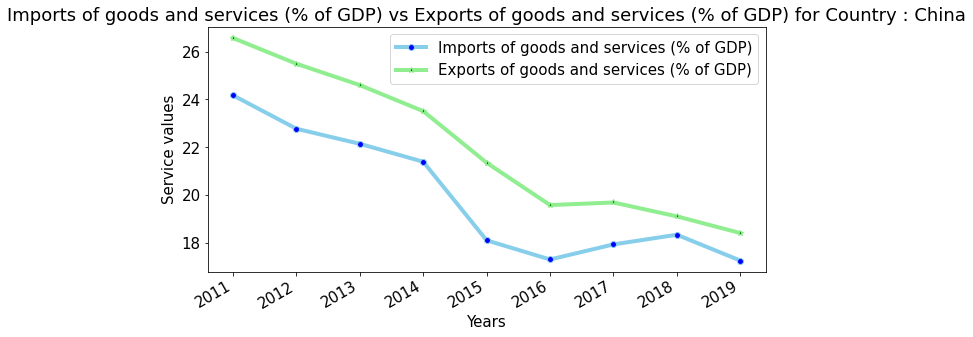

In [ ]:
# for each country we plot the imports vs exports % gdp values line graphs over the years(1990-2019) by calling plot_import_export method
for country in countries:
    service1='Imports of goods and services (% of GDP)'
    service2='Exports of goods and services (% of GDP)'
    plot_import_export(services_dict,service1,service2,country)

### Plotting Food Imports (% Merchandise imports) vs Food Exports (% Merchandise exports) for each of 12 countries

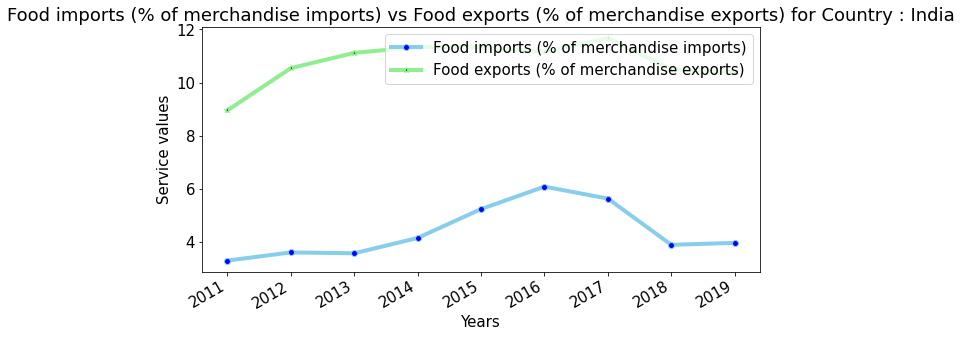

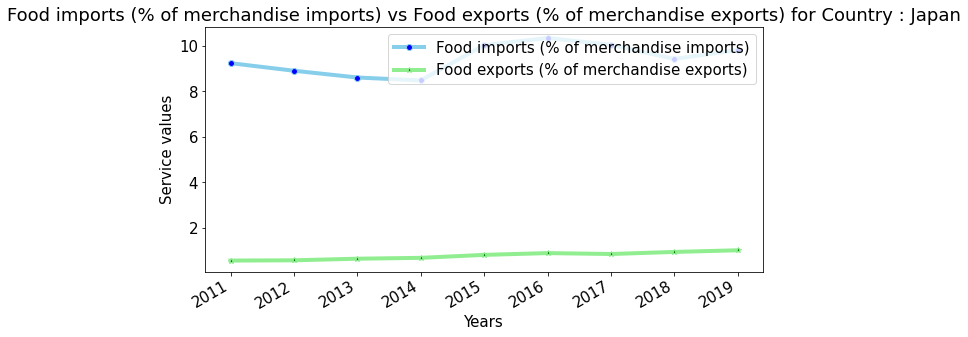

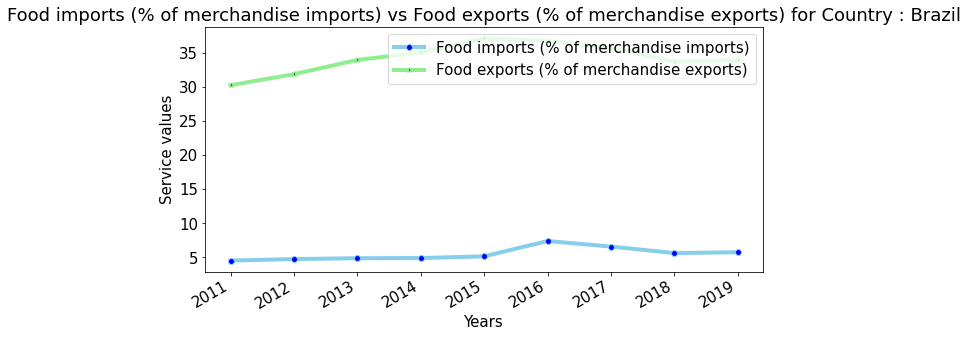

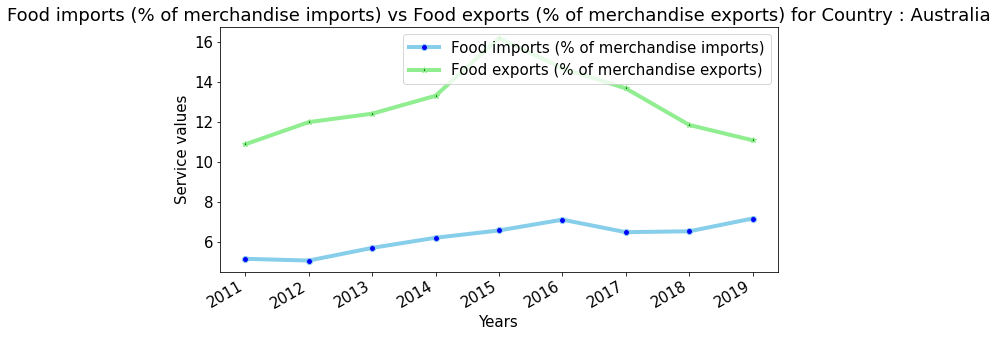

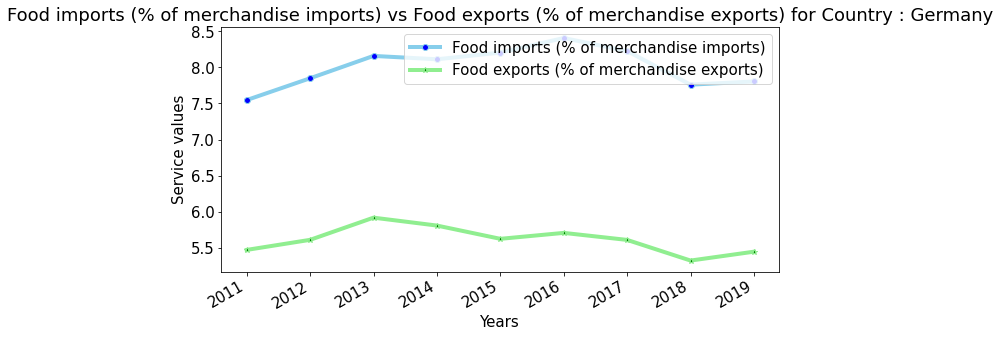

...

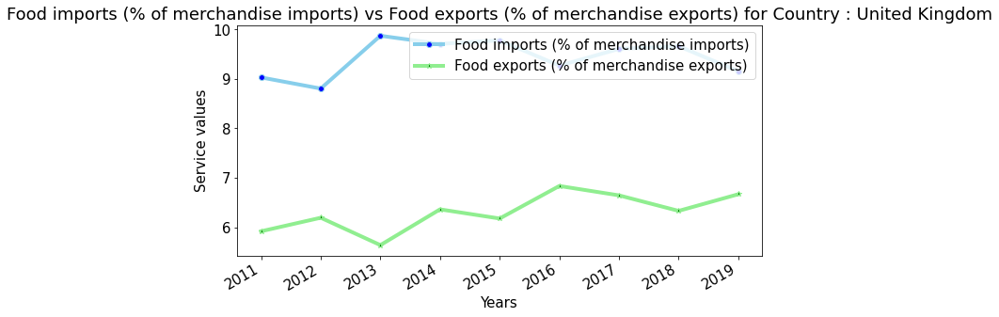

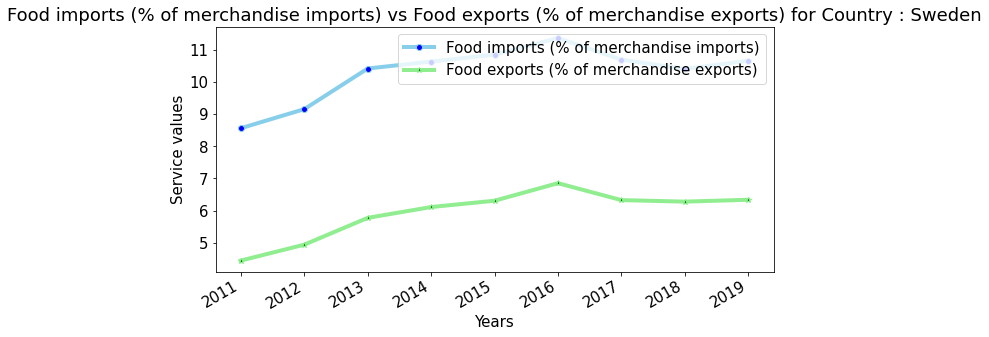

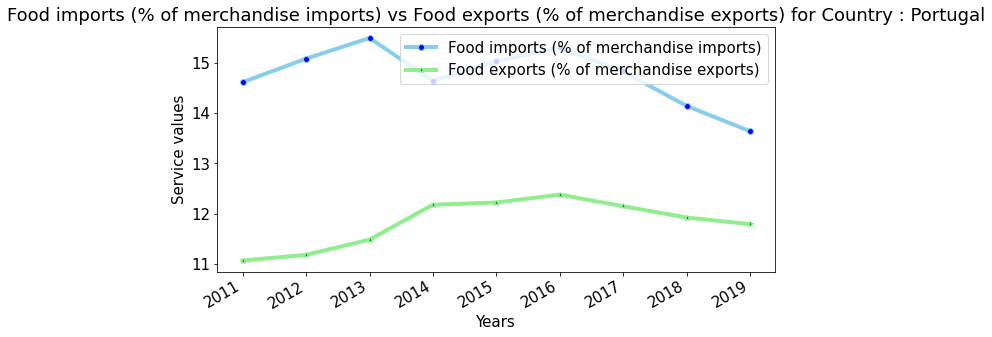

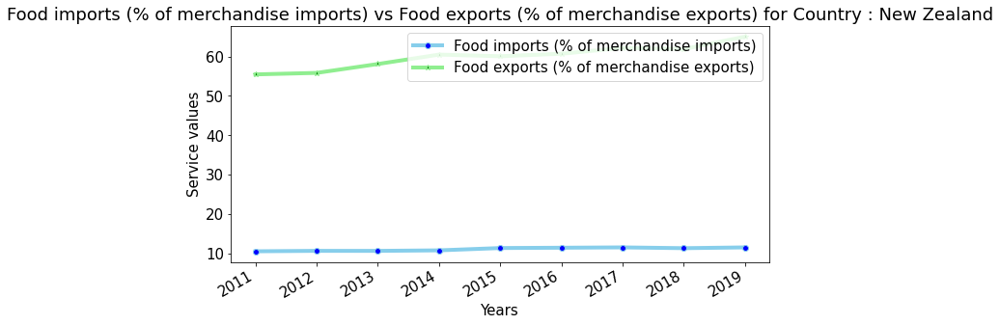

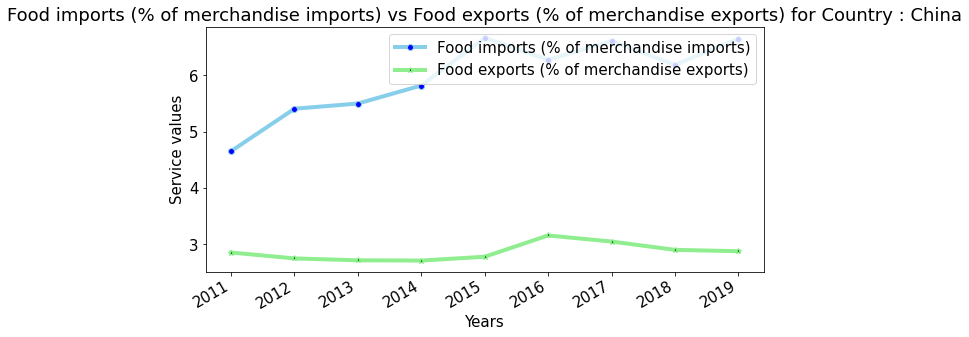

In [ ]:
# for each country we plot the food imports vs exports % values line graphs over the years(1990-2019) by calling plot_import_export method
for country in countries:
    service1='Food imports (% of merchandise imports)'
    service2='Food exports (% of merchandise exports)'
    plot_import_export(services_dict,service1,service2,country)

### Plotting Fuel Imports (% Merchandise imports) vs Fuel Exports (% Merchandise exports) for each of 12 countries 

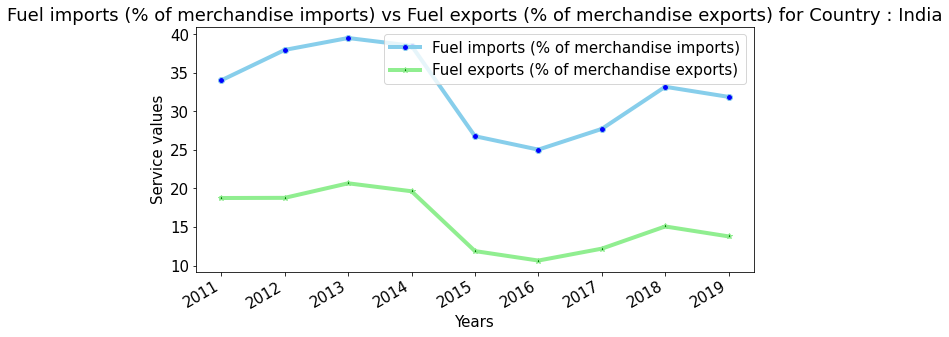

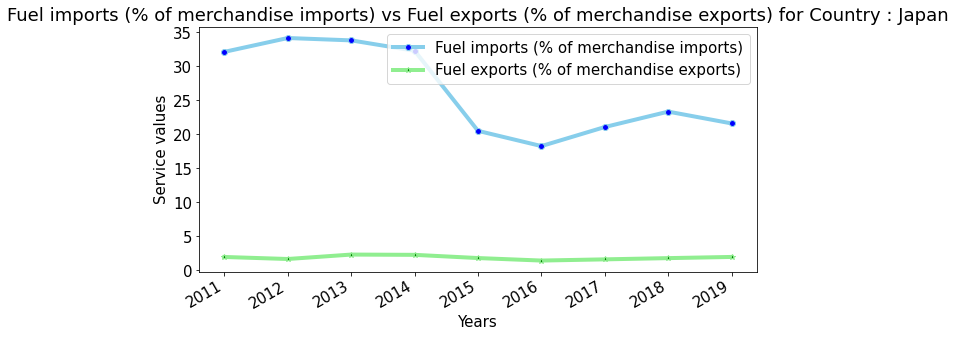

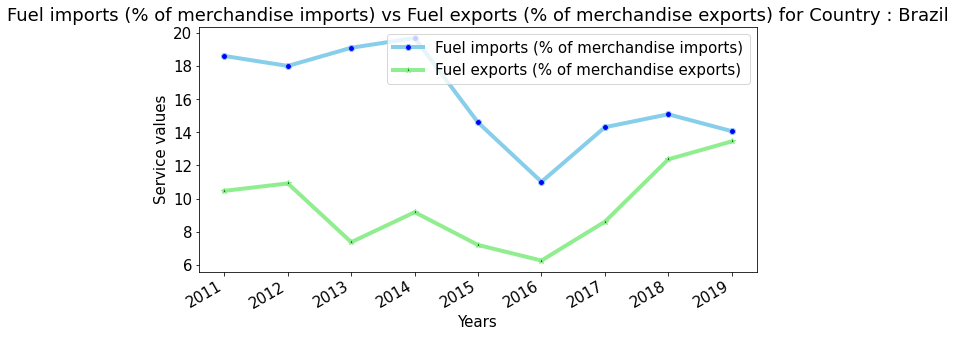

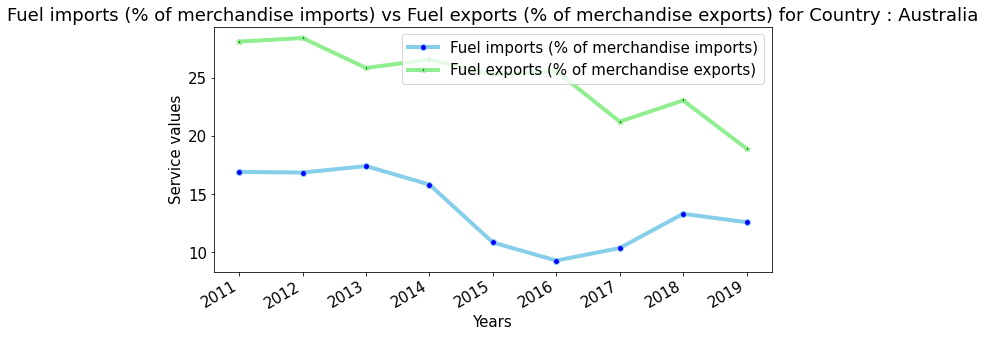

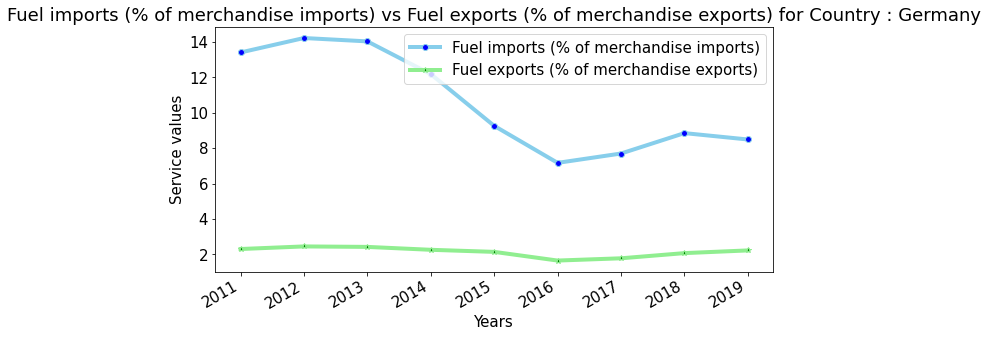

...

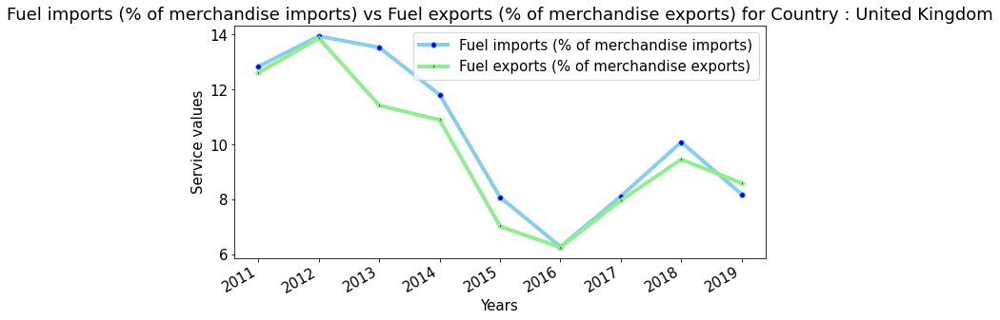

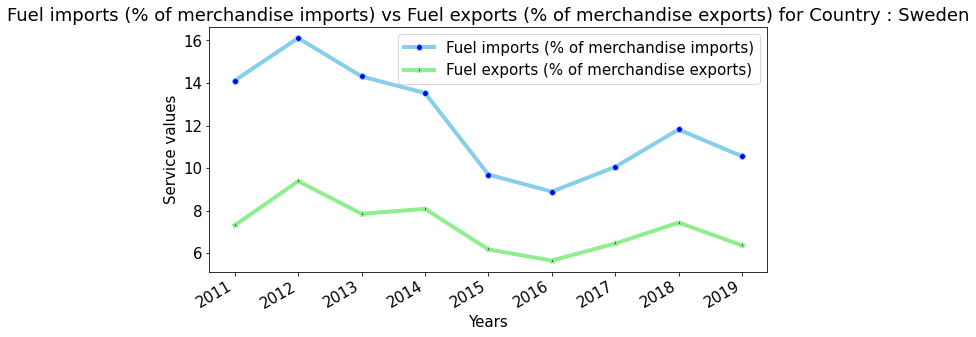

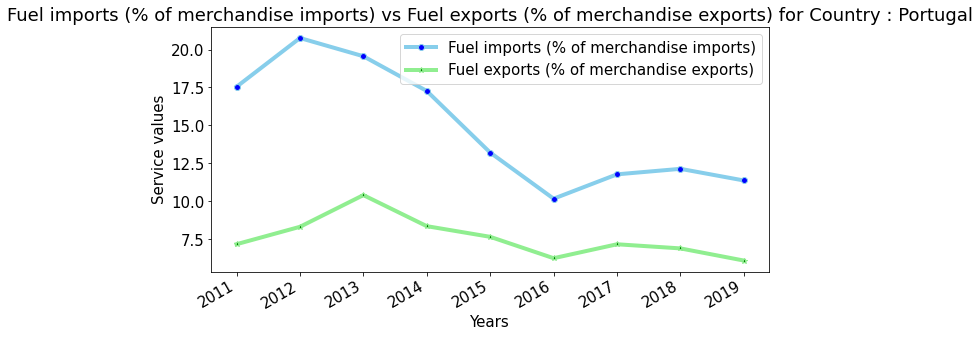

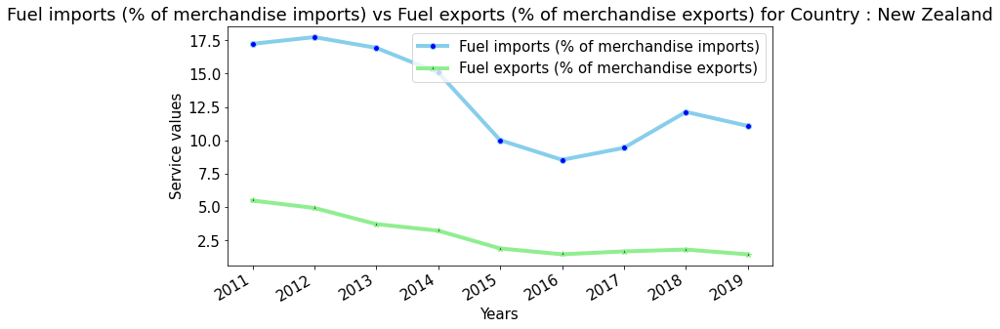

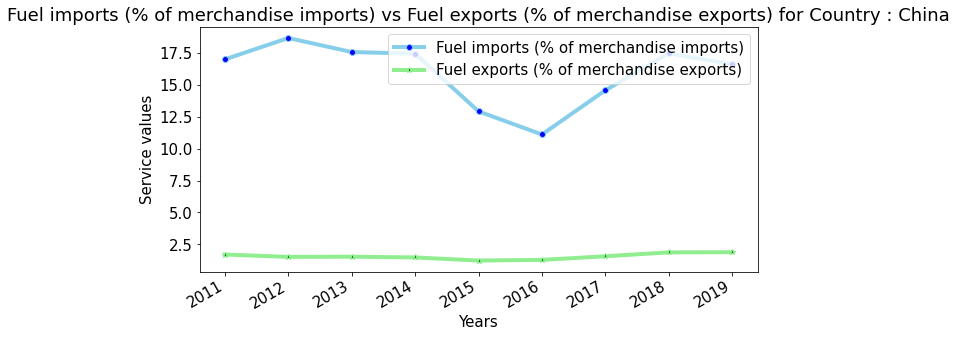

In [ ]:
# for each country we plot the fuel imports vs exports % values line graphs over the years(1990-2019) by calling plot_import_export method
for country in countries:
    service1='Fuel imports (% of merchandise imports)'
    service2='Fuel exports (% of merchandise exports)'
    plot_import_export(services_dict,service1,service2,country)

### Plotting Import value index vs Export value index (2000=100) for each of 12 countries

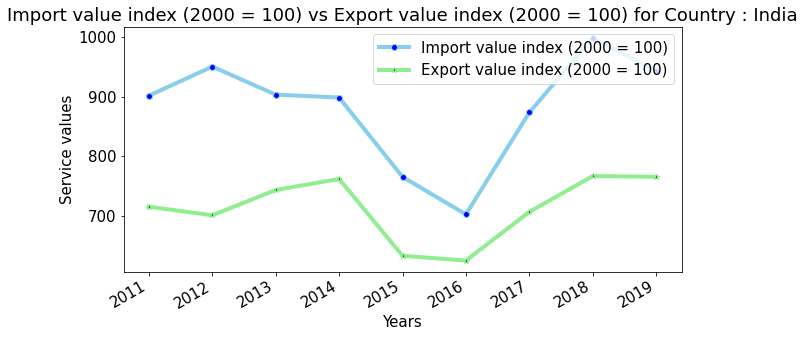

In [ ]:
# for each country we plot the imports vs exports value indices line graphs over the years(1990-2019) by calling plot_import_export method
for country in countries:
    service1='Import value index (2000 = 100)'
    service2='Export value index (2000 = 100)'
    plot_import_export(services_dict,service1,service2,country)

### Plotting Import volume index vs Export volume index (2000=100) for each of 12 countries 

In [ ]:
# for each country we plot the imports vs exports volume indices line graphs over the years(1990-2019) by calling plot_import_export method
for country in countries:
    service1='Import volume index (2000 = 100)'
    service2='Export volume index (2000 = 100)'
    plot_import_export(services_dict,service1,service2,country)

## Year wise feature plotting 

In [ ]:
# plots line graph for service value given for an year 
def plot_countries_time_series_data(services_dict,countries,service,year,color):
    # gather and store the values of service corresponding to the year
    country_dict={}
    for country in countries:
        country_dict[country]=services_dict[service][country][year]
    # set the figure
    plotme = country_dict
    fig = plt.figure(figsize=(10,5))
    # create labels
    labels = list(plotme.keys())[2:]
    # get x and y coordinate values
    x = list(range(len(labels)))
    y = [float(val) if val != '..' else 0 for val in list(plotme.values())[2:]]
    # add the x ticks and autocorrect the year format to be displayed on x axis
    plt.xticks(x,labels)
    fig.autofmt_xdate()
    # set the x and y labels and title
    plt.xlabel('Countries')
    plt.ylabel('Service Values')
    plt.title('{} in the year: {}'.format(service,year))
    # plot the line graph
    plt.plot(x,y,'{}o-'.format(color))

In [ ]:
# plots bar graph for service value given for an year 
def plot_bar_countries_time_series_data(services_dict,countries,service,year):
    # gather and store the values of service corresponding to the year
    country_list=[]
    for country in countries:
        val=services_dict[service][country][year]
        if val!='..':
            val=float(val)
        else:
            val=0
        country_list.append(val)
    # set the figure and axes
    fig = plt.figure()
    ax = fig.add_axes([0,0,1,1])
    # set the bars for countries vs service values
    ax.bar(countries,country_list)
    # set x ticks along with x and y labels
    ax.set_xticklabels(countries,rotation=45, rotation_mode="anchor", ha="right")
    plt.xlabel('Countries')
    plt.ylabel('Service Values')
    # add title
    plt.title('{} in the year: {}'.format(service,year)) 
    # plot the bar graph
    plt.show()

### Plotting Trade (%GDP) values between all countries for each of the years

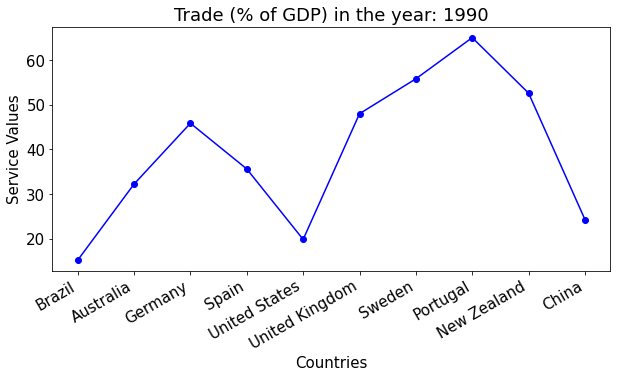

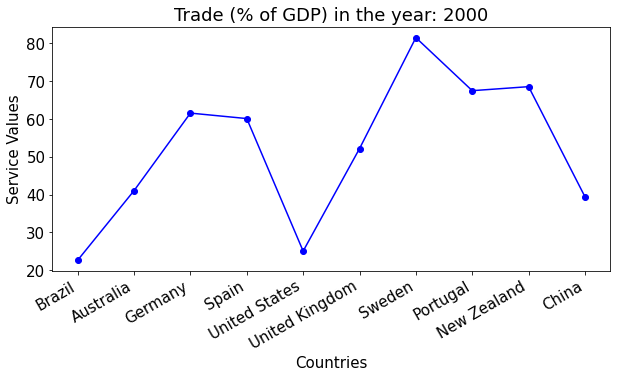

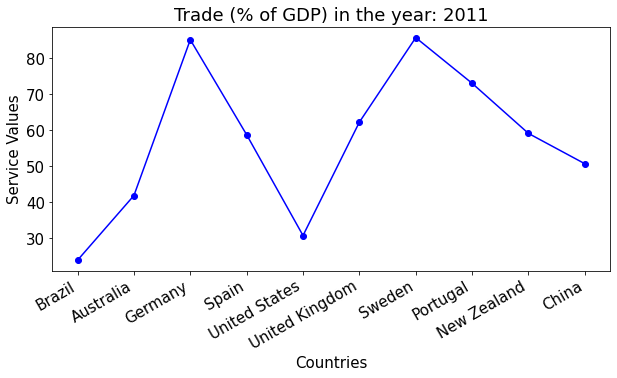

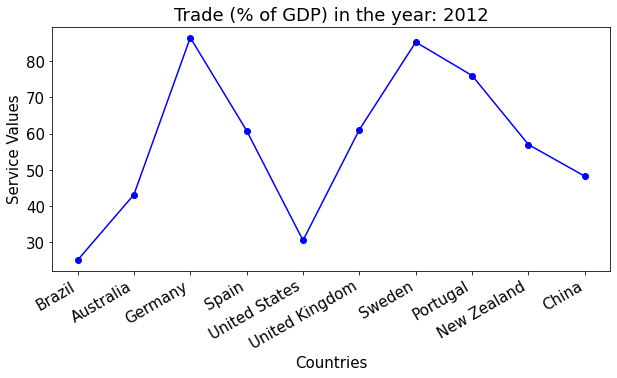

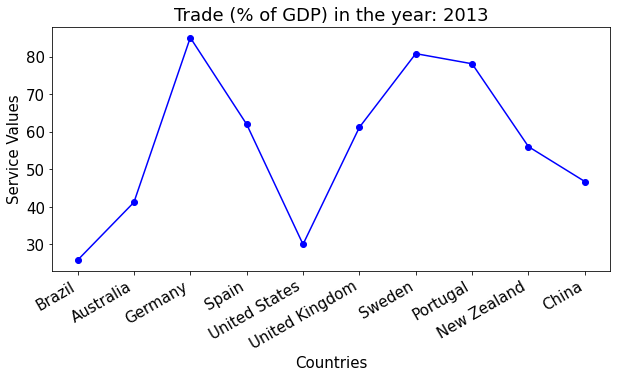

...

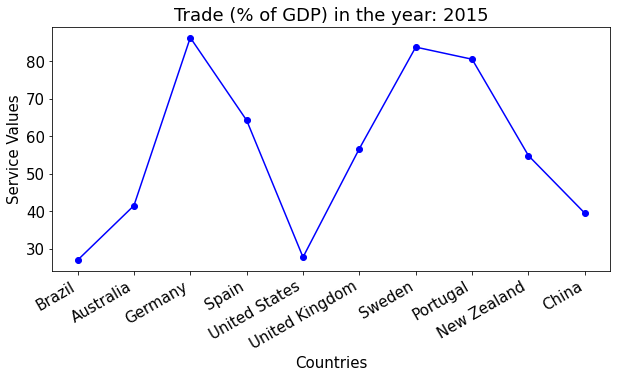

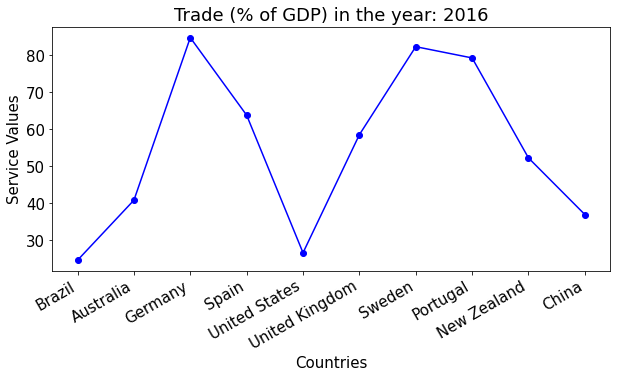

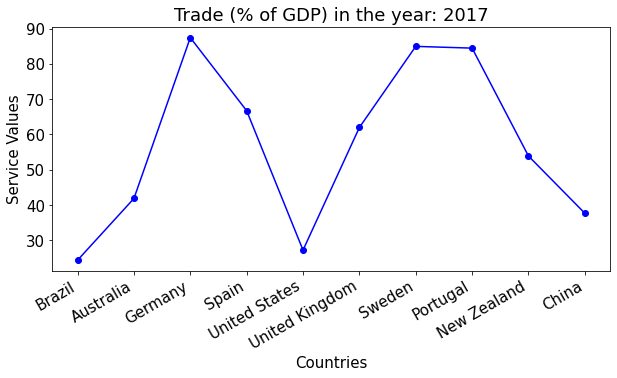

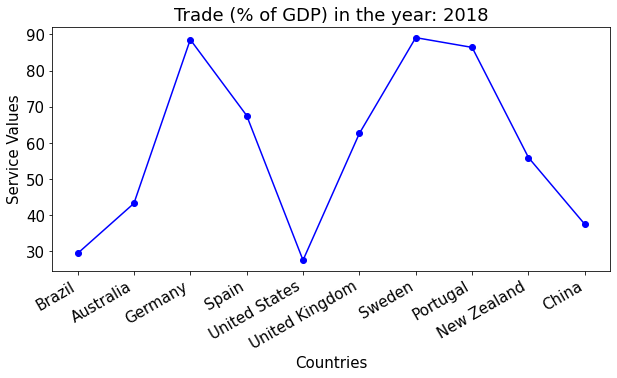

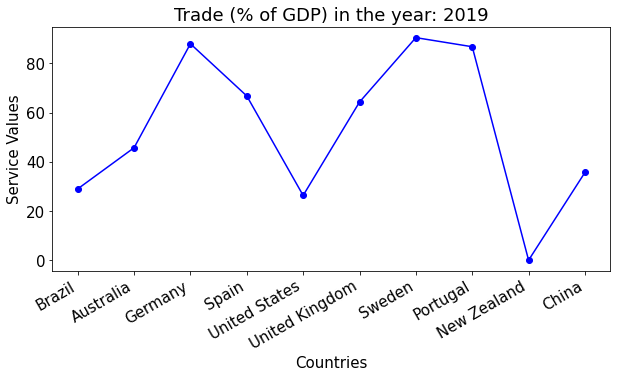

In [ ]:
# for each year we plot the trade % gdp values line graphs of all countries by calling plot_countries_time_series_data method
for year in years:
    plot_countries_time_series_data(services_dict,countries,'Trade (% of GDP)',year,color='b')

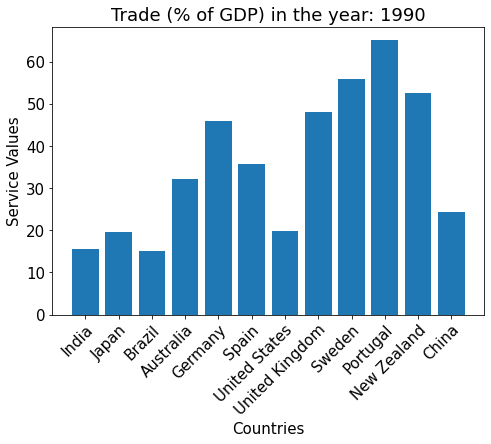

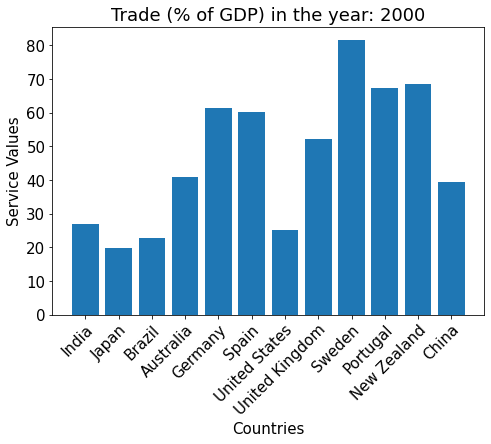

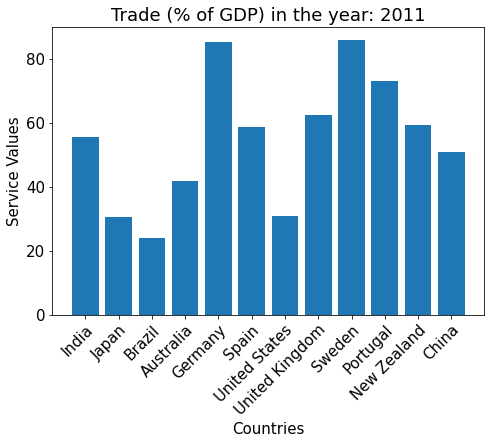

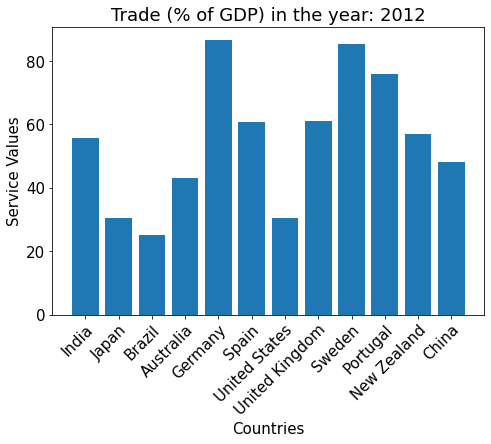

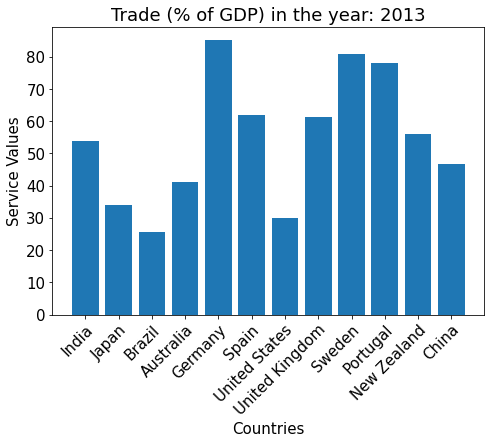

...

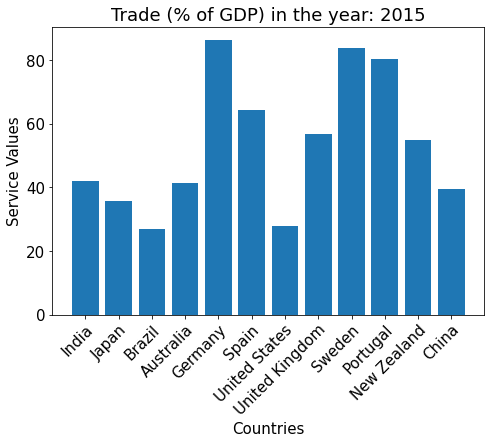

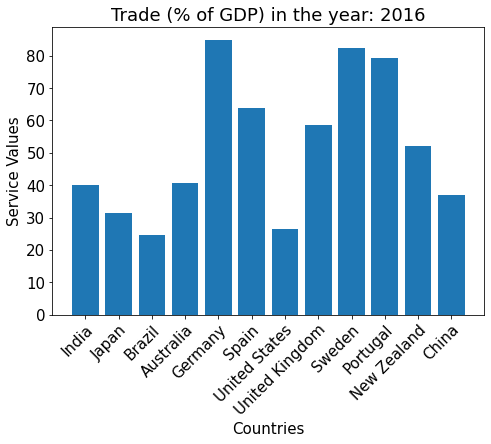

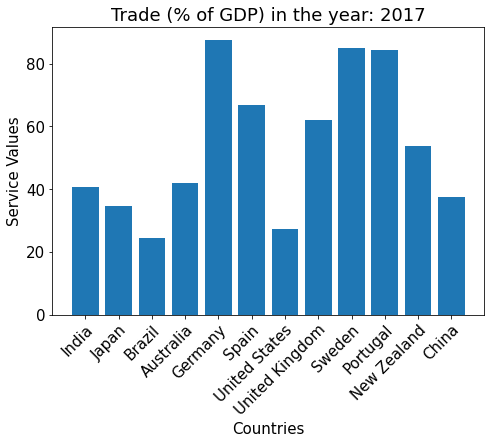

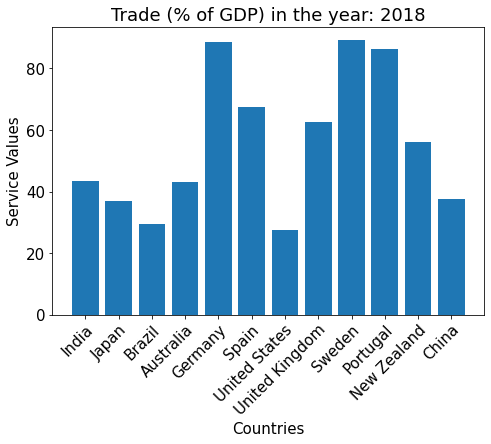

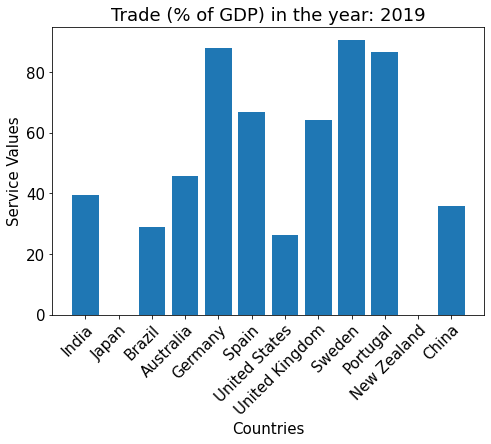

In [ ]:
# for each year we plot the trade % gdp values bar graphs of all countries by calling plot_bar_countries_time_series_data method
for year in years:
    plot_bar_countries_time_series_data(services_dict,countries,'Trade (% of GDP)',year)

### Plotting Merchandise trade (% GDP) values between all countries for each of the years  

In [ ]:
# for each year we plot the merchandise trade % gdp values line graphs of all countries by calling plot_countries_time_series_data method
for year in years:
    plot_countries_time_series_data(services_dict,countries,'Merchandise trade (% of GDP)',year,color='r')

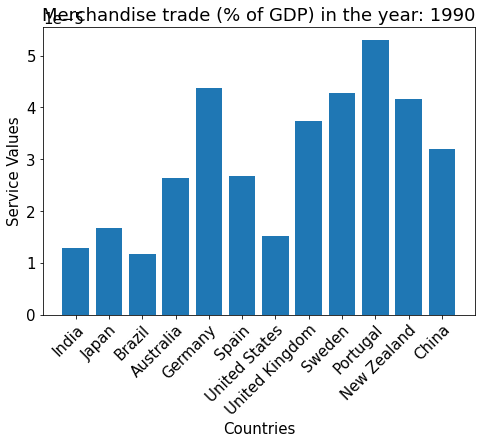

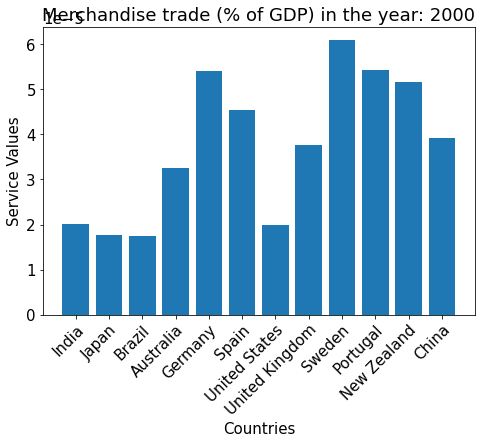

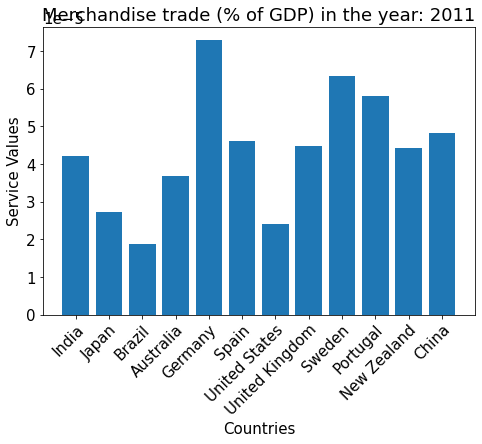

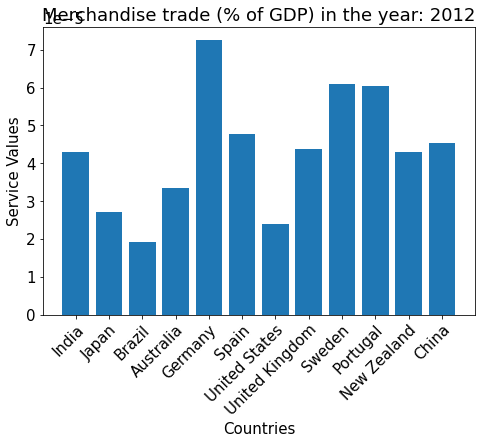

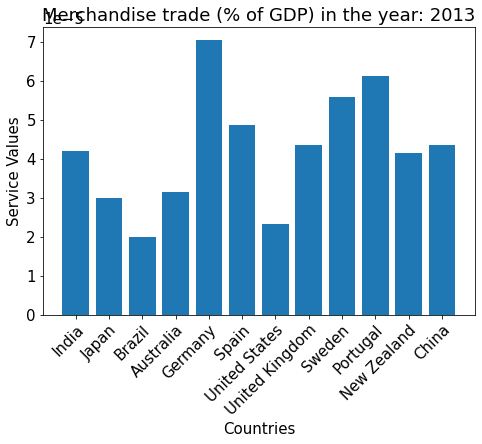

...

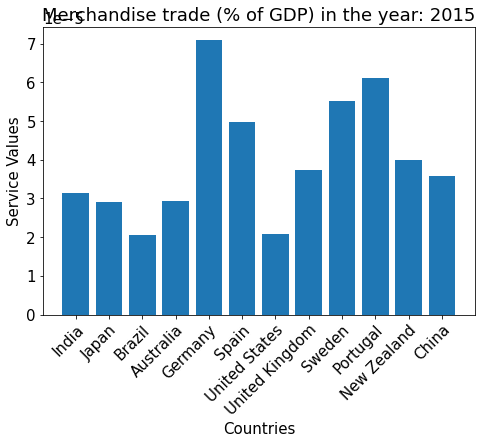

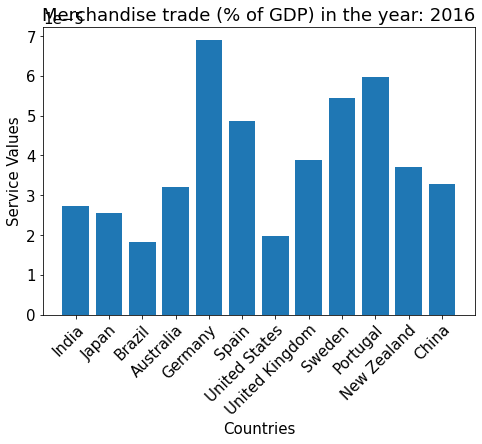

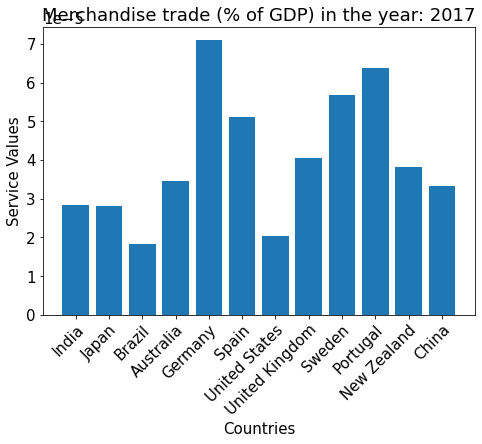

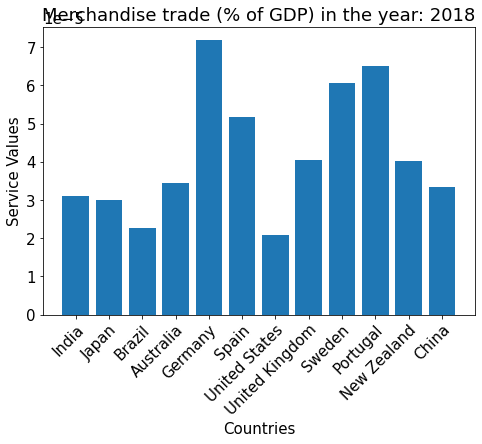

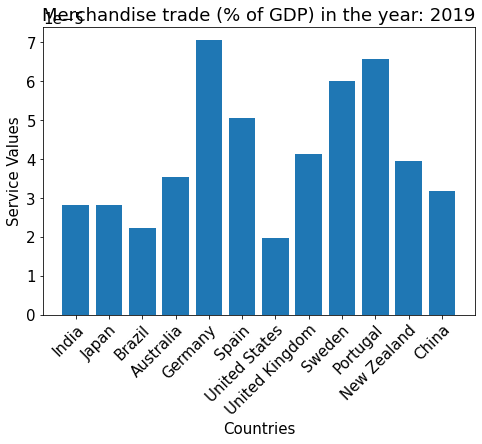

In [ ]:
# for each year we plot the merchandise trade % gdp values bar graphs of all countries by calling plot_bar_countries_time_series_data method
for year in years:
    plot_bar_countries_time_series_data(services_dict,countries,'Merchandise trade (% of GDP)',year)

In [ ]:
# plots line graph for two service value lines given for an year 
def plot_countries_import_export(services_dict,countries,service1,service2,year):
    # gather and store the values of service1 corresponding to the year
    country_dict1={}
    for country in countries:
        country_dict1[country]=services_dict[service1][country][year]
    # gather and store the values of service2 corresponding to the year   
    country_dict2={}
    for country in countries:
        country_dict2[country]=services_dict[service2][country][year]
        
    plotme1 = country_dict1
    plotme2 = country_dict2
    # set the x_axis values or labels
    labels = list(plotme1.keys())[2:]
    x_values = list(range(len(labels)))
    # filter out the correct float service values and store as two y_value lists
    y1_values = [float(val) if val != '..' else 0 for val in list(plotme1.values())[2:]]
    y2_values = [float(val) if val != '..' else 0 for val in list(plotme2.values())[2:]]
    # set figure size
    fig = plt.figure(figsize=(10,5))
    # plot both the lines corresponding to service 1 and service 2 with different marker and colors
    plt.plot( x_values, y1_values, marker='o', markerfacecolor='blue', color='skyblue', linewidth=4,label=service1)
    plt.plot( x_values, y2_values, marker='*', markerfacecolor='green',color='lightgreen', linewidth=4, label=service2)
    # set x axis ticks and set the year format correctly
    x = list(range(len(labels)))
    plt.xticks(x,labels)
    fig.autofmt_xdate()
    # set the title and labels
    plt.title('{} vs {} in the year : {}'.format(service1,service2,year))
    plt.xlabel('Countries')
    plt.ylabel('Service values')
    # set the legend
    plt.legend(loc='upper right')
    # plot the line graph
    plt.show()

In [ ]:
# plots bar graph for two service value lines given for an year 
def plot_bar_countries_import_export(services_dict,countries,service1,service2,year):
    # gather and store the values of service1 corresponding to the year
    country1_list=[]
    for country in countries:
        val=services_dict[service1][country][year]
        if val!='..':
            val=float(val)
        else:
            val=0
        country1_list.append(val)
    # gather and store the values of service2 corresponding to the year 
    country2_list=[]
    for country in countries:
        val=services_dict[service2][country][year]
        if val!='..':
            val=float(val)
        else:
            val=0
        country2_list.append(val)

    # set the figure size and add axes
    width=0.35
    x = np.arange(12) 
    fig = plt.figure()
    ax = fig.add_axes([0,0,1,1])
    # plot both the bars corresponding to service 1 and service 2 for a country with colors
    ax.bar(x-0.2,country1_list, width, label=service1)
    ax.bar(x+0.2,country2_list, width, label=service2)
    # set the x axis ticks and tick labels
    ax.set_xticks(x)
    ax.set_xticklabels(countries,rotation=45, rotation_mode="anchor", ha="right")
    # set x and y axis labels
    plt.xlabel('Countries')
    plt.ylabel('Service Values')
    # add title and legend
    plt.title('{} vs {} in the year: {}'.format(service1,service2,year)) 
    plt.legend(loc='upper right')
    # plot the multiple bar plot
    plt.show()

### Plotting Imports (%GDP) vs Exports (%GDP) of goods and services between all countries for each of the years 

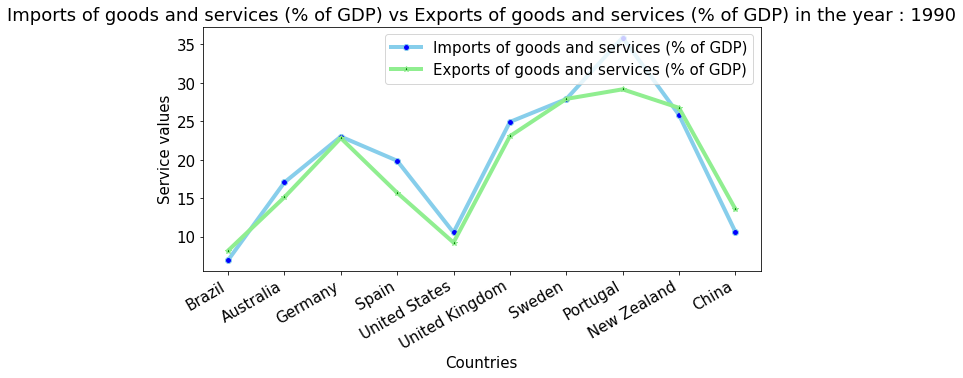

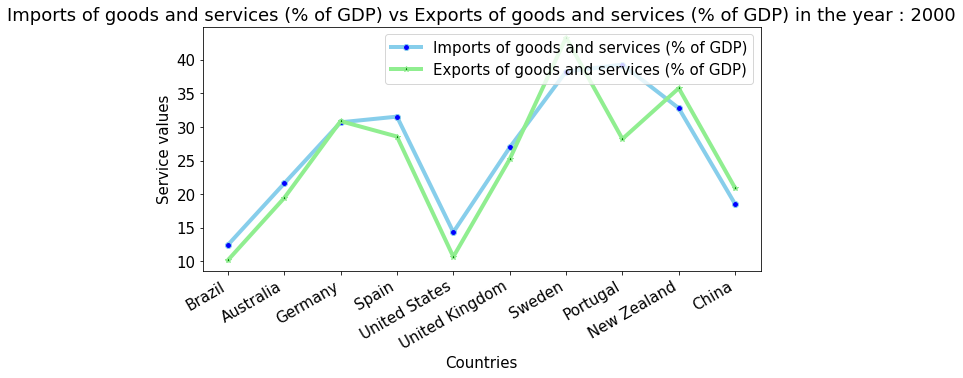

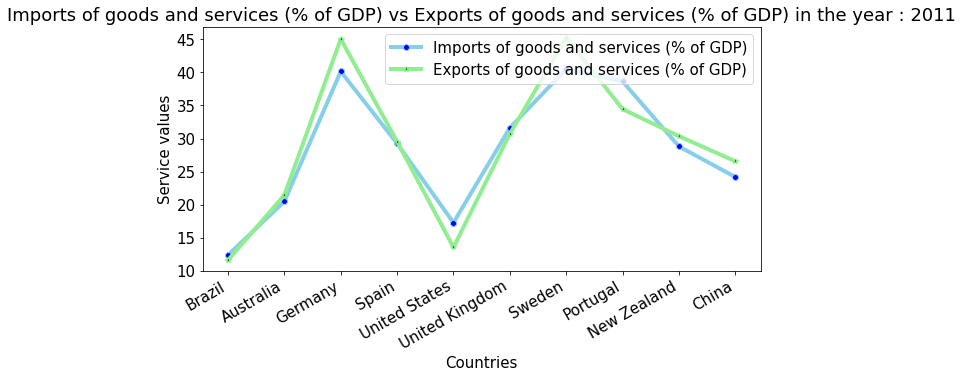

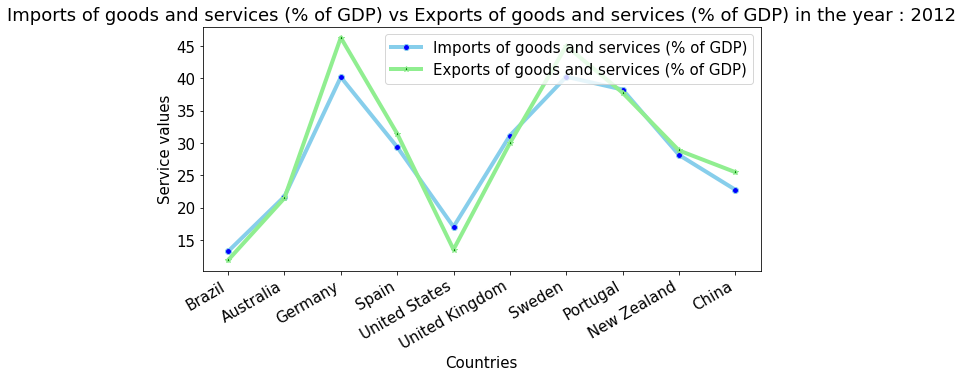

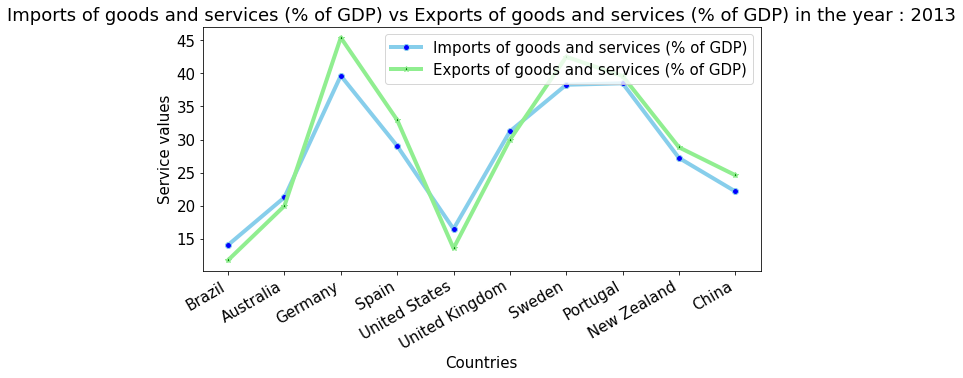

...

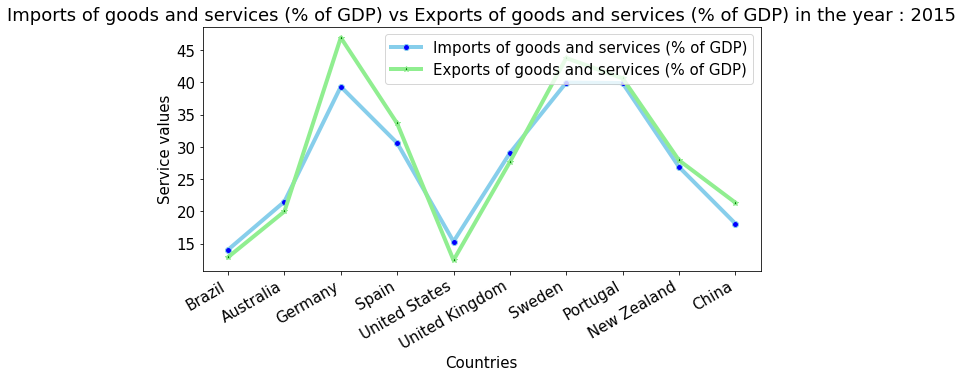

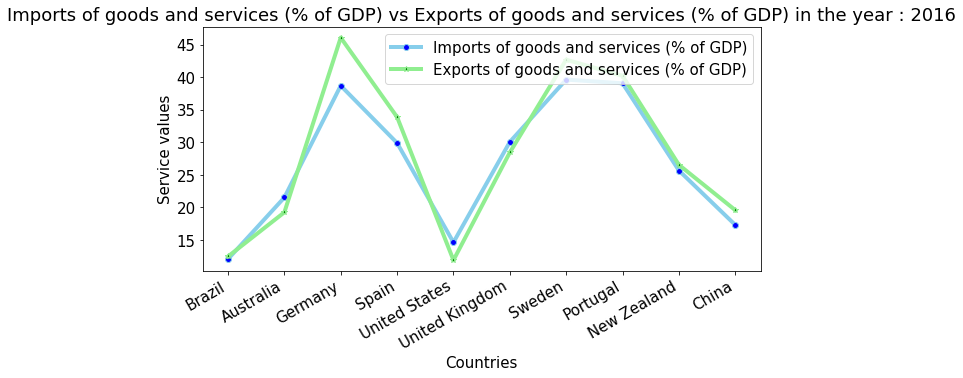

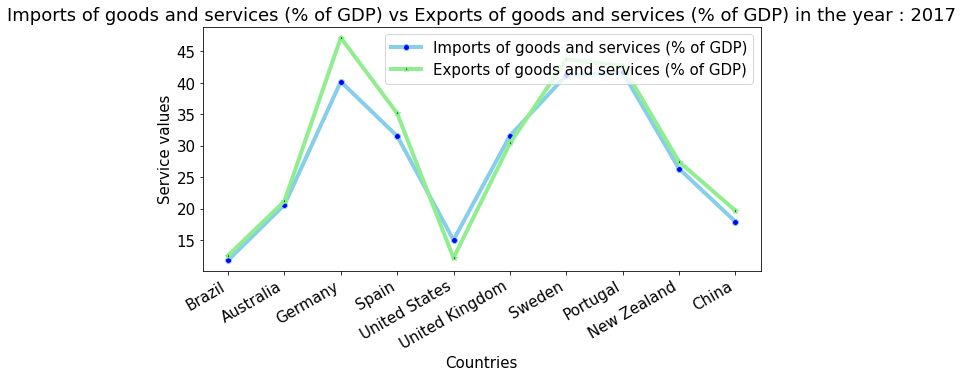

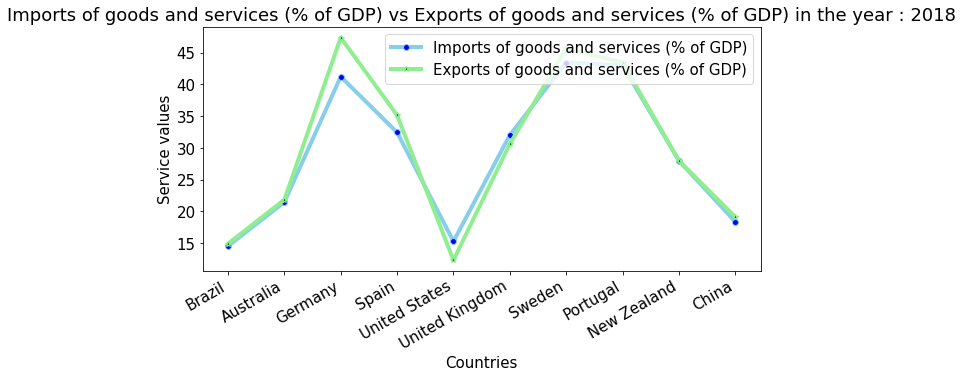

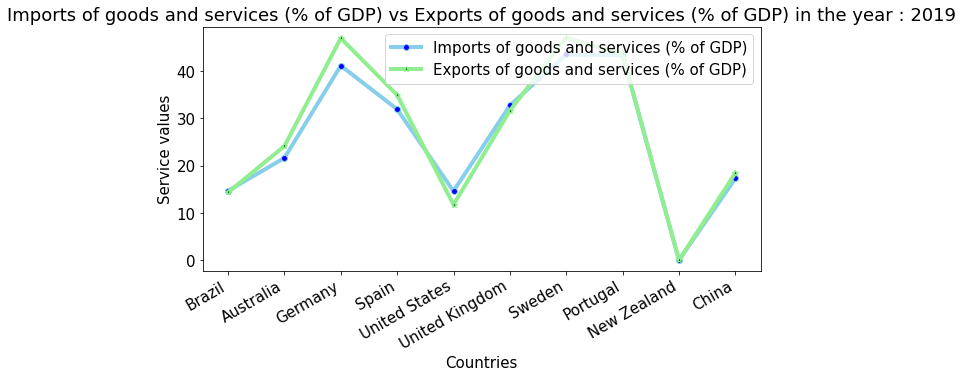

In [ ]:
# for each year we plot the import and export % gdp values line graphs of all countries by calling plot_countries_import_export method
for year in years:
    service1='Imports of goods and services (% of GDP)'
    service2='Exports of goods and services (% of GDP)'
    plot_countries_import_export(services_dict,countries,service1,service2,year)

In [ ]:
# for each year we plot the import and export % gdp values bar graphs of all countries by calling plot_bar_countries_import_export method
for year in years:
    service1='Imports of goods and services (% of GDP)'
    service2='Exports of goods and services (% of GDP)'
    plot_bar_countries_import_export(services_dict,countries,service1,service2,year)

### Plotting Food Imports (% Merchandise imports) vs Food Exports (% Merchandise exports) between all countries for each of the years

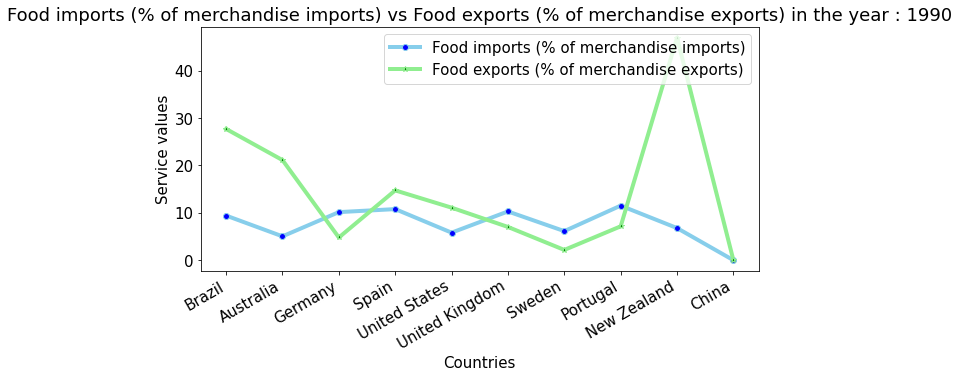

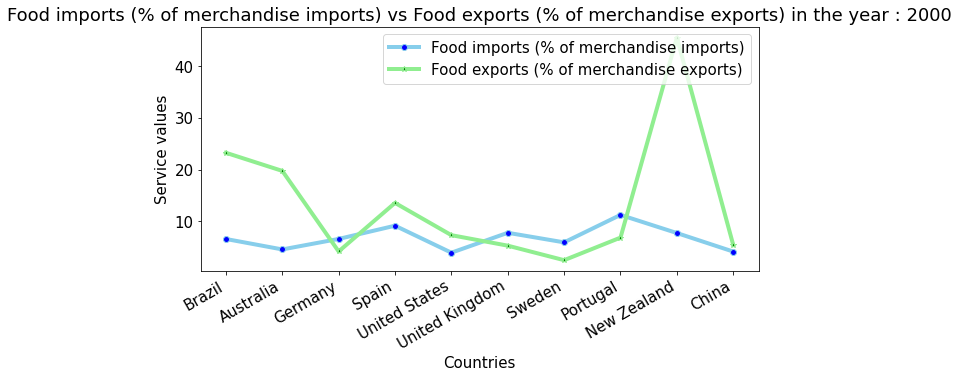

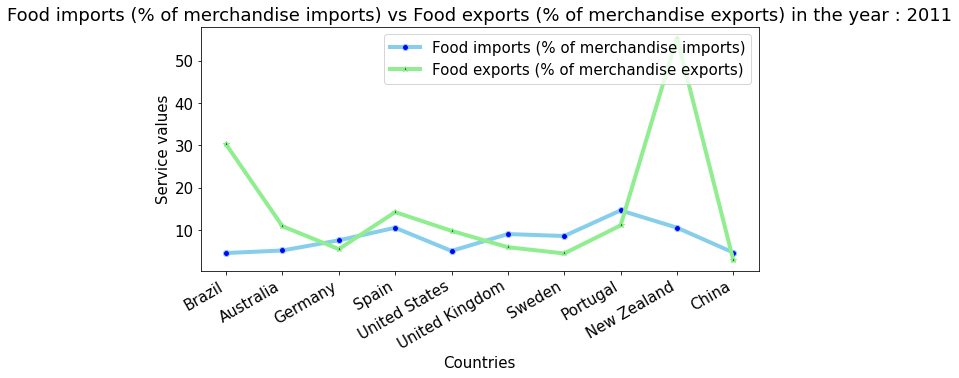

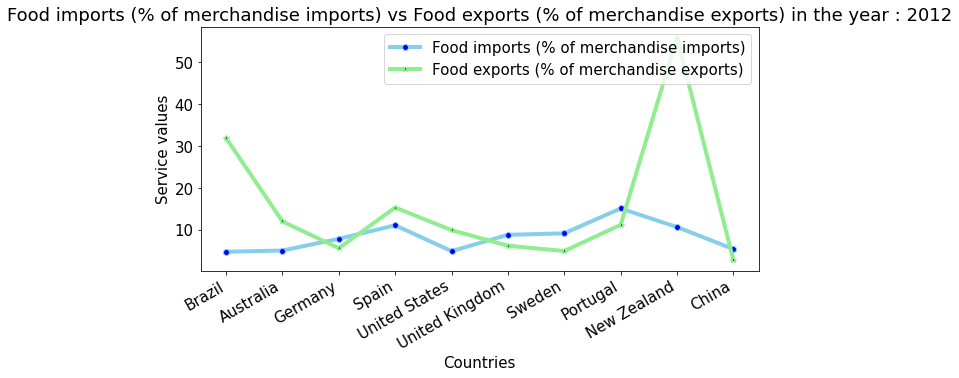

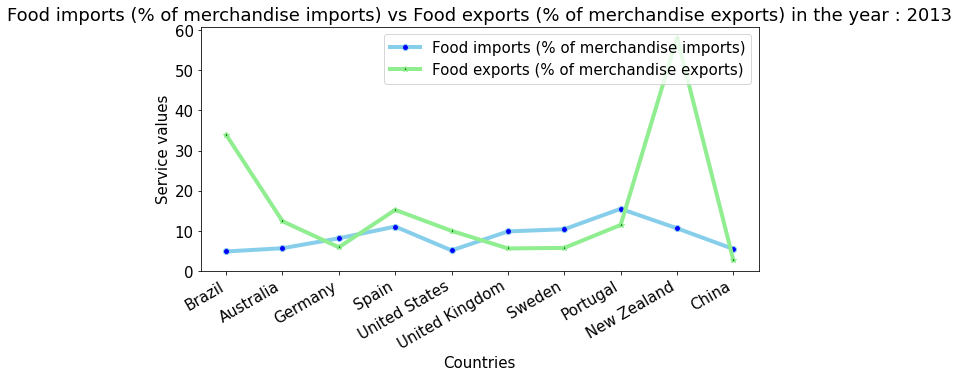

...

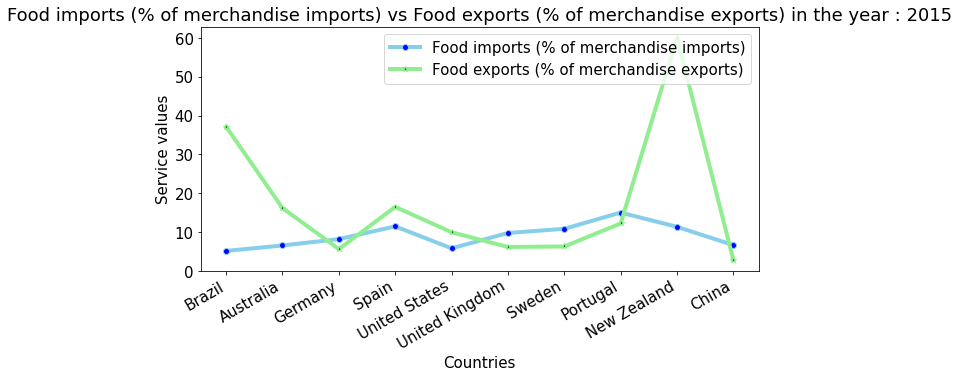

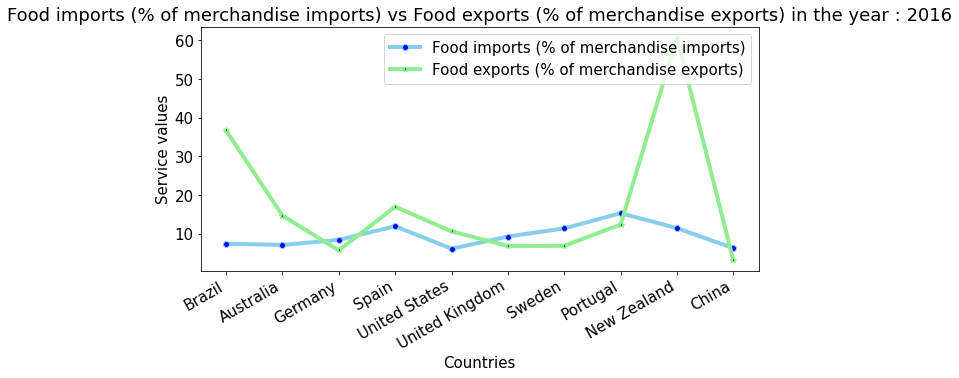

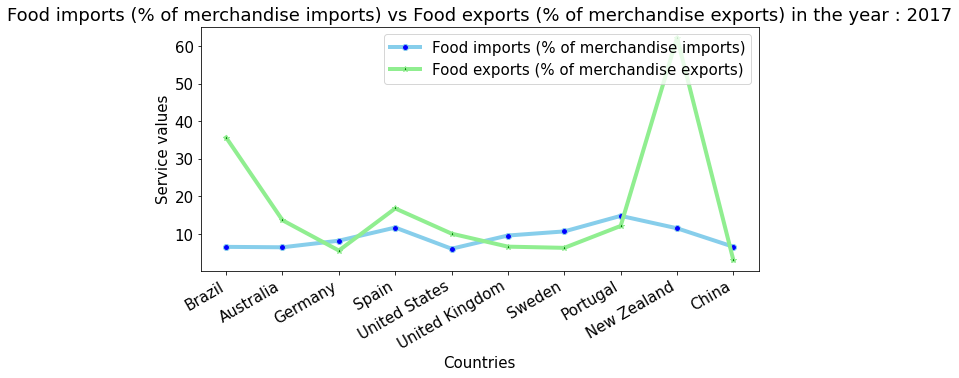

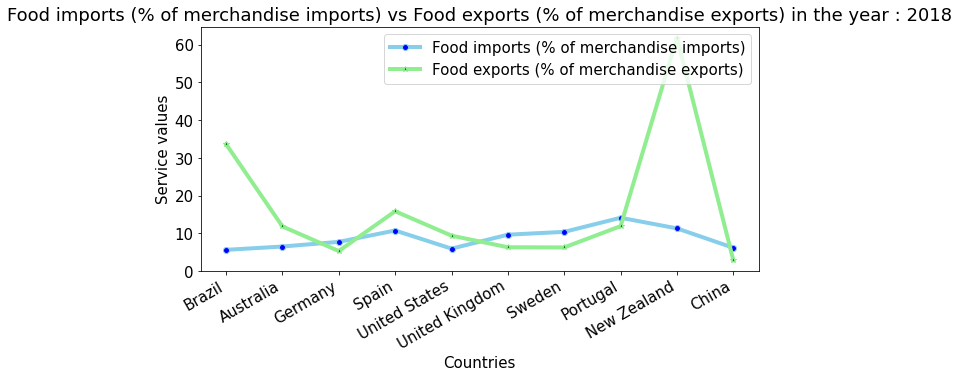

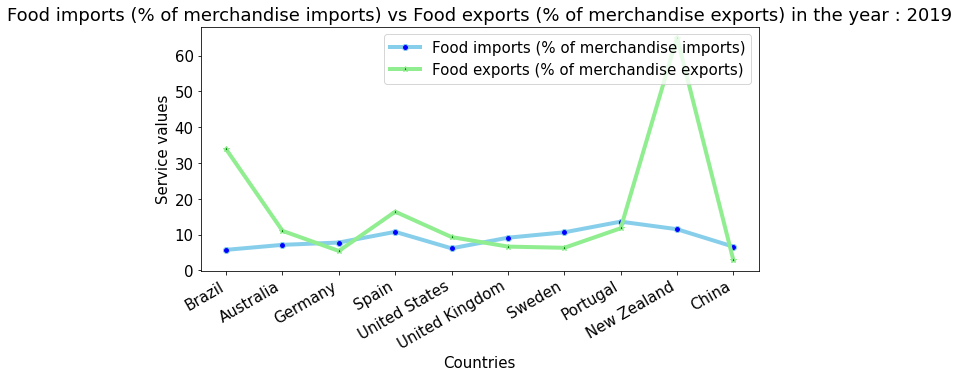

In [ ]:
# for each year we plot the food import and export values line graphs of all countries by calling plot_countries_import_export method
for year in years:
    service1='Food imports (% of merchandise imports)'
    service2='Food exports (% of merchandise exports)'
    plot_countries_import_export(services_dict,countries,service1,service2,year)

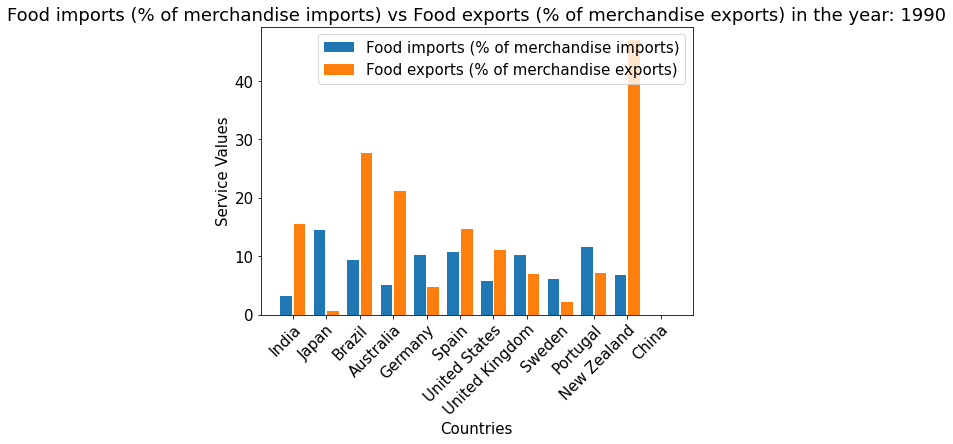

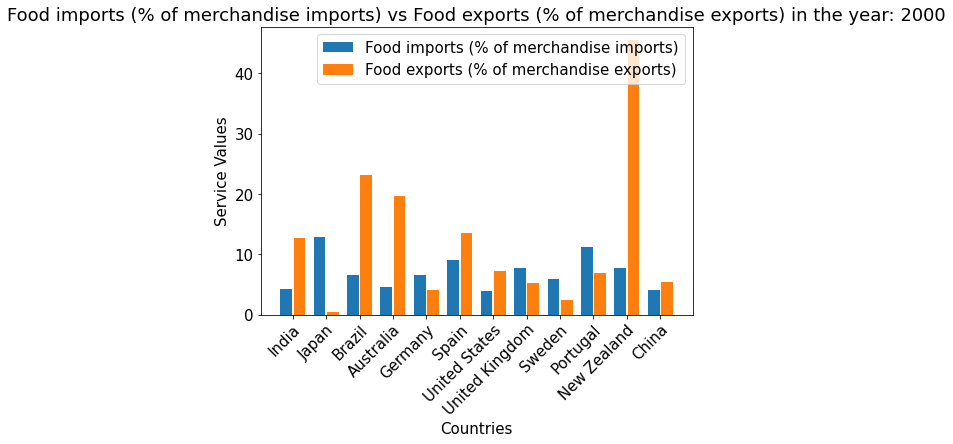

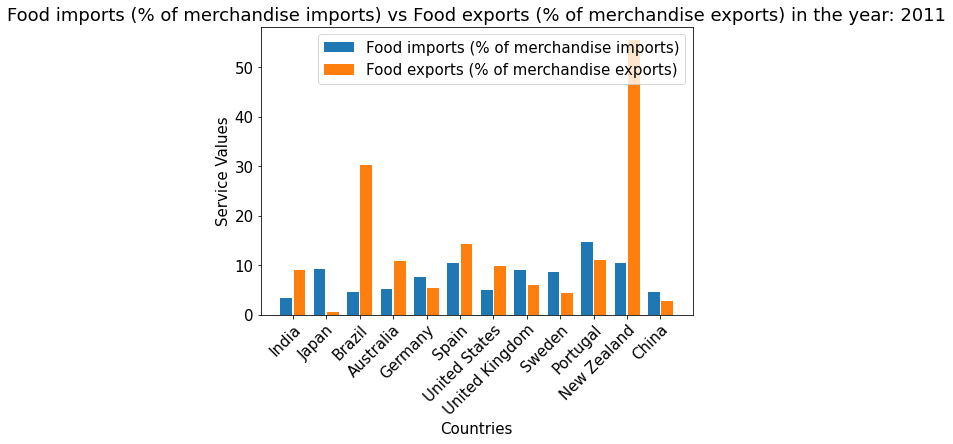

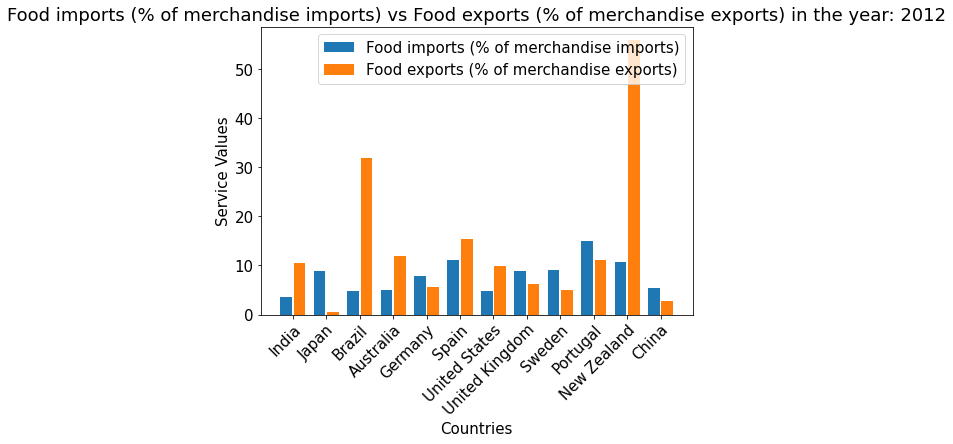

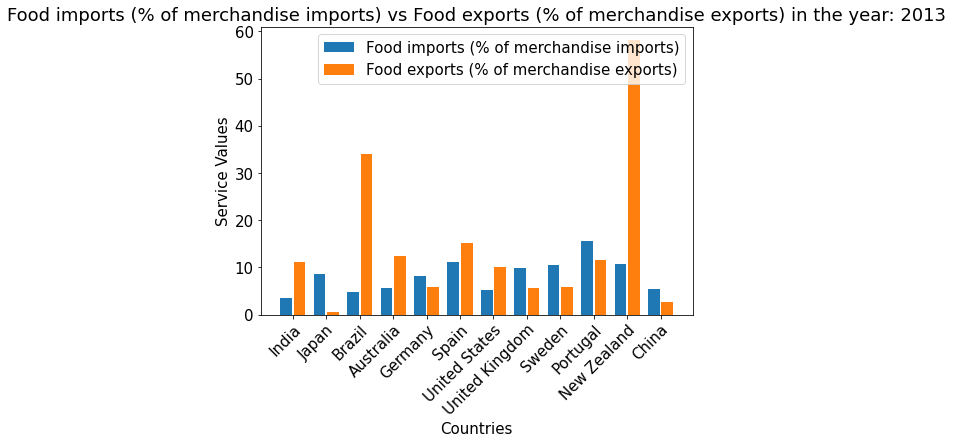

...

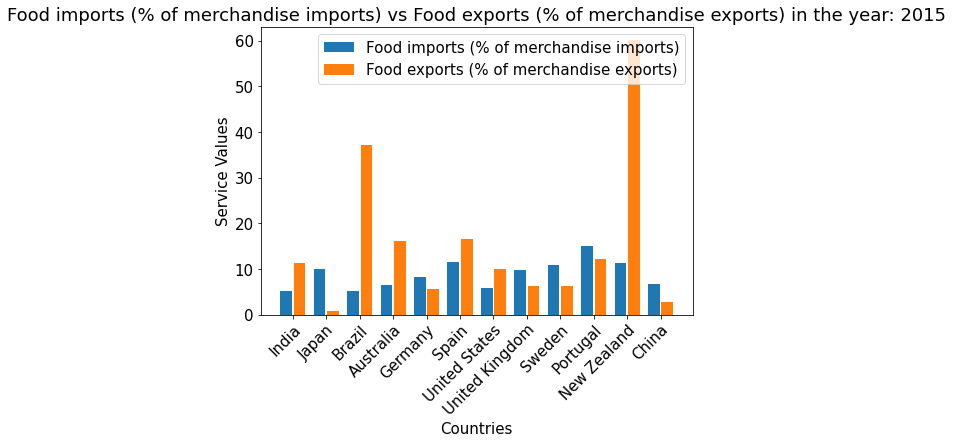

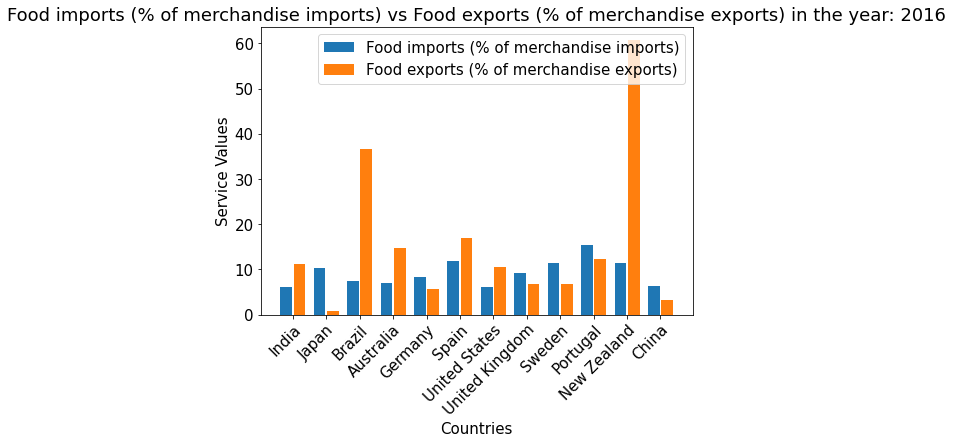

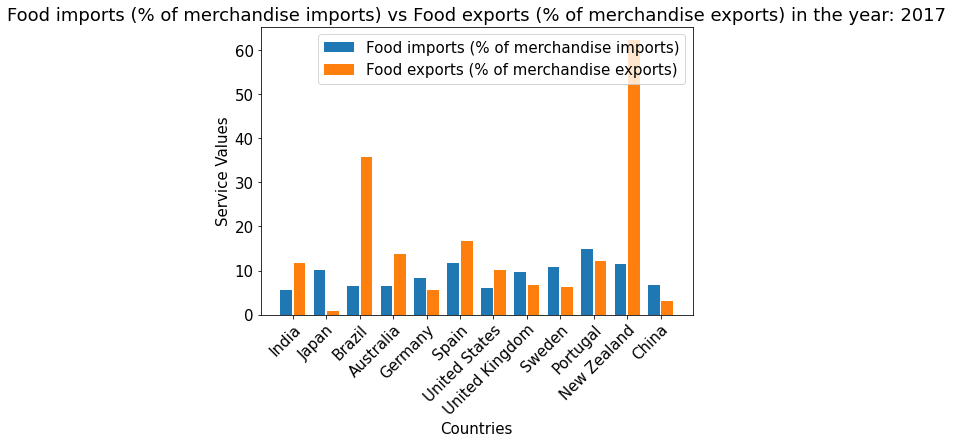

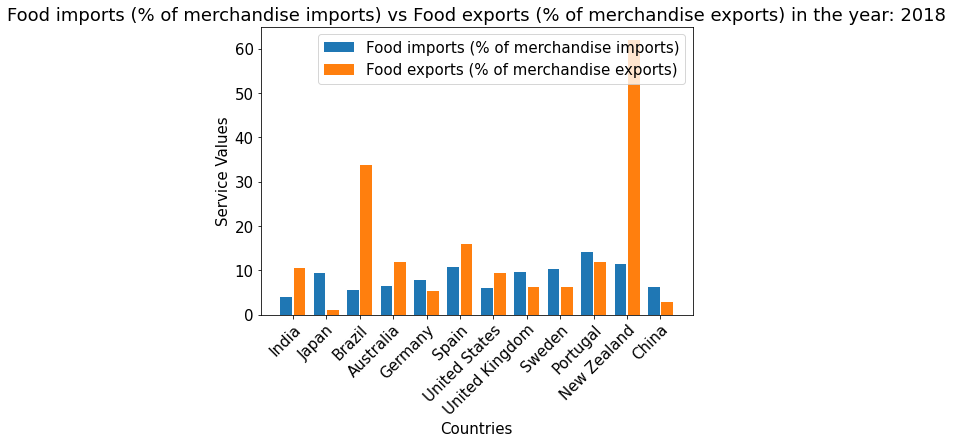

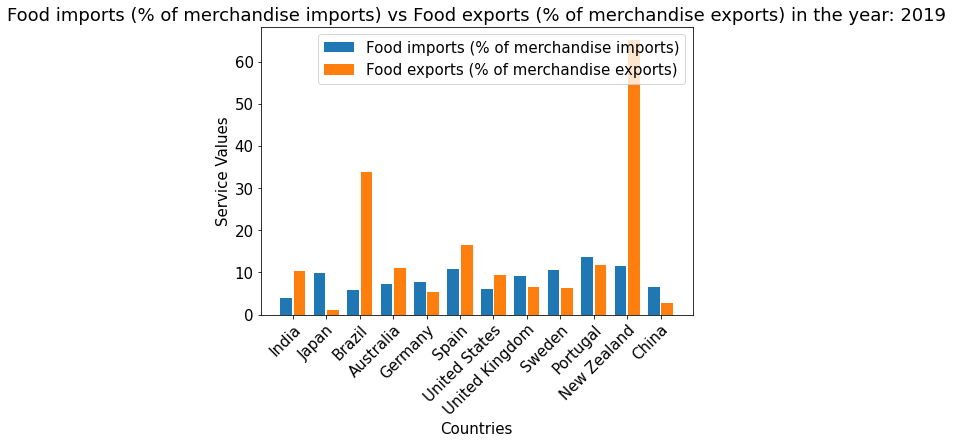

In [ ]:
# for each year we plot the food import and export values bar graphs of all countries by calling plot_bar_countries_import_export method
for year in years:
    service1='Food imports (% of merchandise imports)'
    service2='Food exports (% of merchandise exports)'
    plot_bar_countries_import_export(services_dict,countries,service1,service2,year)

### Plotting Fuel Imports (% Merchandise imports) vs Fuel Exports (% Merchandise exports) between all countries for each of the years

In [ ]:
# for each year we plot the fuel import and export values line graphs of all countries by calling plot_countries_import_export method
for year in years:
    service1='Fuel imports (% of merchandise imports)'
    service2='Fuel exports (% of merchandise exports)'
    plot_countries_import_export(services_dict,countries,service1,service2,year)

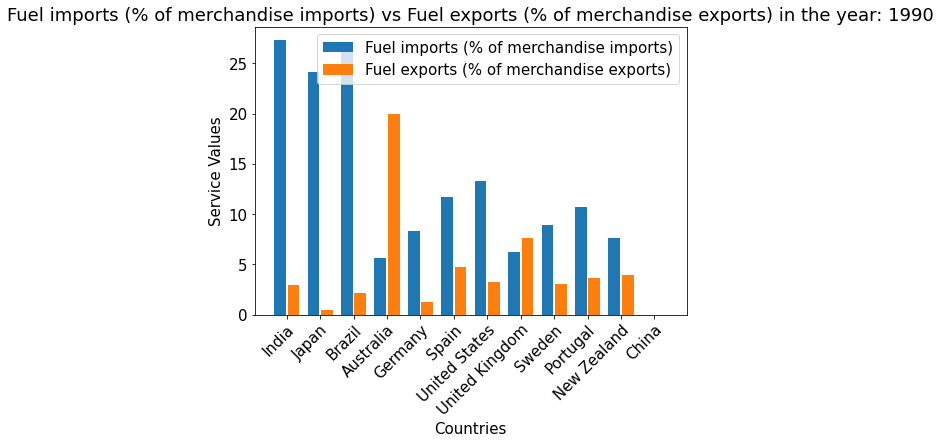

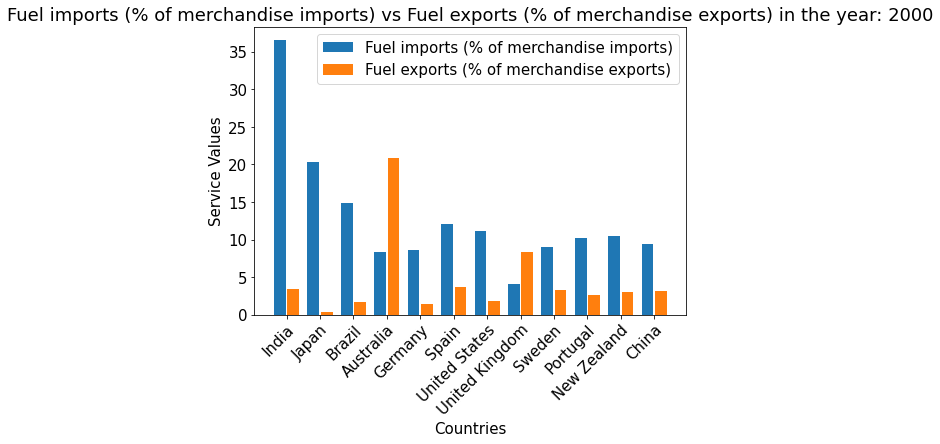

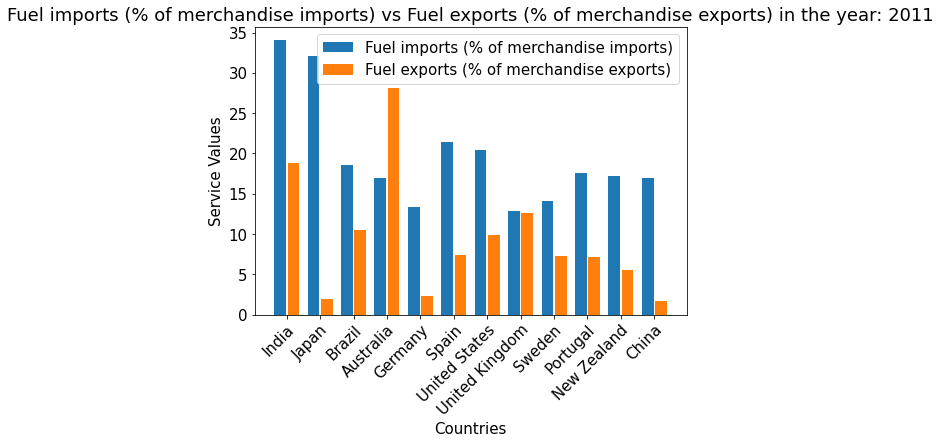

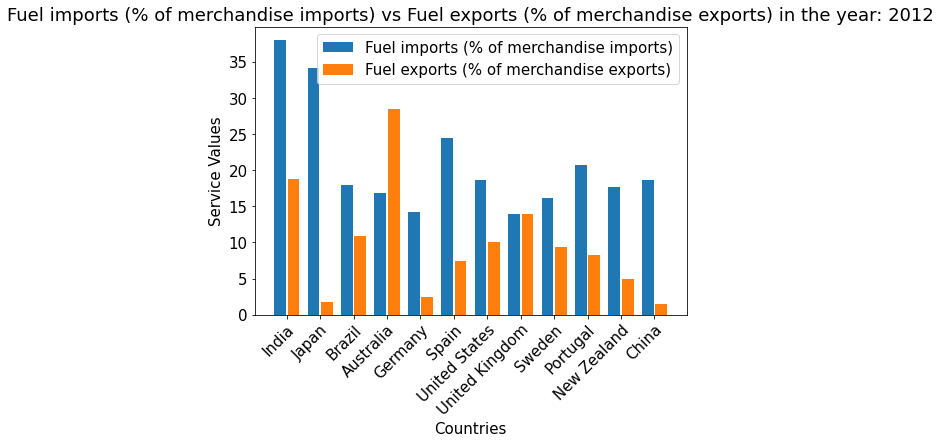

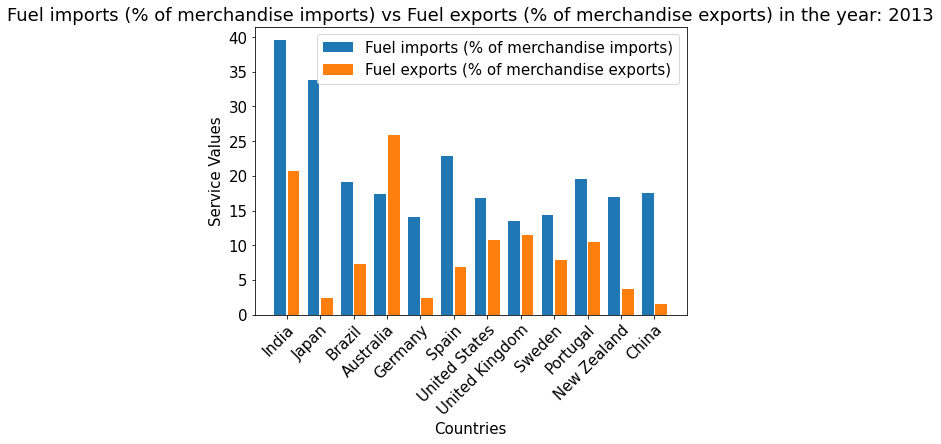

...

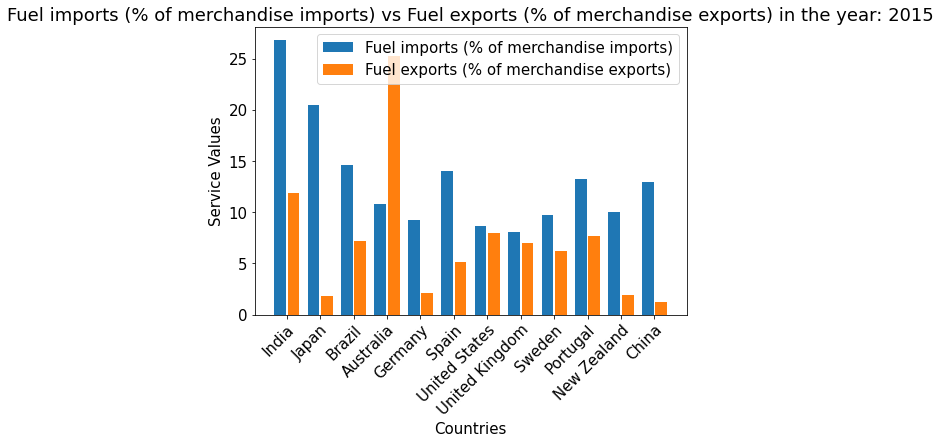

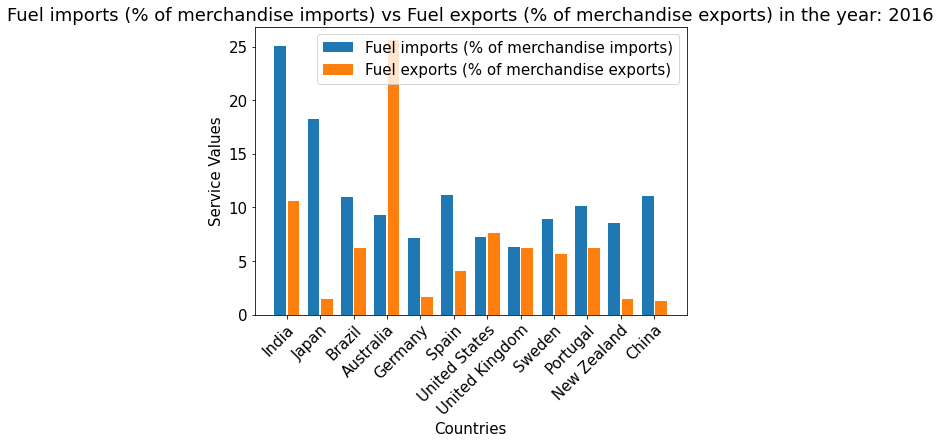

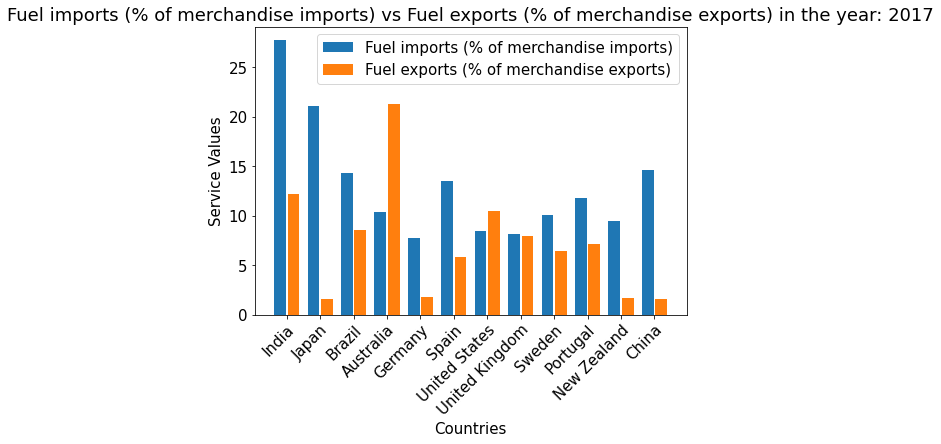

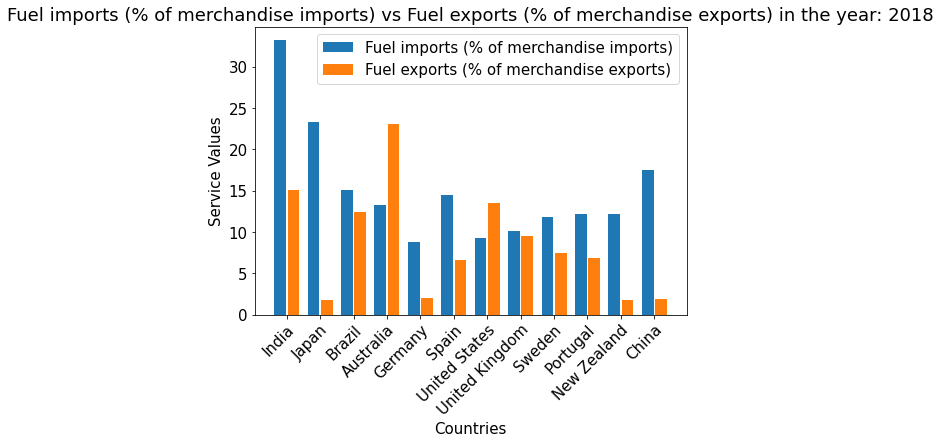

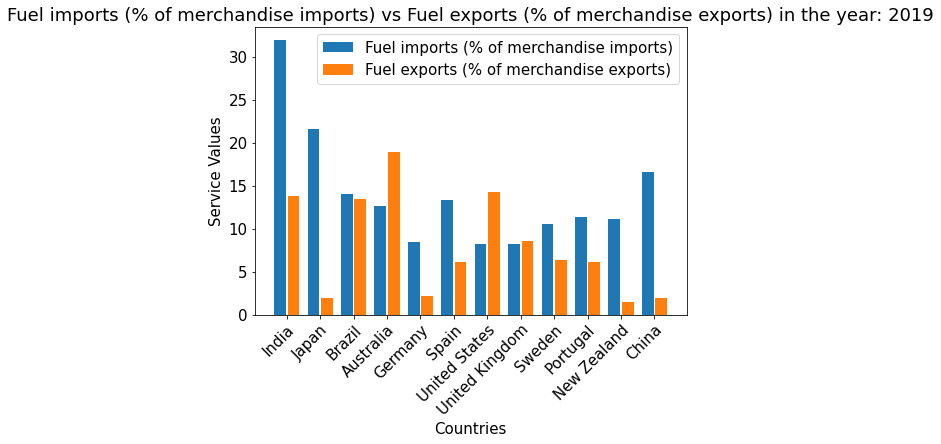

In [ ]:
# for each year we plot the fuel import and export values bar graphs of all countries by calling plot_bar_countries_import_export method
for year in years:
    service1='Fuel imports (% of merchandise imports)'
    service2='Fuel exports (% of merchandise exports)'
    plot_bar_countries_import_export(services_dict,countries,service1,service2,year)

### Plotting Import value index vs Export value index (2000=100) between all countries for each of the years

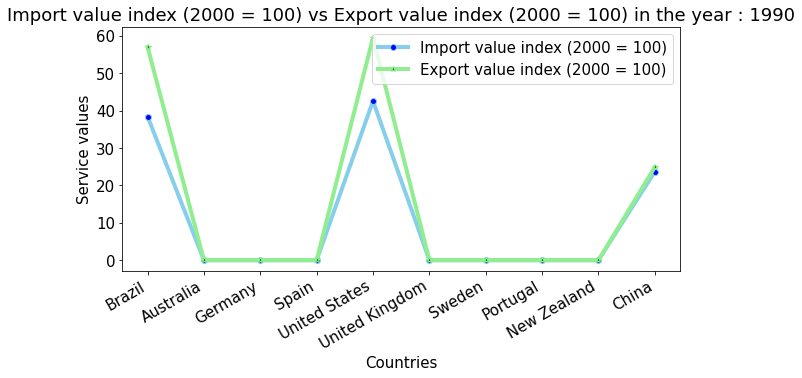

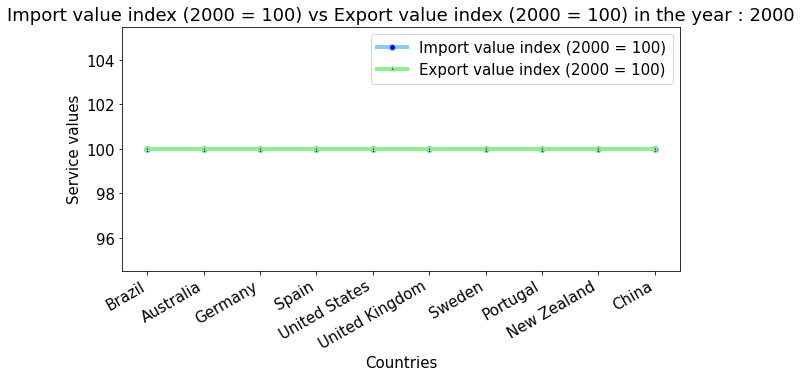

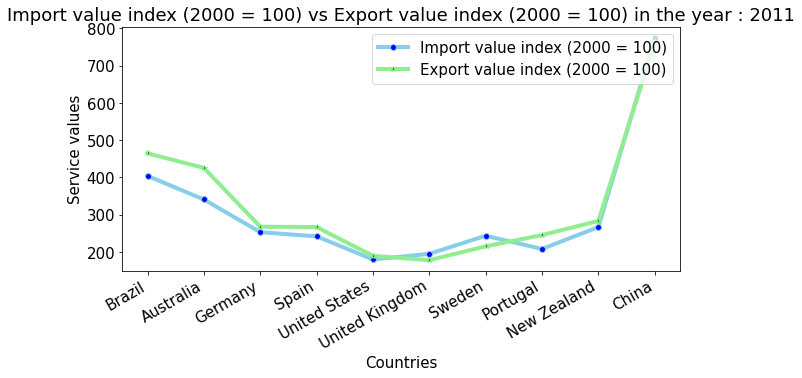

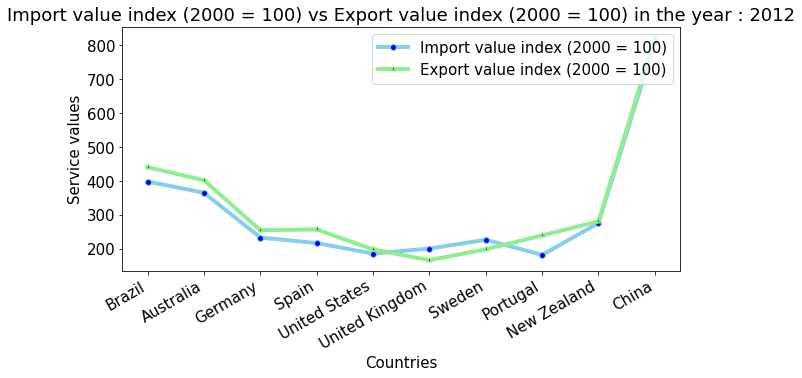

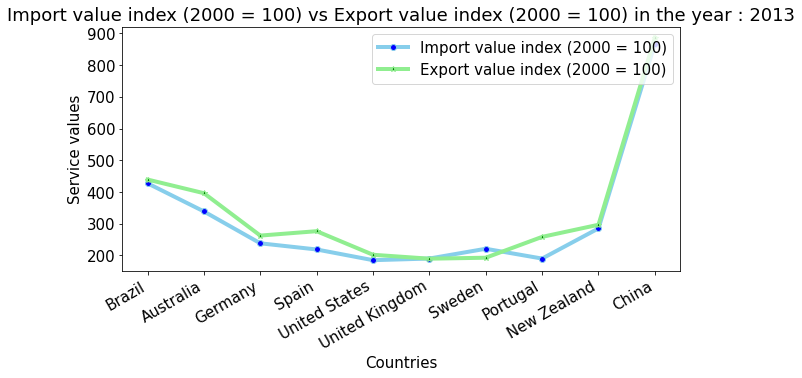

...

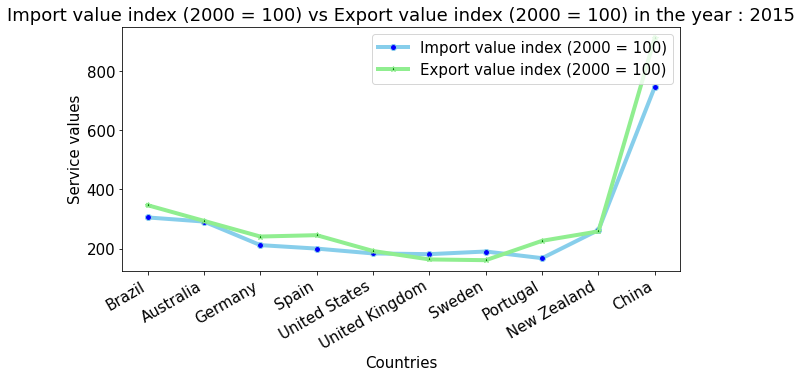

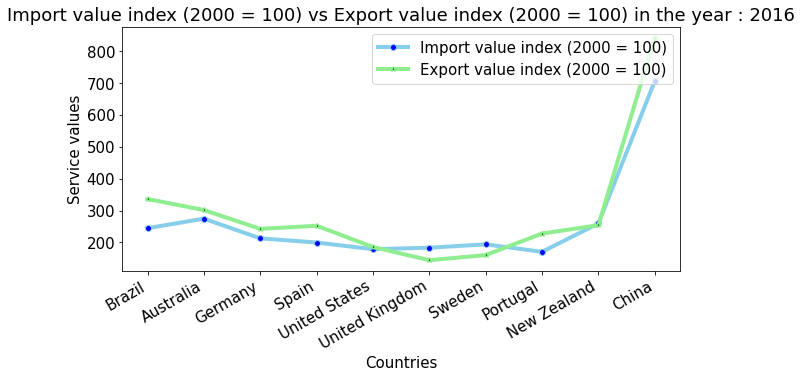

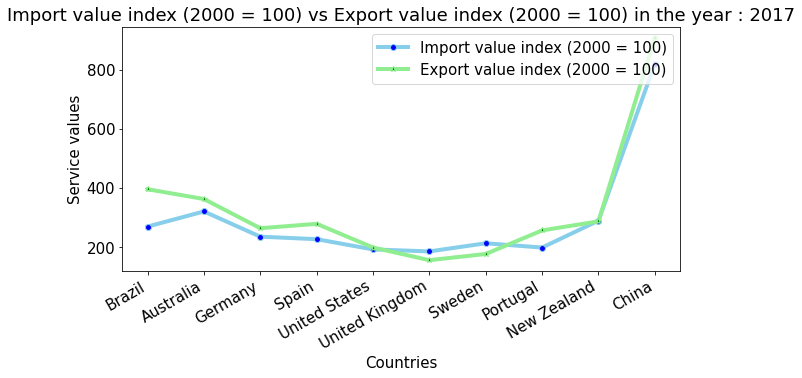

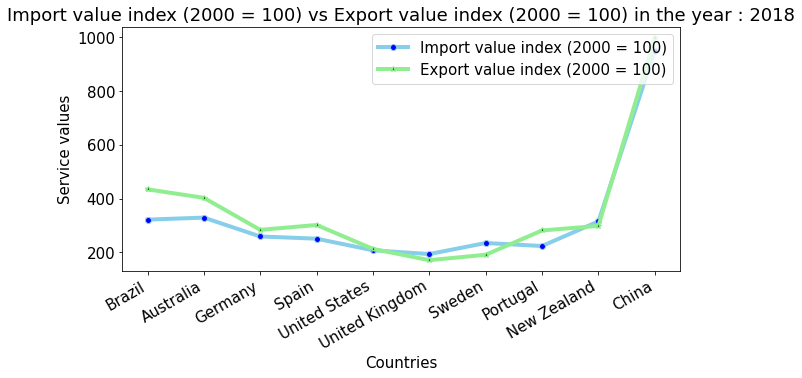

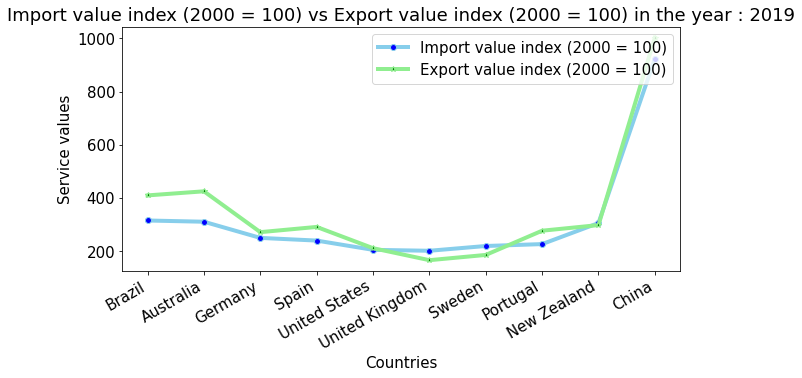

In [ ]:
# for each year we plot the import and export value index line graphs of all countries by calling plot_countries_import_export method
for year in years:
    service1='Import value index (2000 = 100)'
    service2='Export value index (2000 = 100)'
    plot_countries_import_export(services_dict,countries,service1,service2,year)

In [ ]:
# for each year we plot the import and export value index bar graphs of all countries by calling plot_bar_countries_import_export method
for year in years:
    service1='Import value index (2000 = 100)'
    service2='Export value index (2000 = 100)'
    plot_bar_countries_import_export(services_dict,countries,service1,service2,year)

### Plotting Import volume index vs Export volume index (2000=100) between all countries for each of the years 

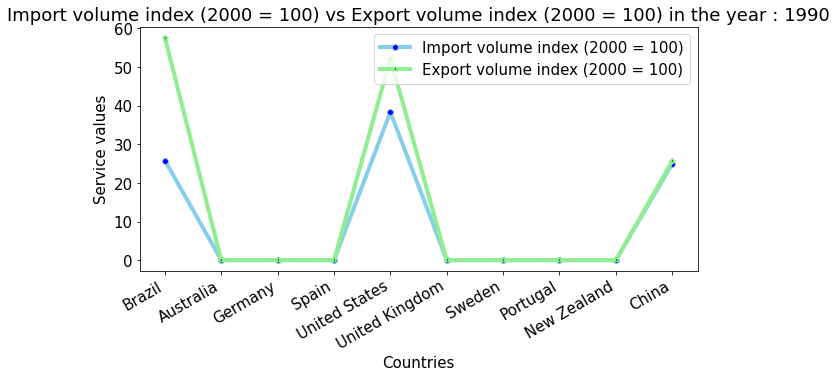

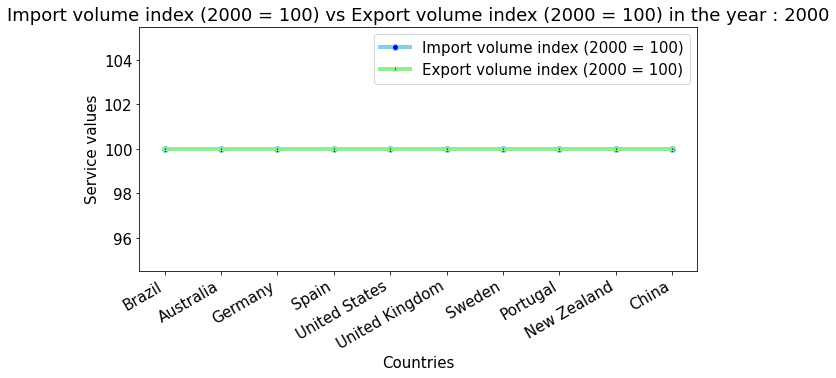

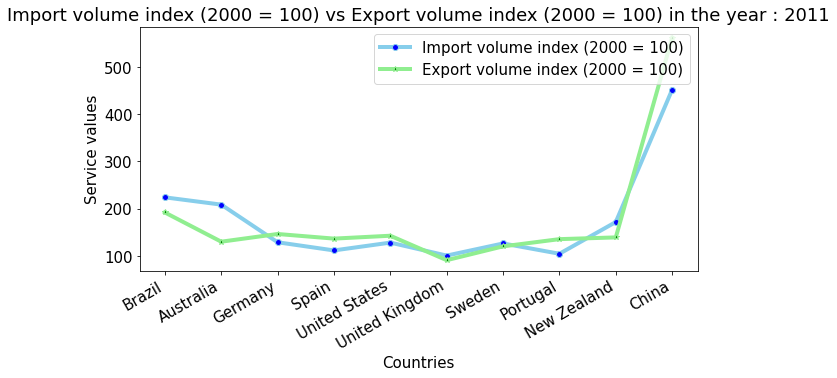

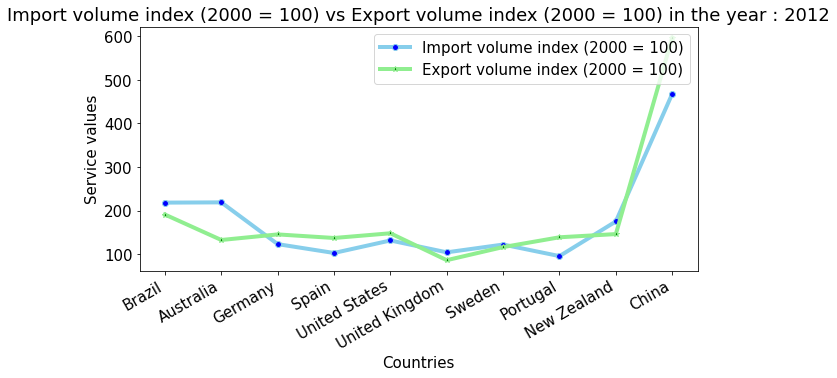

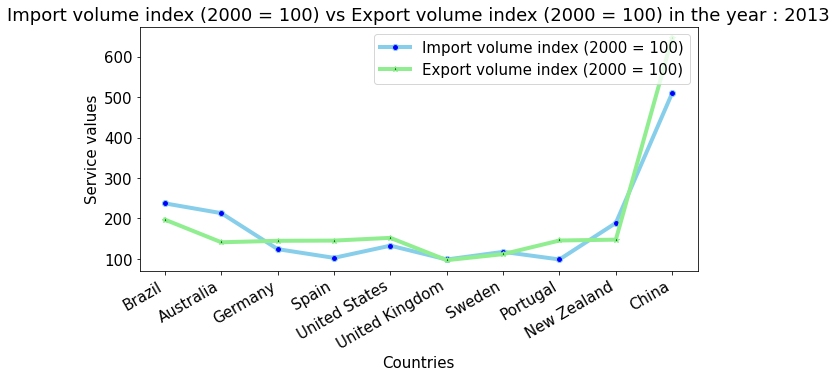

...

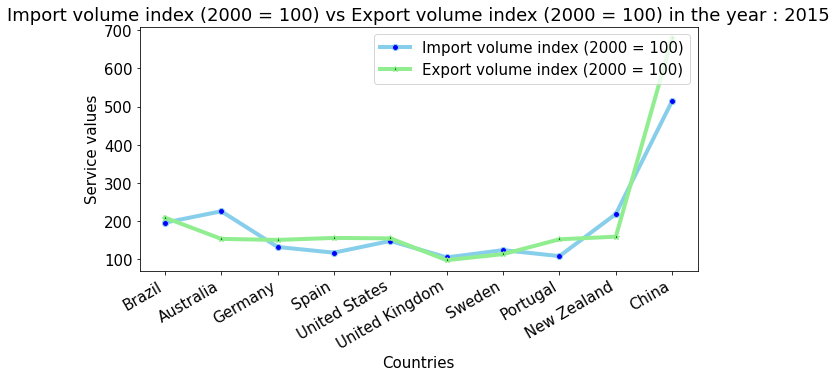

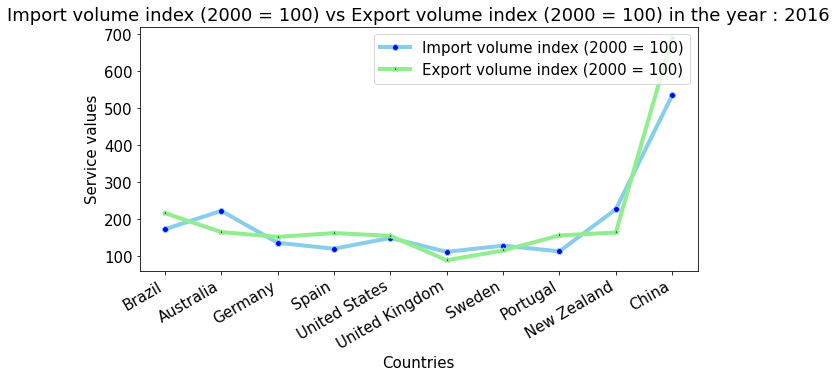

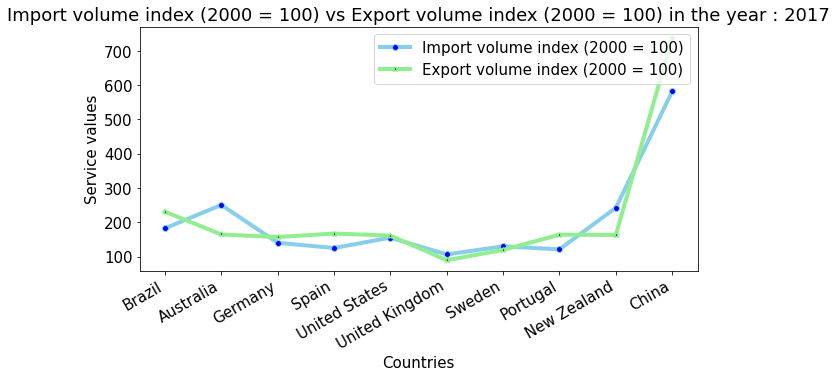

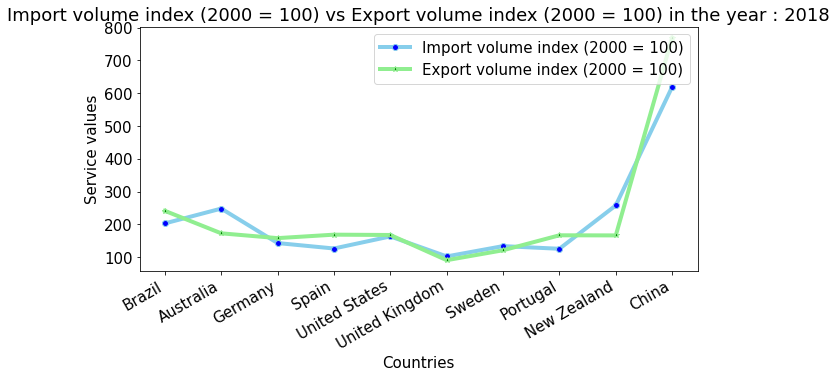

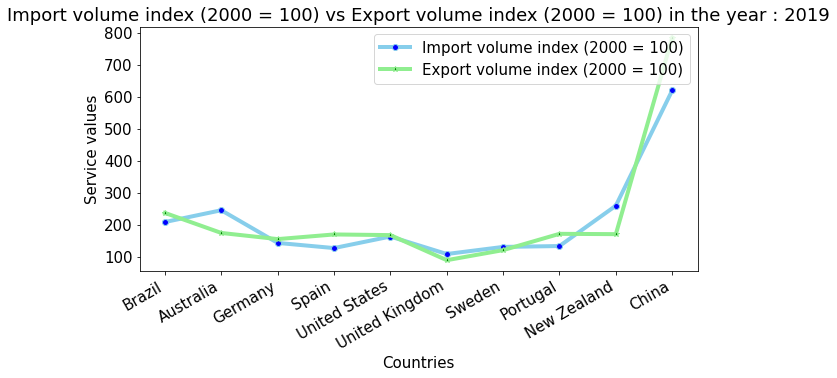

In [ ]:
# for each year we plot the import and export volumn index value line graphs of all countries by calling plot_countries_import_export method
for year in years:
    service1='Import volume index (2000 = 100)'
    service2='Export volume index (2000 = 100)'
    plot_countries_import_export(services_dict,countries,service1,service2,year)

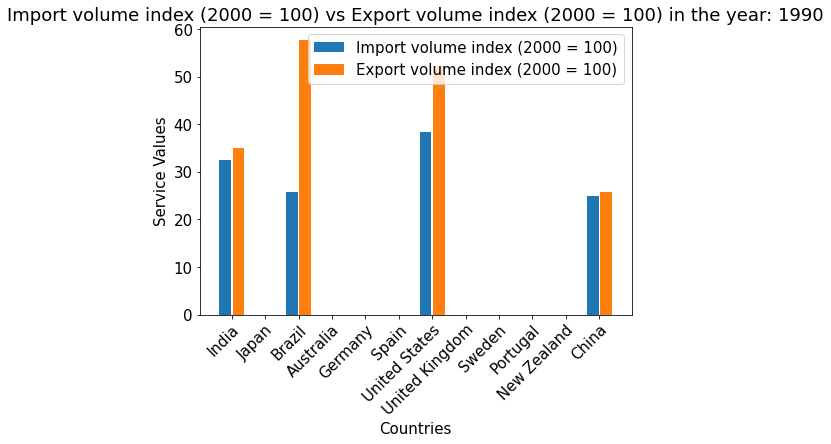

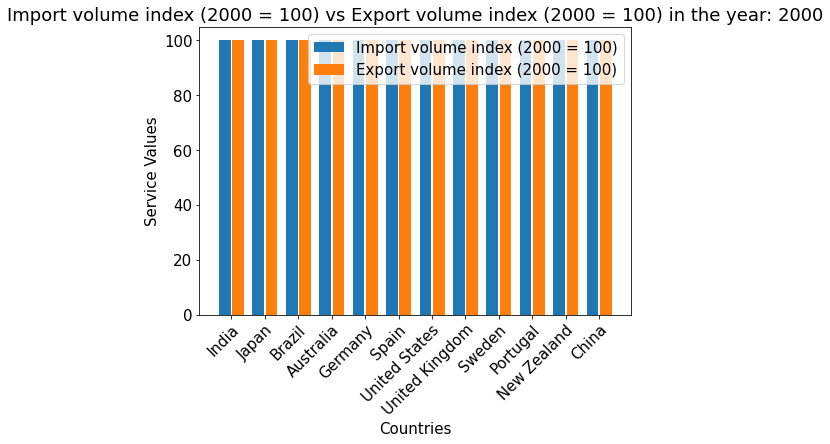

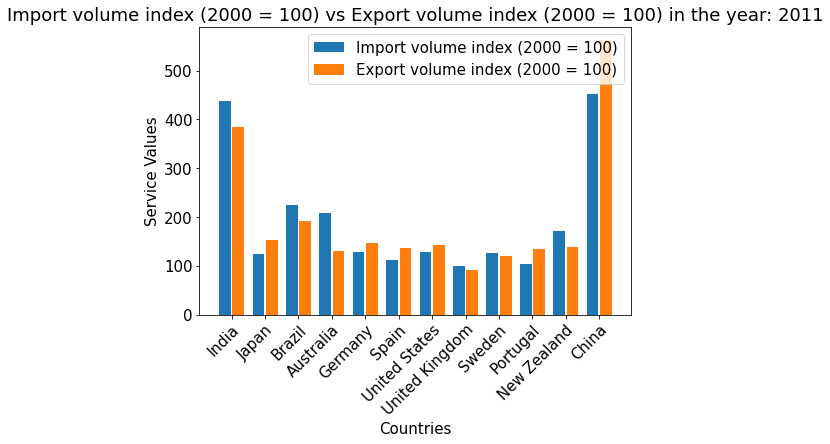

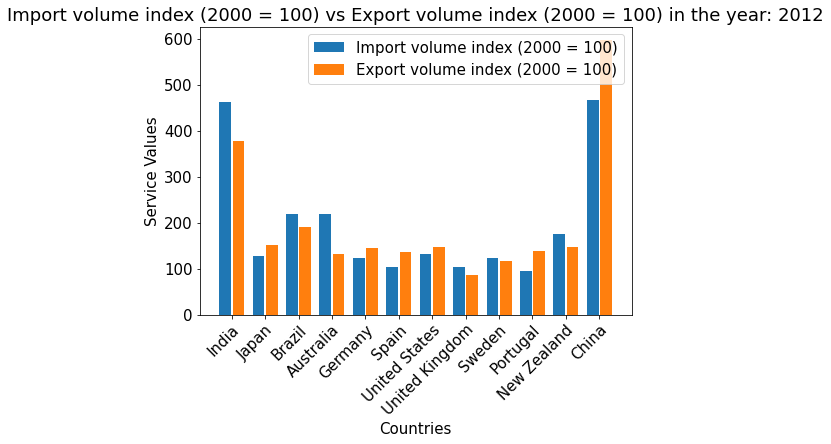

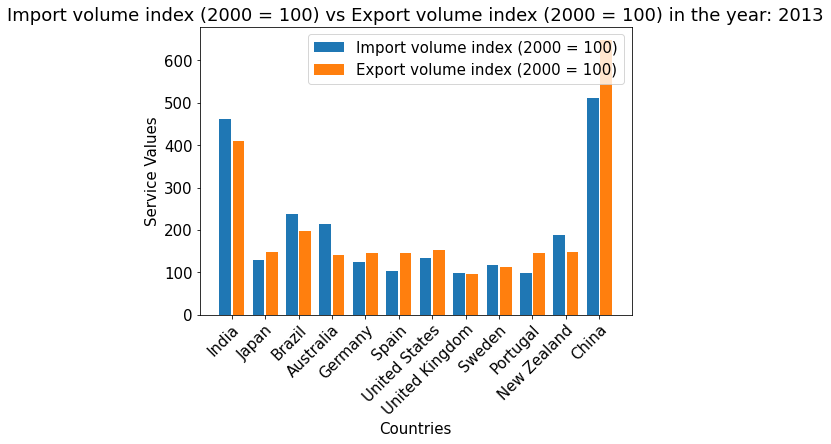

...

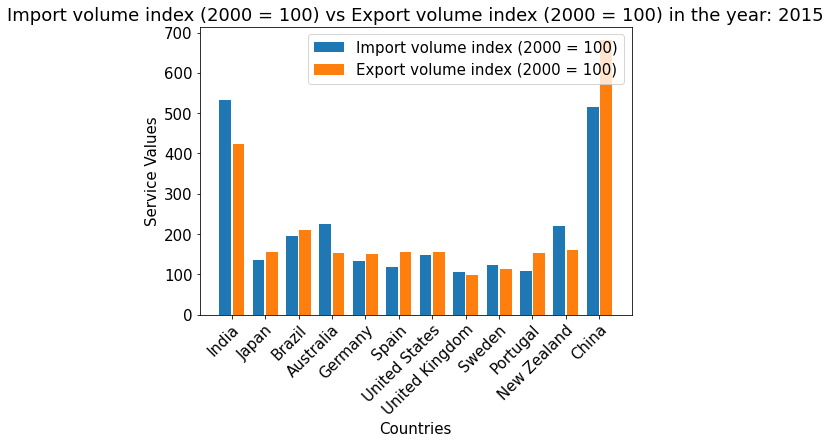

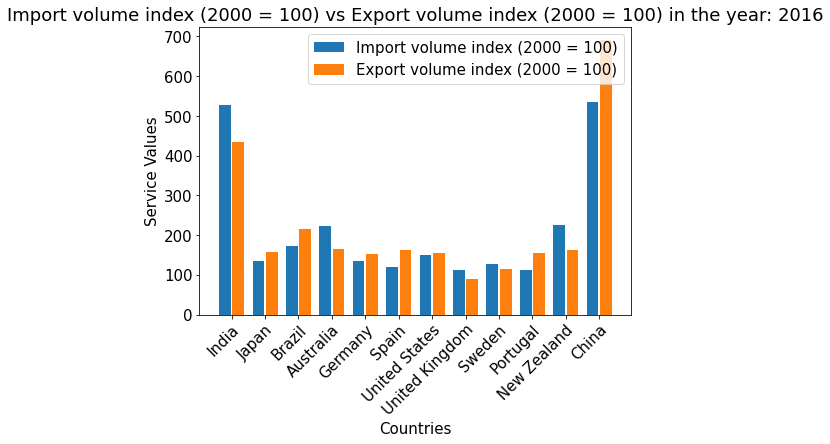

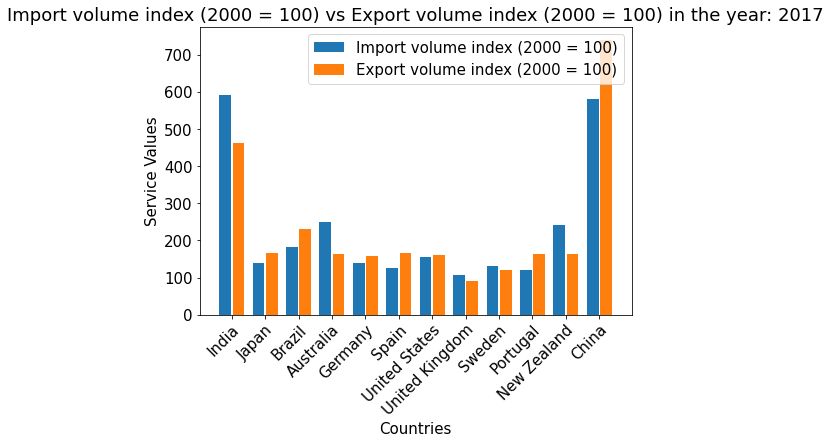

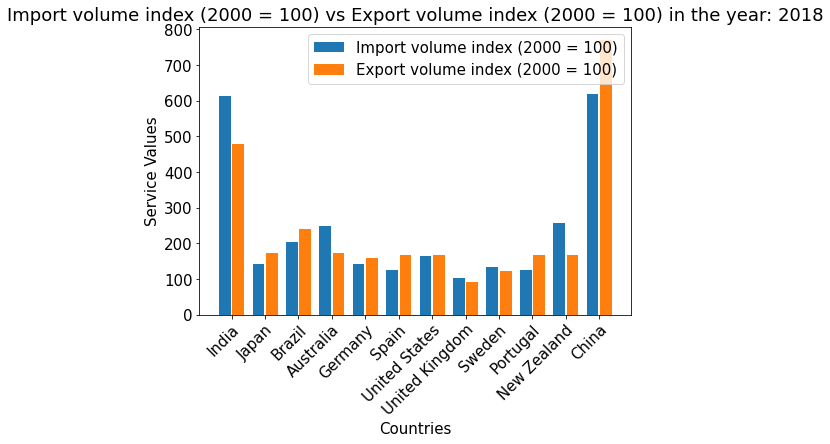

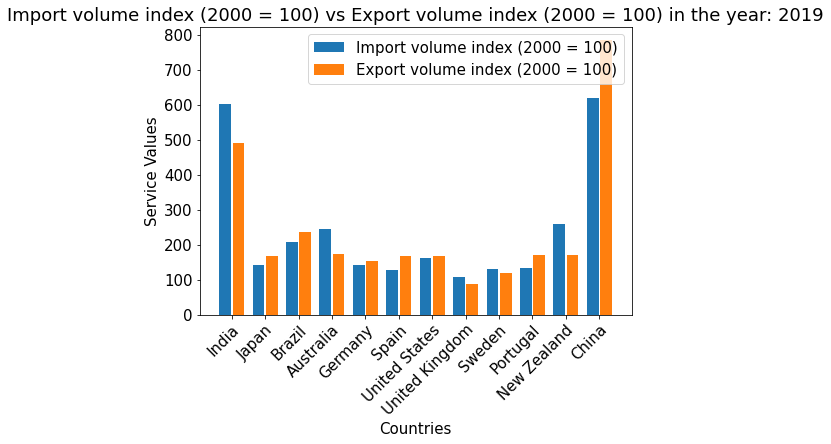

In [ ]:
# for each year we plot the import and export volumn index value bar graphs of all countries by calling plot_bar_countries_import_export method
for year in years:
    service1='Import volume index (2000 = 100)'
    service2='Export volume index (2000 = 100)'
    plot_bar_countries_import_export(services_dict,countries,service1,service2,year)

## Plotting the value ranges of services for each country over the time period 1990-2019

In [ ]:
# returns a boxplot showing service value range for each country over the years
def joyplot_feature_over_years(countries,service,color):
    def get_list(countries,year):# returns list of service values corresponding to all countries from a year
        country_list=[]
        for country in countries:
            val=services_dict[service][country][year]
            if val!='..':
                val=float(val)
            else:
                val=0
            country_list.append(val)
        return country_list
    # using get_list collect all the lists corresponding each year
    list1=get_list(countries,'1990')
    list2=get_list(countries,'2000')
    list3=get_list(countries,'2011')
    list4=get_list(countries,'2012')
    list5=get_list(countries,'2013')
    list6=get_list(countries,'2014')
    list7=get_list(countries,'2015')
    list8=get_list(countries,'2016')
    list9=get_list(countries,'2017')
    list10=get_list(countries,'2018')
    list11=get_list(countries,'2019')
    # add all the lists as rows for a data frame df1
    df1 = pd.DataFrame([list1,list2,list3,list4,list5,list6,list7,list8,list9,list10,list11], columns=countries)    
    #fix figure size
    plt.figure(figsize=(16,12), dpi= 80)
    # create a joyplot figure and pass the created dataframe
    fig, axes = joypy.joyplot(df1, column=countries, fill=color,linecolor=color,ylim='own', figsize=(14,10))
    #label axes, add title and 
    plt.ylabel('Countries')
    plt.xlabel('Service Values')
    plt.title('Comparison of {} feature for all countries over the time period 1990-2019'.format(service))
    #plot a joyplot with the final year wise service values
    plt.show()

<Figure size 1280x960 with 0 Axes>

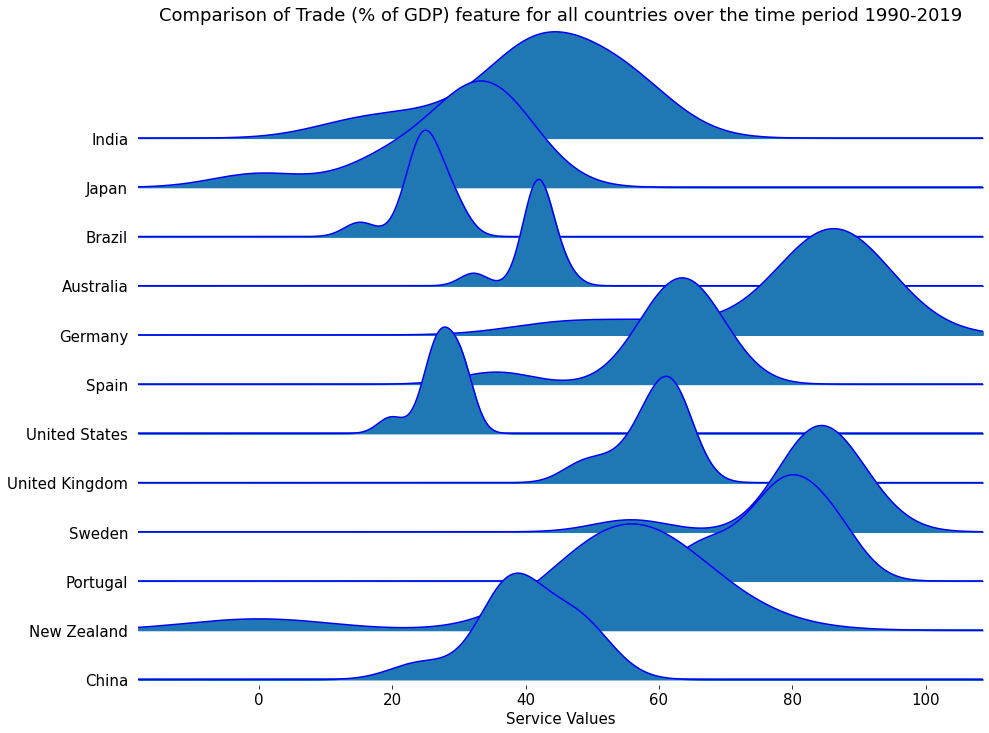

<Figure size 1280x960 with 0 Axes>

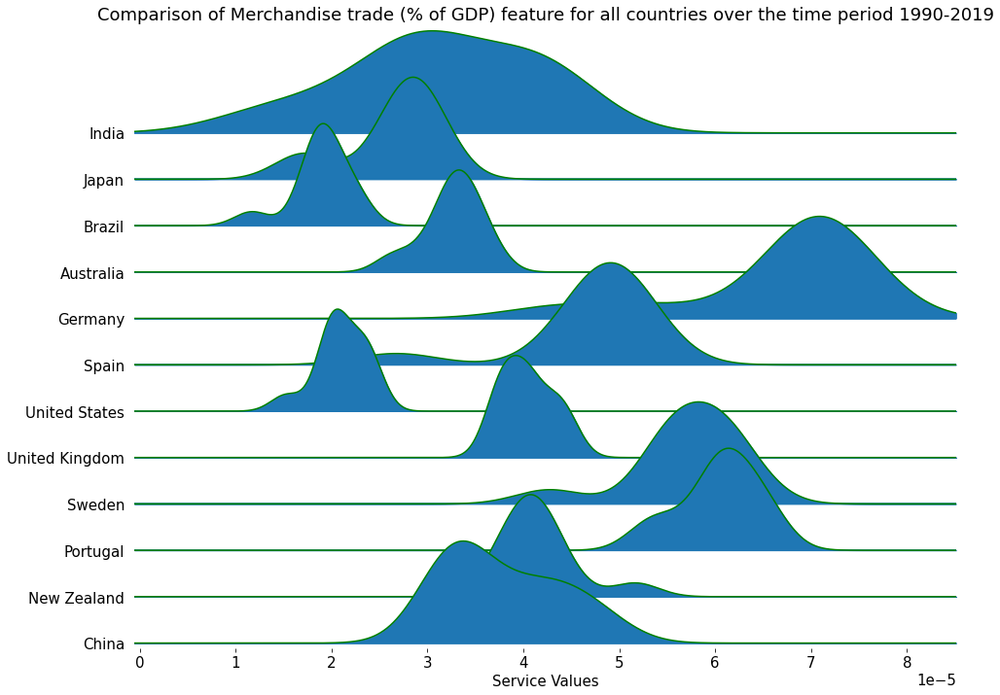

<Figure size 1280x960 with 0 Axes>

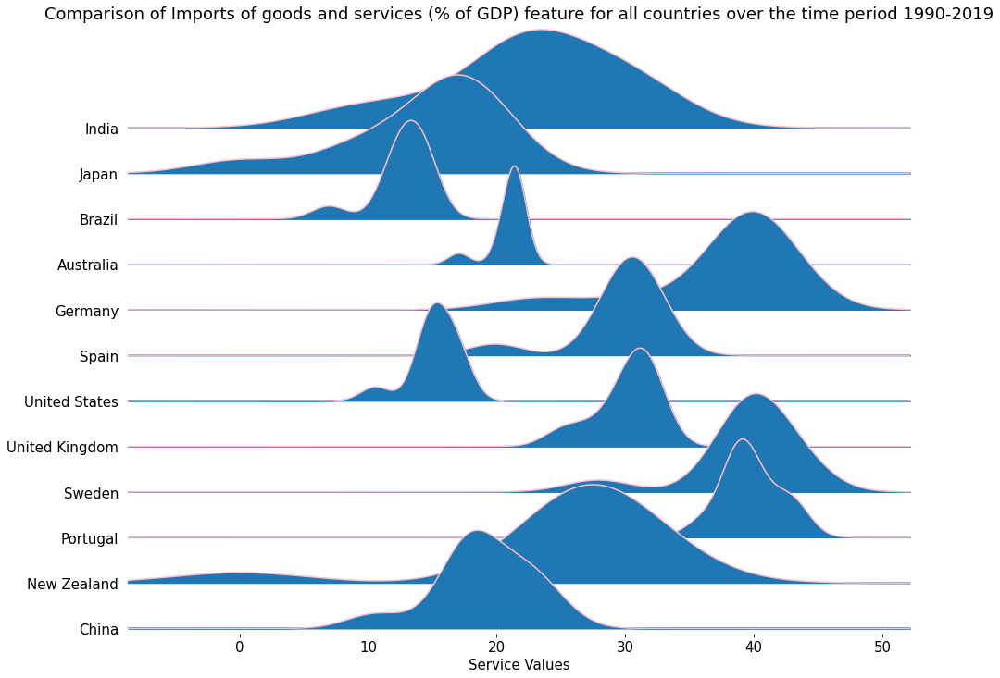

<Figure size 1280x960 with 0 Axes>

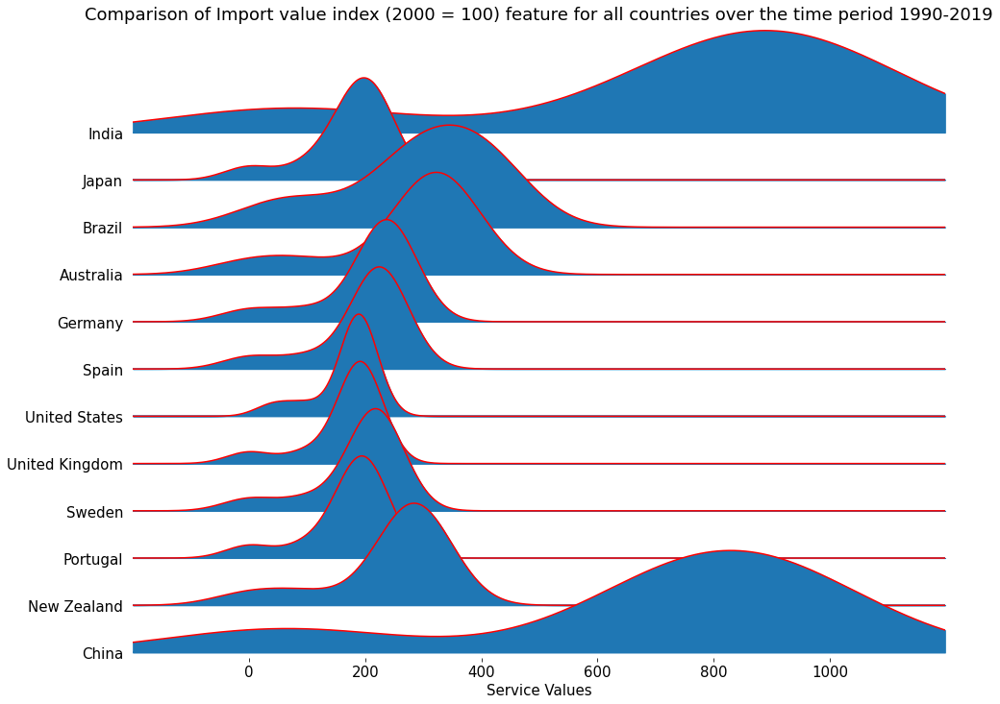

<Figure size 1280x960 with 0 Axes>

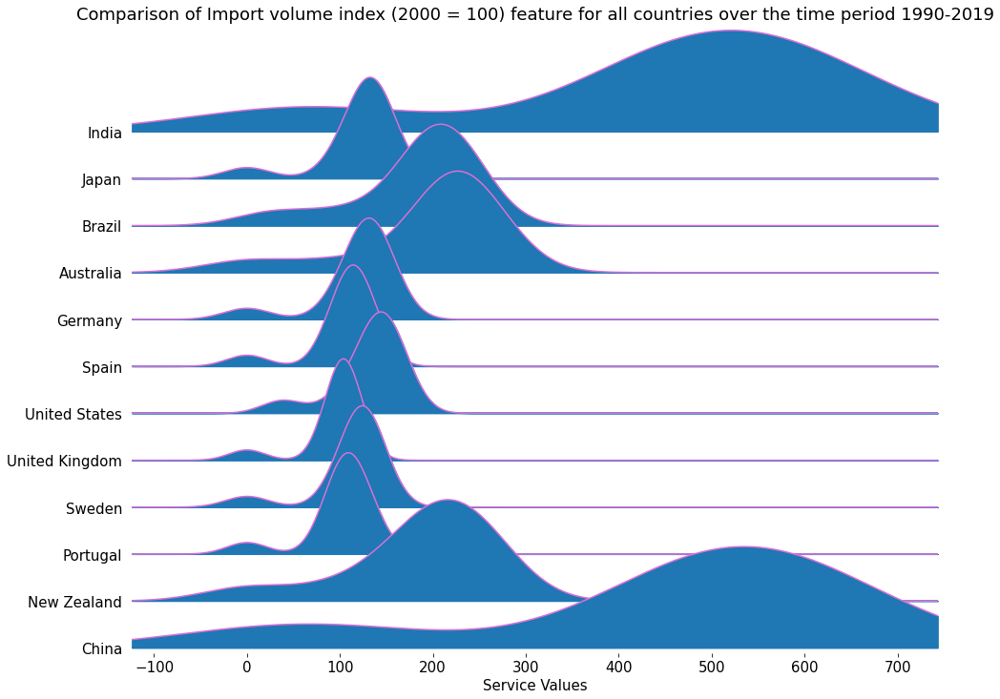

<Figure size 1280x960 with 0 Axes>

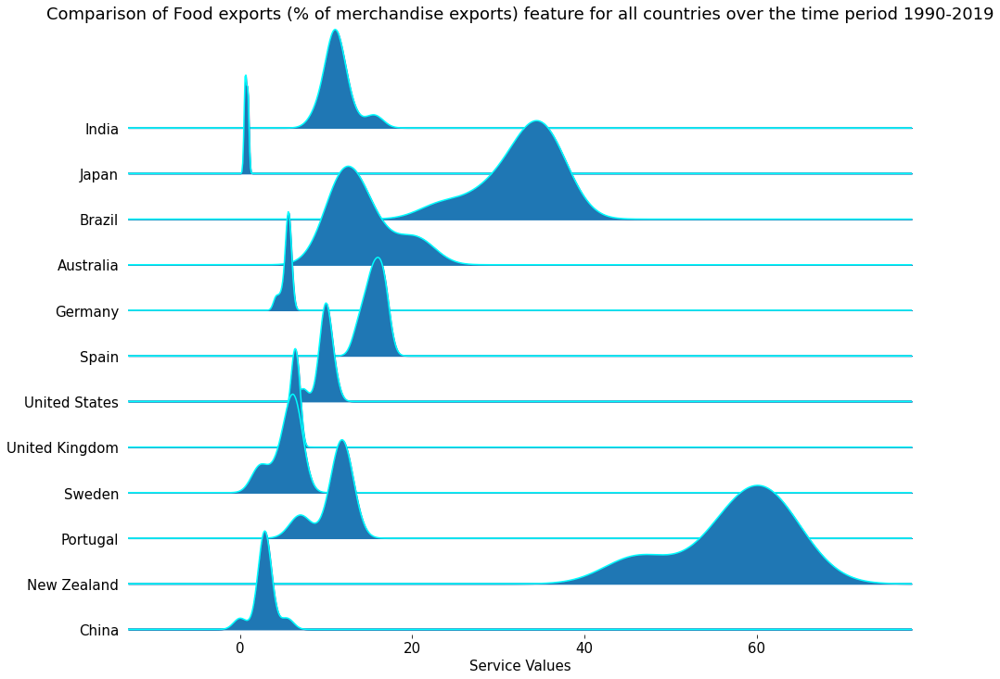

<Figure size 1280x960 with 0 Axes>

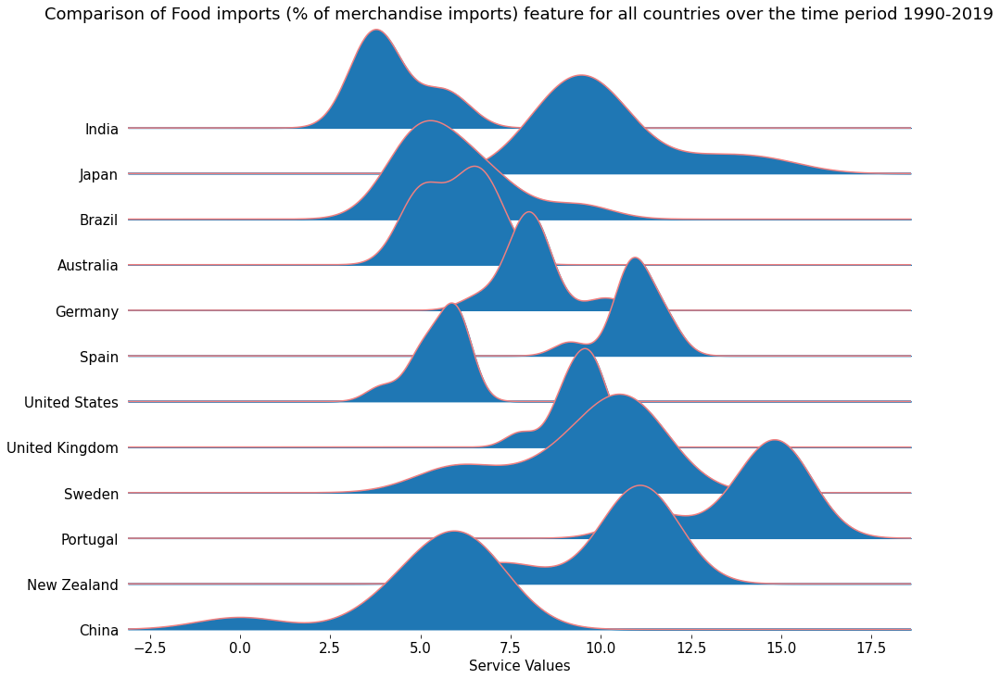

<Figure size 1280x960 with 0 Axes>

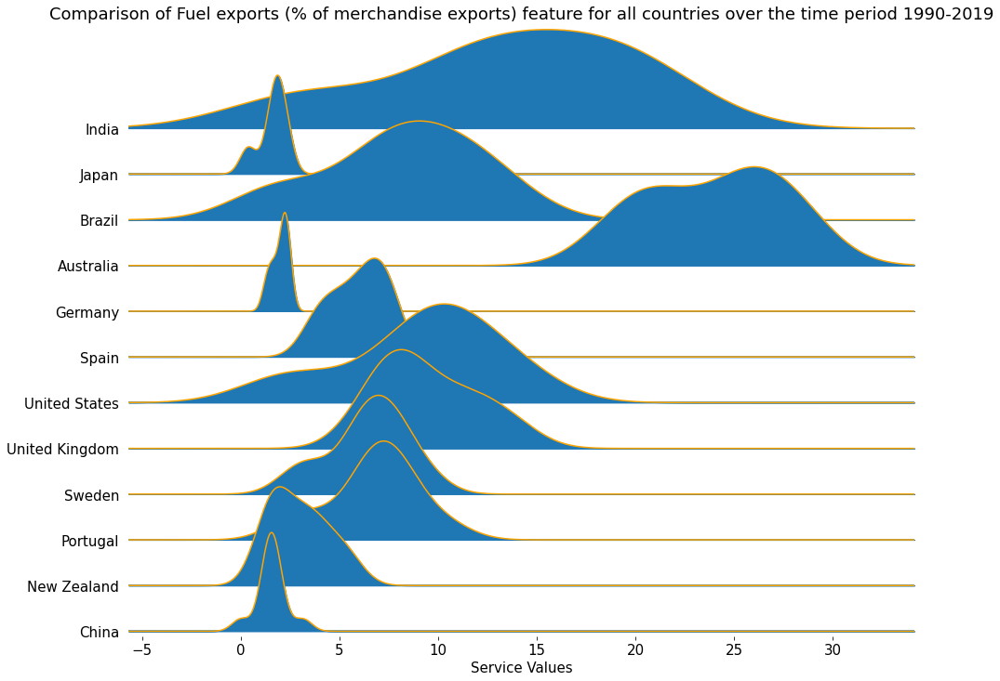

<Figure size 1280x960 with 0 Axes>

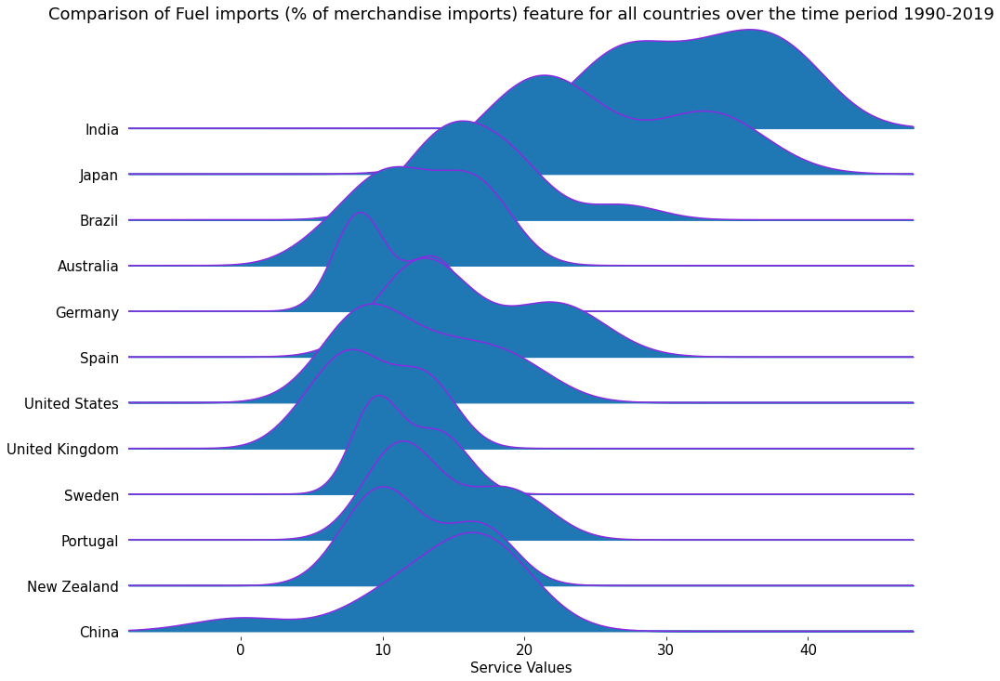

<Figure size 1280x960 with 0 Axes>

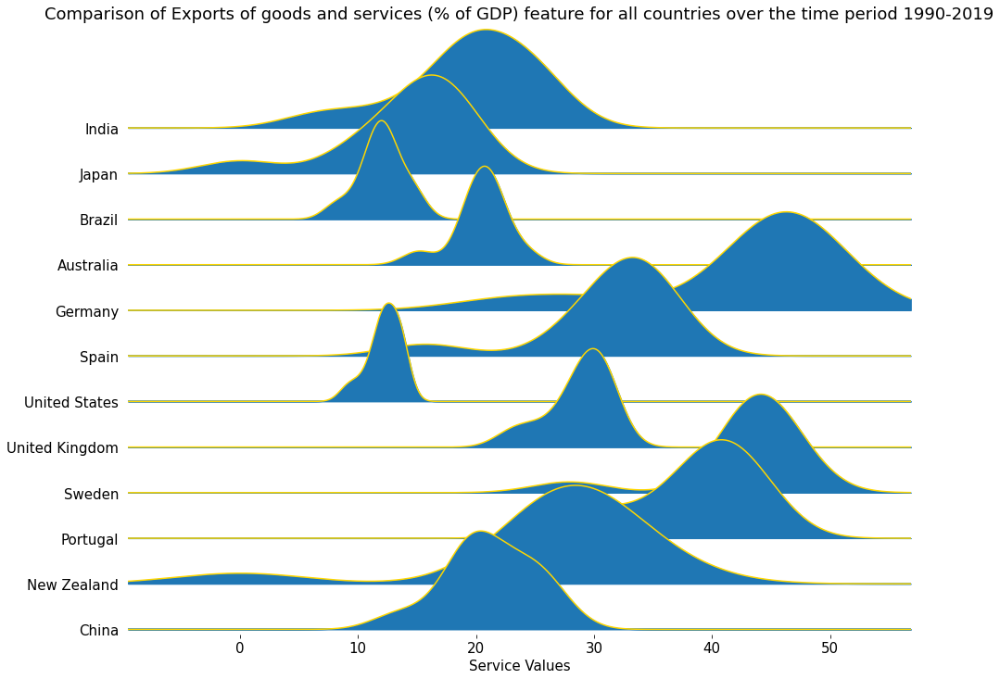

<Figure size 1280x960 with 0 Axes>

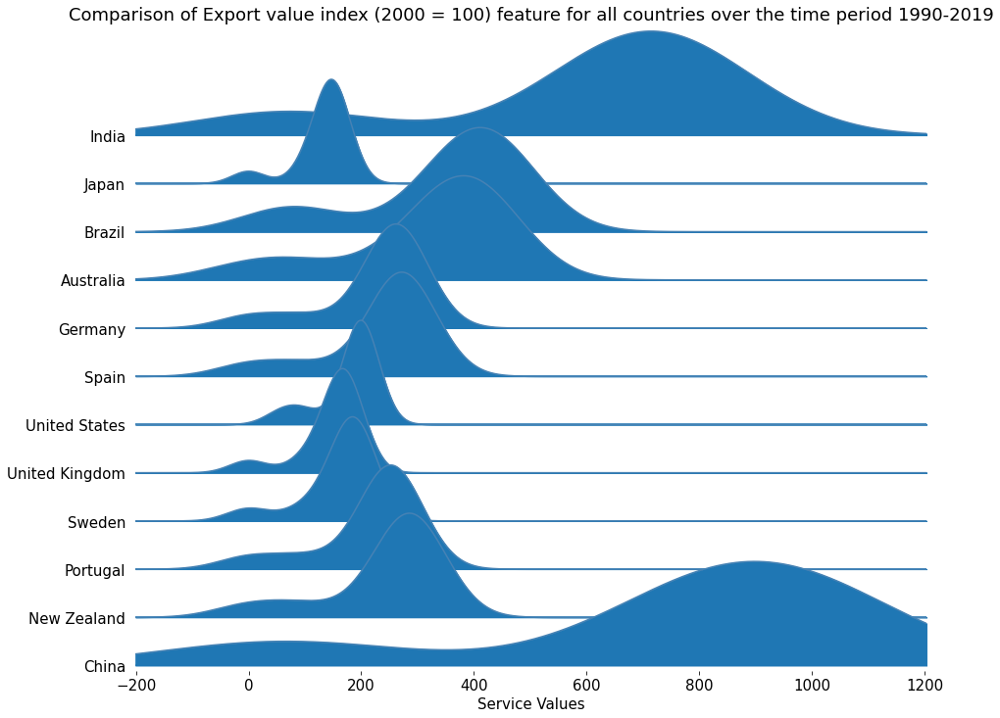

<Figure size 1280x960 with 0 Axes>

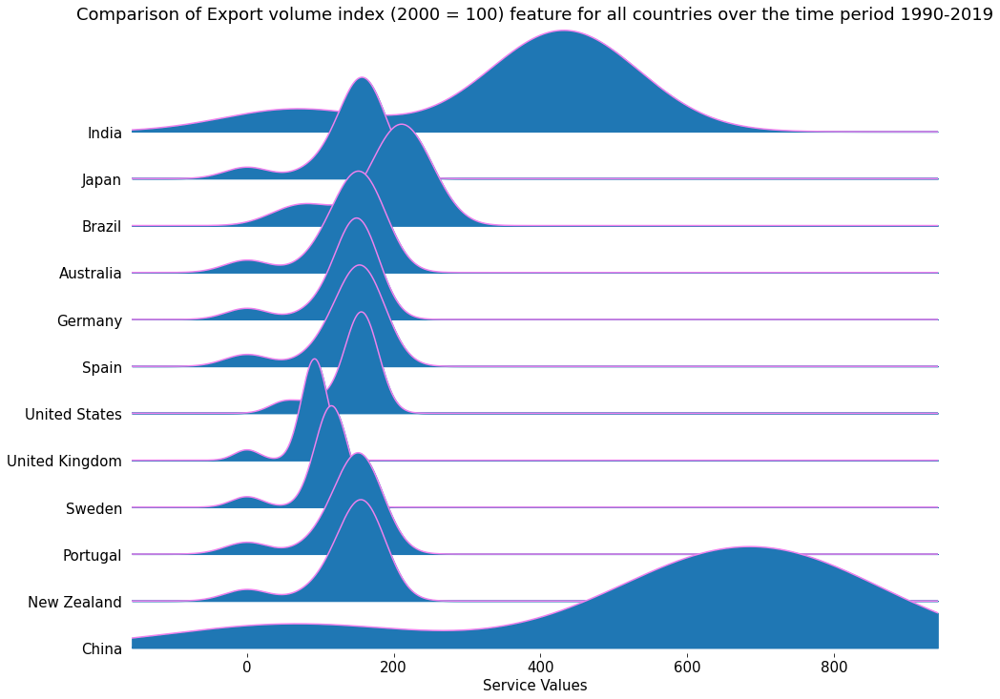

In [ ]:
# colors to highlight joyplot lines
colors=['blue','green','pink','red','orchid','cyan','lightcoral','orange','blueviolet','gold','steelblue','violet']
# creates a cycle with color list values
licycle = cycle(colors)
# for each service we plot a joyplot by calling joyplot_feature_over_years method
for service in services:
    joyplot_feature_over_years(countries,service,next(licycle)) # we send each color for each iteration

## Box plot

In [ ]:
# returns a boxplot showing service value statistical range values(median,max,min,quartiles) for each country over the years
def boxplot_feature_over_years(countries,service):
    def get_list(countries,year): # returns list of service values corresponding to all countries from a year
        country_list=[]
        for country in countries:
            val=services_dict[service][country][year]
            if val!='..':
                val=float(val)
            else:
                val=0
            country_list.append(val)
        return country_list
    # using get_list collect all the lists corresponding each year
    list1=get_list(countries,'1990')
    list2=get_list(countries,'2000')
    list3=get_list(countries,'2011')
    list4=get_list(countries,'2012')
    list5=get_list(countries,'2013')
    list6=get_list(countries,'2014')
    list7=get_list(countries,'2015')
    list8=get_list(countries,'2016')
    list9=get_list(countries,'2017')
    list10=get_list(countries,'2018')
    list11=get_list(countries,'2019')
    
    final_list = list1+list2+list3+list4+list5+list6+list7+list8+list9+list10+list11 # add all the year wise rows into one list
    #label axes and add title
    plt.ylabel('Service Values')
    plt.title('Comparison of {} feature values for all countries over the time period 1990-2019'.format(service))
    #plot a seaborn boxplot with the final year wise list values
    sns.boxplot(y=final_list)
    plt.figure()

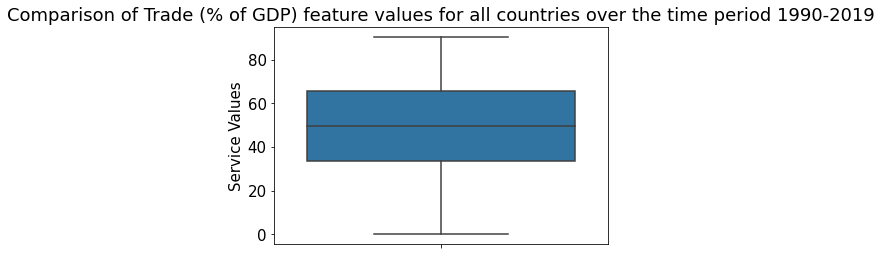

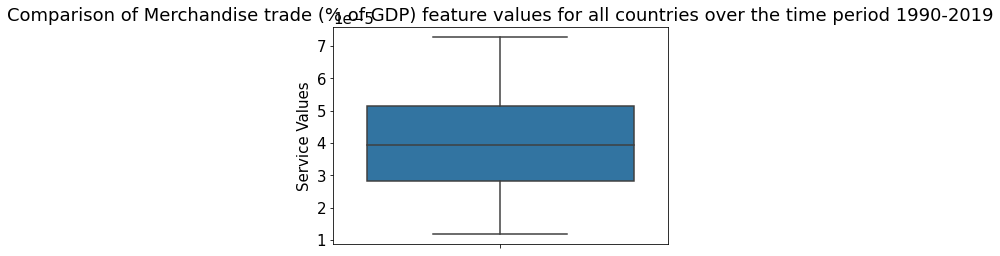

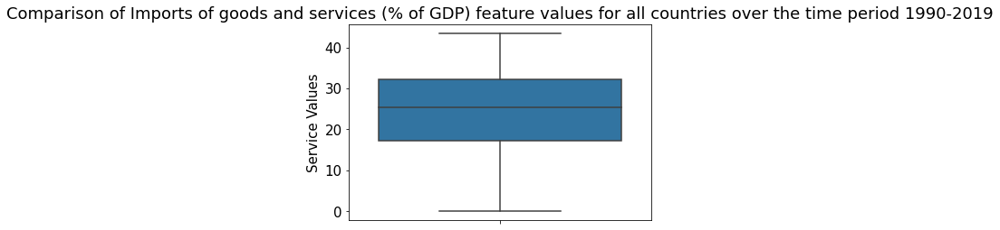

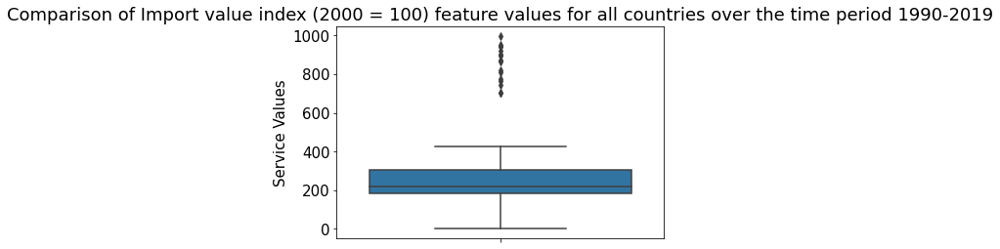

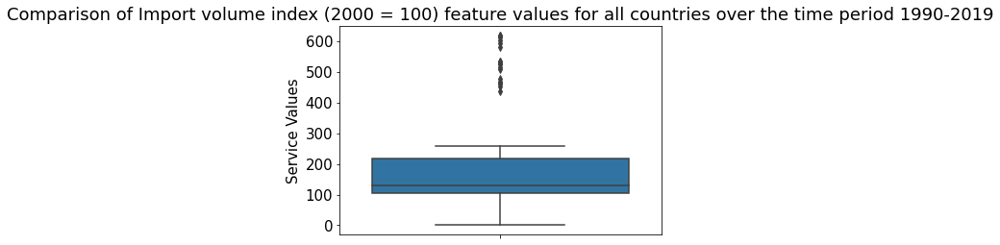

...

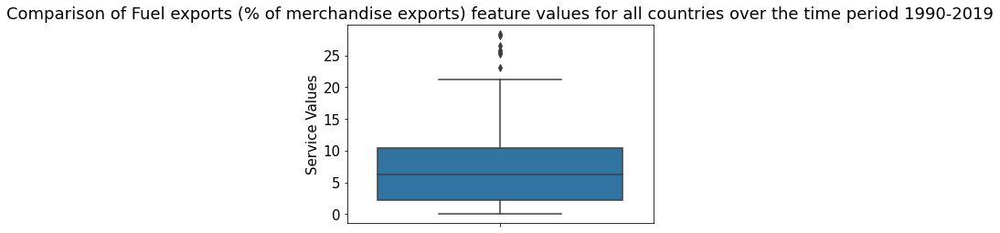

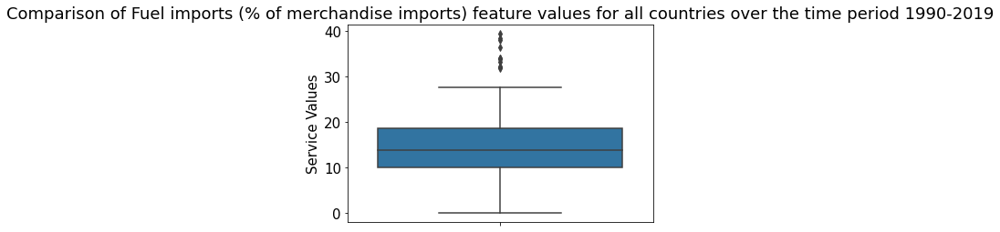

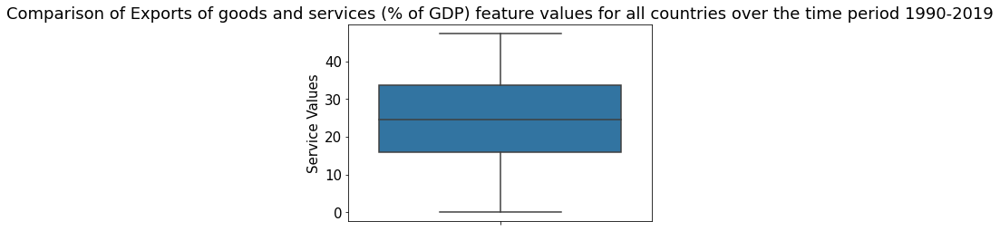

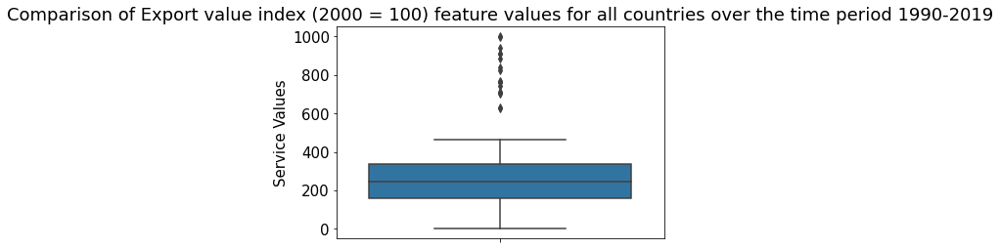

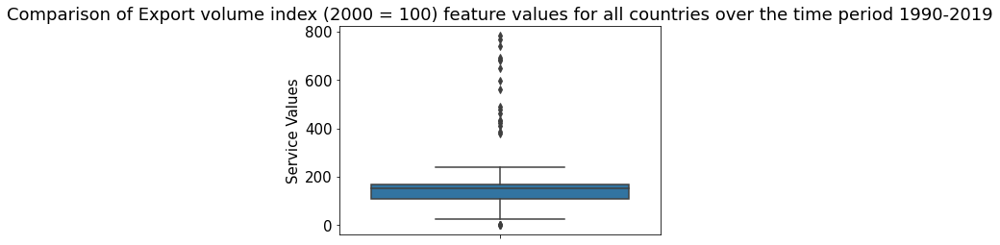

<Figure size 432x288 with 0 Axes>

In [ ]:
# for each service we plot a boxplot by calling boxplot_feature_over_years method
for service in services:
    boxplot_feature_over_years(countries,service)

## All Countries and their year wise values put together for each of the services

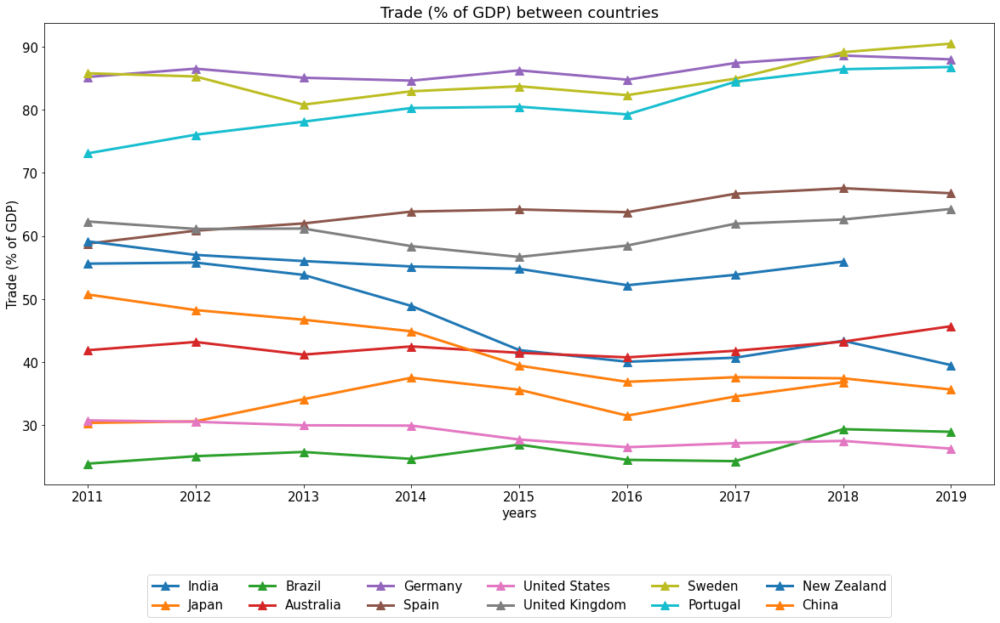

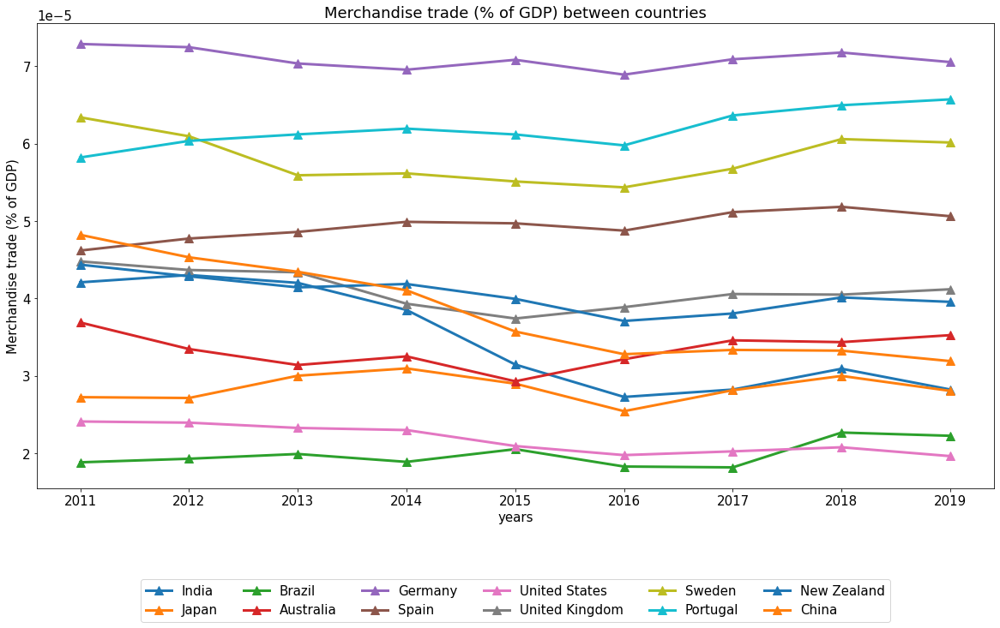

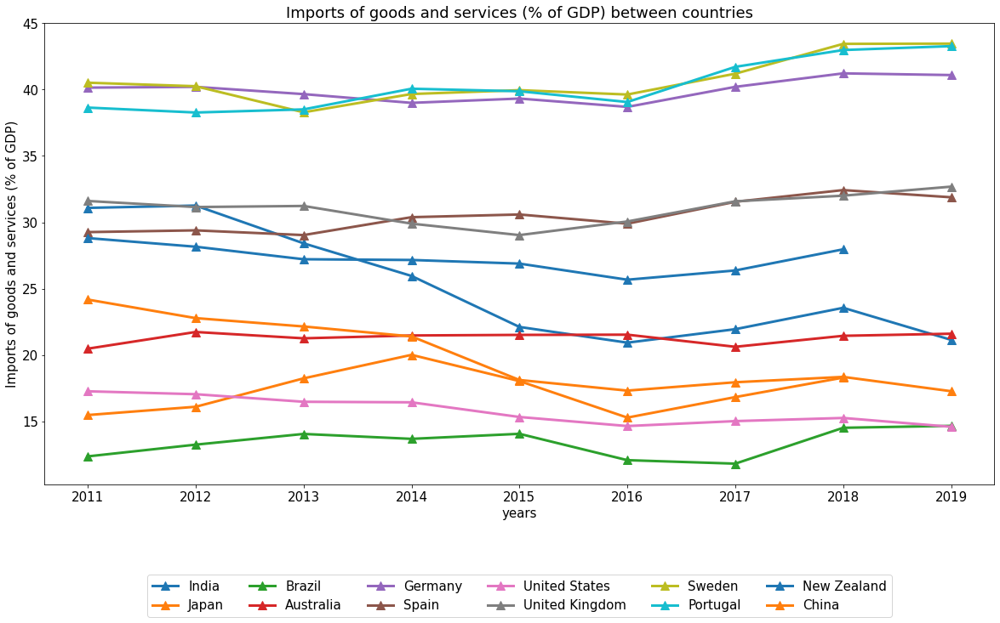

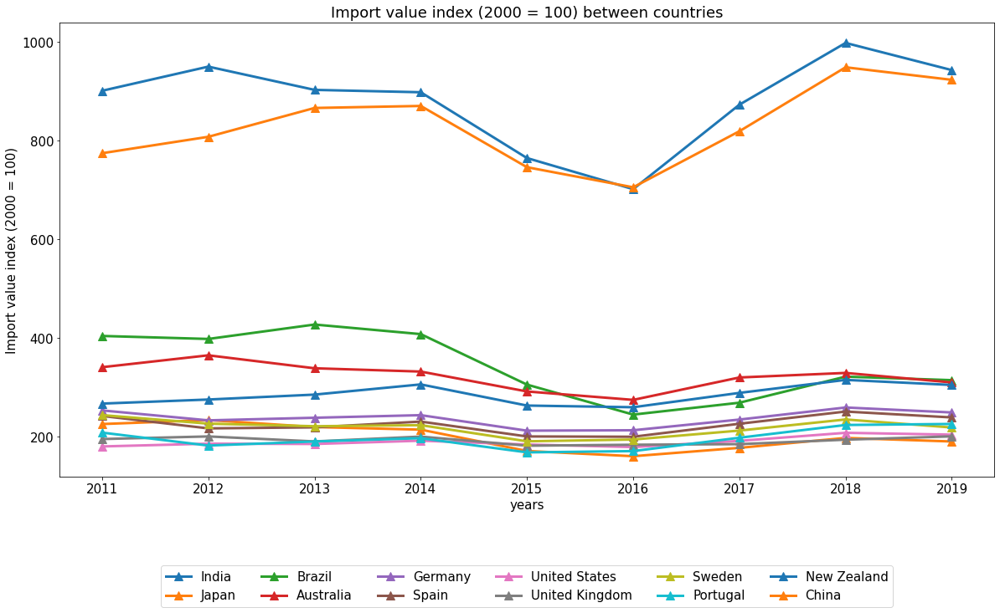

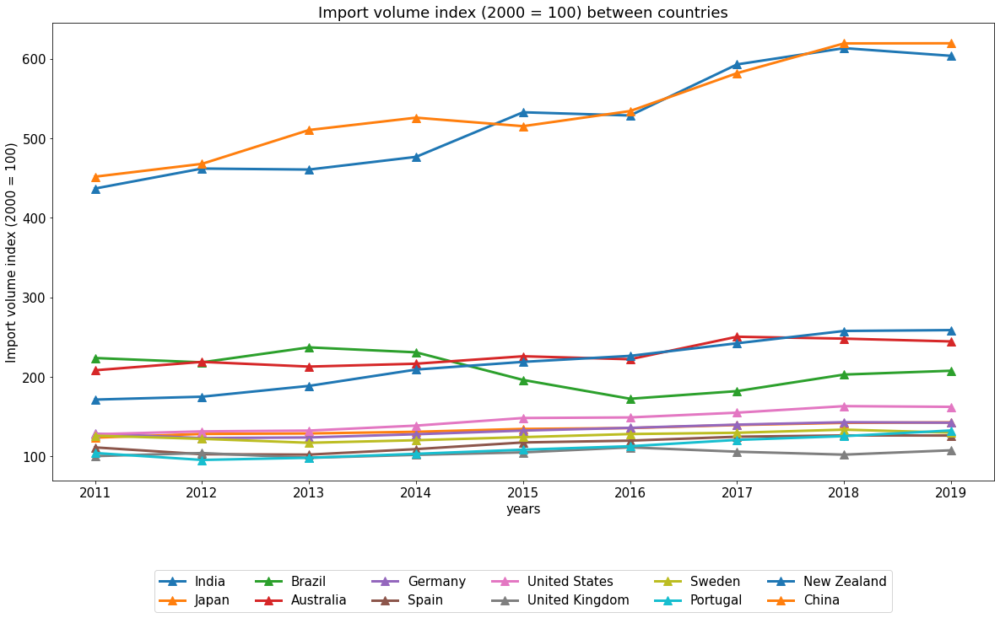

...

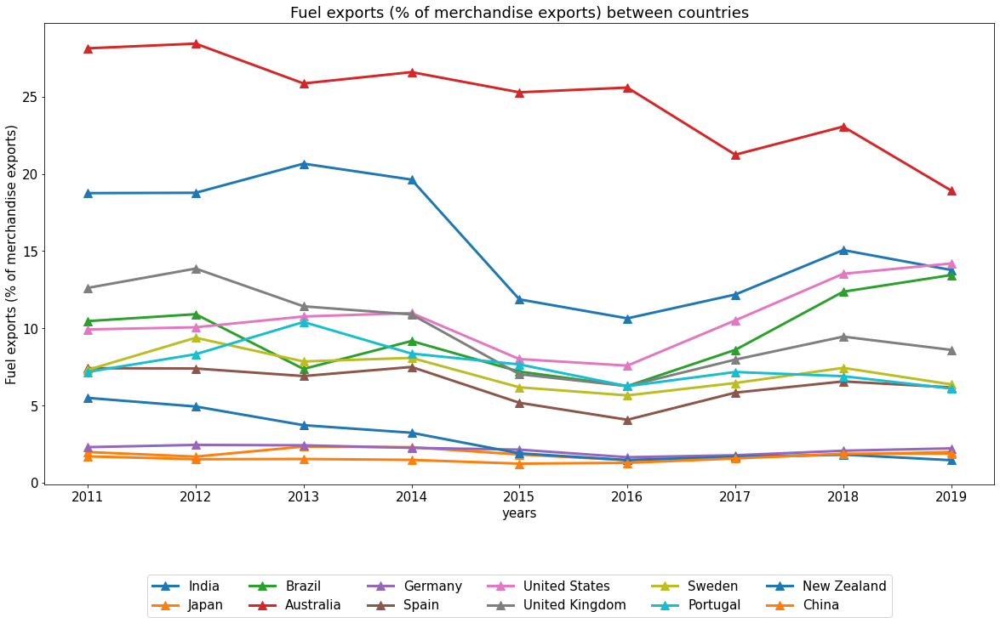

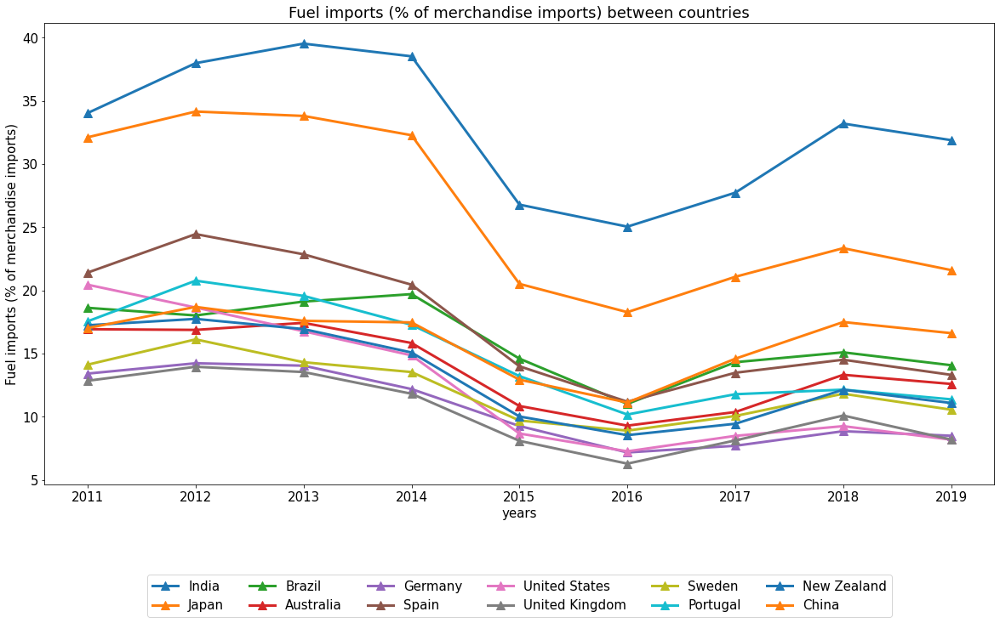

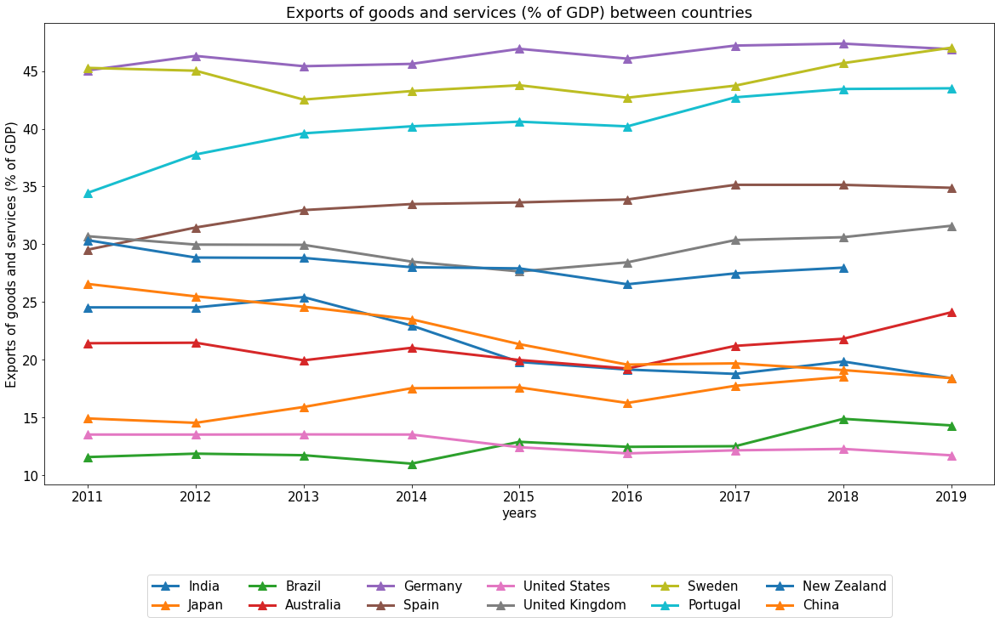

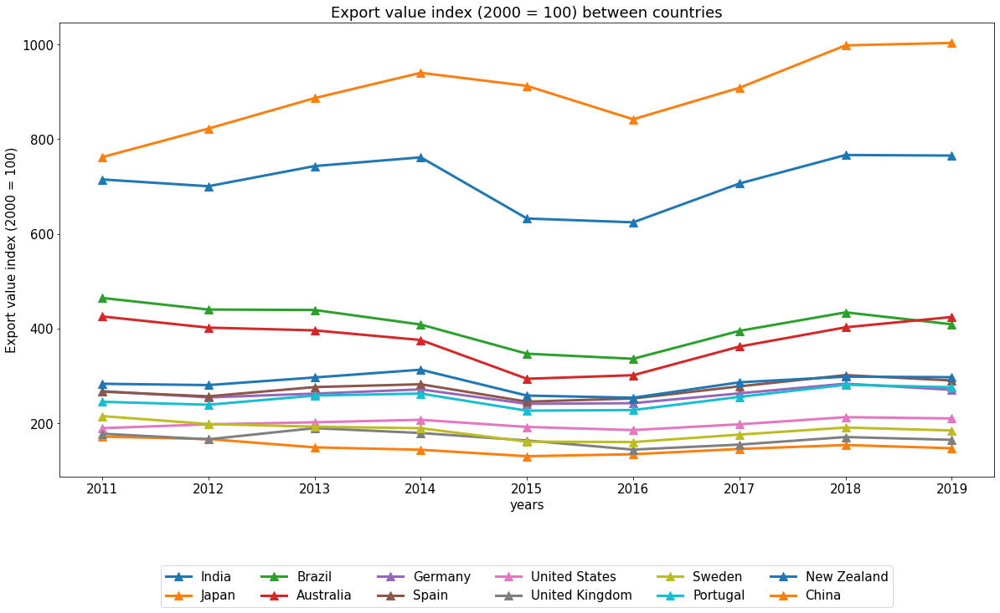

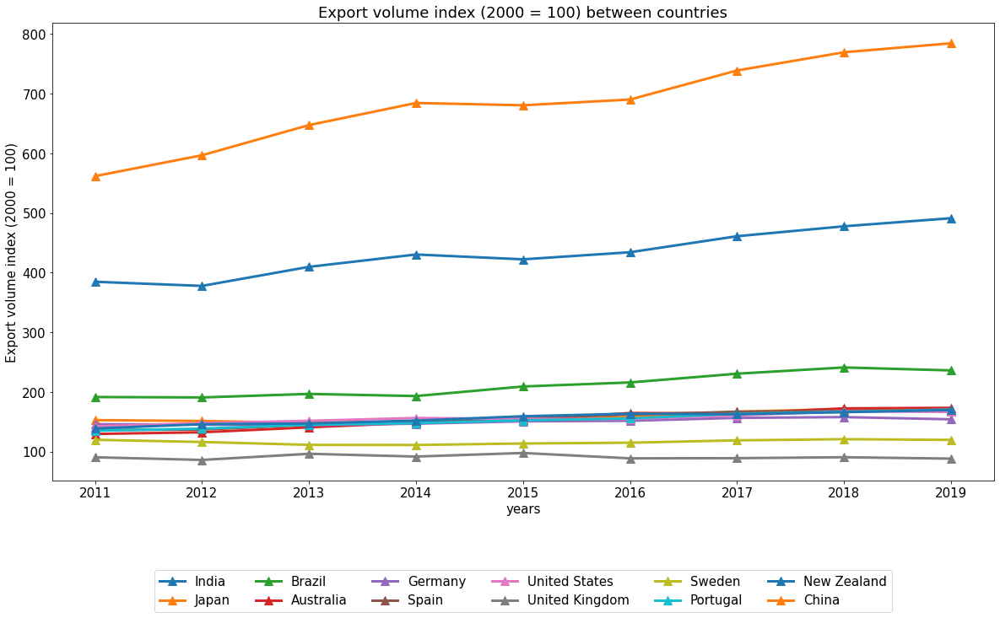

In [ ]:
plt.rcParams.update({'font.size': 15})
# for each service plot service values vs year for all countries (inner for loop)
for service in services:
    fig = plt.figure(figsize=(20,10))
    for country in countries:
        plotme = services_dict[service][country] #collect data points related to service and country
        labels = list(plotme.keys())[2:]
        x = list(range(len(labels))) #create x coordinate values
        y = [float(val) if val != '..' else None for val in list(plotme.values())[2:]] #create y coordinate values
        plt.plot(x,y,'^-',markersize='10',linewidth='3') #plot a line on line graph
    plt.xticks(x,labels)
    # label x and y axes
    plt.xlabel('years')
    plt.ylabel(service)
    # set the legend
    plt.legend(countries,ncol=6,loc="lower center", bbox_to_anchor=(0.5, -0.3))
    # set the title
    plt.title('{} between countries'.format(service))
    # plot (contains all lines (each for a country) on one line graph)
    plt.plot()

# Regression

# Linear Regression using sklearn package

In [ ]:
def linear_reg(services_dict, service, country, X_pred):
    """
    This function takes inputs as nested dict as services_dict, service
    name as service, country name as country, and a list of 
    values of X for prediction for their output Y. Y is returned as
    a list.
    """
    # get dict for given service and country from nested dict
    plotme = services_dict[service][country]
    X,y = [],[]
    # get X and y from dict for given service and country
    for key,value in plotme.items():
        if value != '..':
            X.append(int(key))
            y.append(float(value))
    X = np.array(X)[:,np.newaxis]
    y = np.array(y)
    # create linear regression model
    lr = LinearRegression()
    # fit the model for X and y
    lr.fit(X,y)
    # prediction of y for input test data X_pred
    y_pred = lr.predict(X_pred)
    return y_pred

In [ ]:
def plot_linear_reg(X, y_pred_all, service, countries):
    """
    This function takes inputs as:-
    X: test data input as list
    y_pred_all: output prediction for test data input as a list
    service: service name string
    countries: list of country names
    It will plot a linear regression graph of all countries for
    the particular service as a line graph. Returns None.
    """
    # for calculating the ideal mean plot
    service_df = pd.DataFrame(y_pred_all)
    mean_df = service_df.mean(axis=1, skipna=True)
    mean_list = np.array(mean_df, dtype='float')
    # set the figure size for every plot
    plt.figure(figsize=(12,10)) 
    # plot dashed line for average plot of all countries for the service 
    plt.plot(X, mean_list, label='average of all countries', linestyle='dashed')
    # plot the remaining lines for all the countries one-by-one
    for country, y_pred in y_pred_all.items():
        plt.plot(X, y_pred, label=country, marker='*')

    # plot title  
    plt.title("Prediction for {} for the next {} years".format(service, len(X)))
    plt.xlabel('Years')
    plt.ylabel(service)
    handle_labels = ['average of all countries']
    handle_labels.extend(countries)
    # plot legend
    plt.legend(handle_labels, bbox_to_anchor=((1.05, 1)), loc='upper left', fontsize='xx-large')
    plt.xlim(X[0], X[len(X)-1])
    plt.show()
        

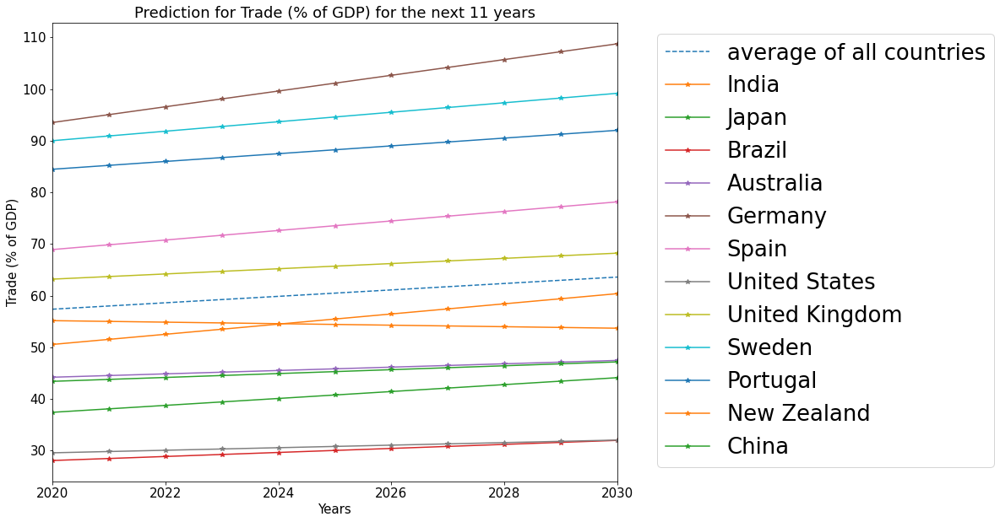

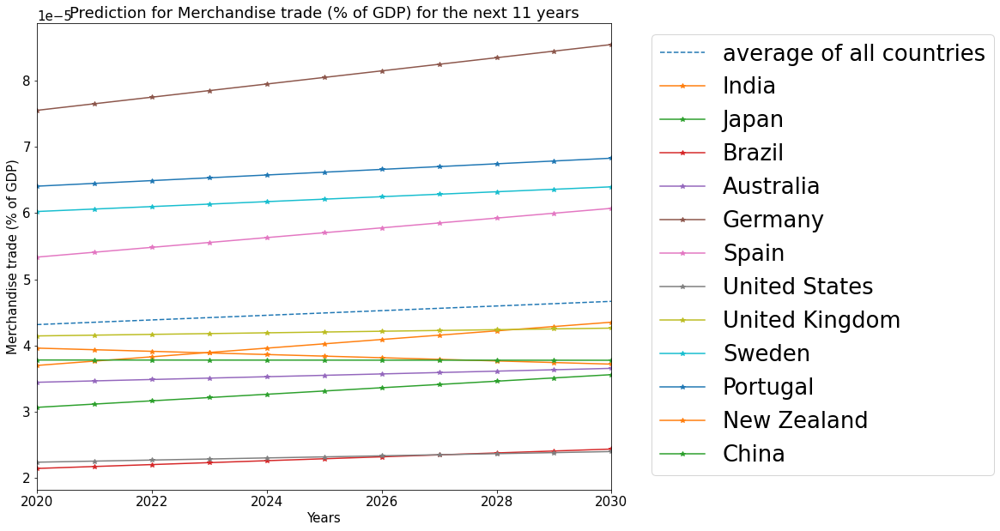

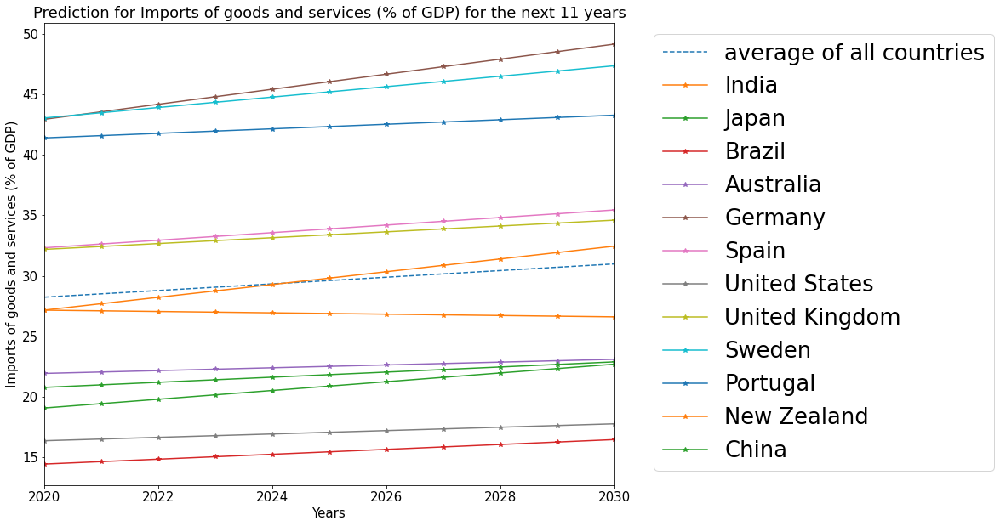

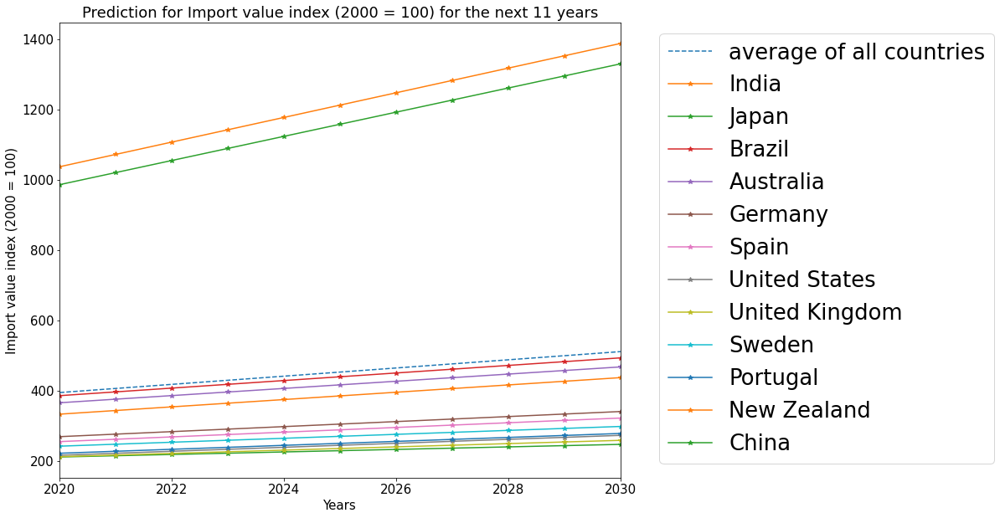

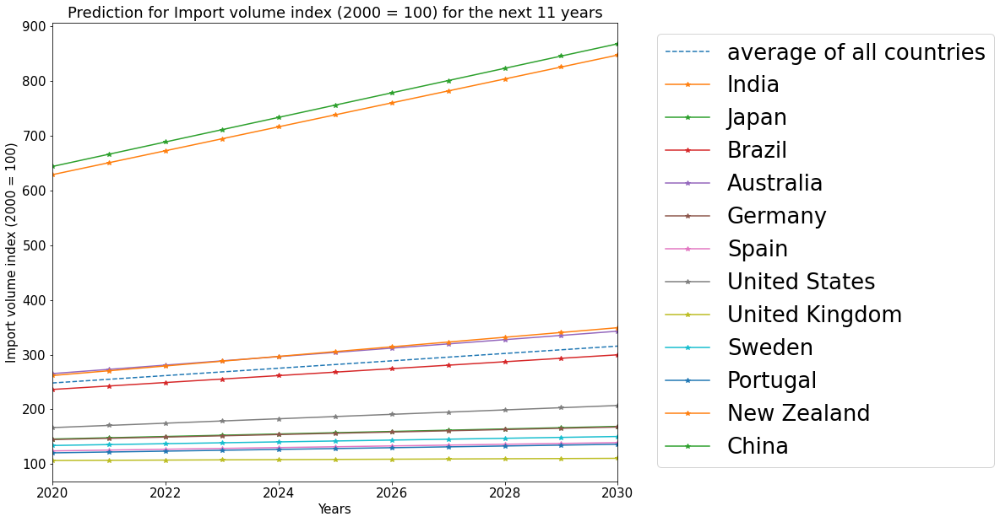

...

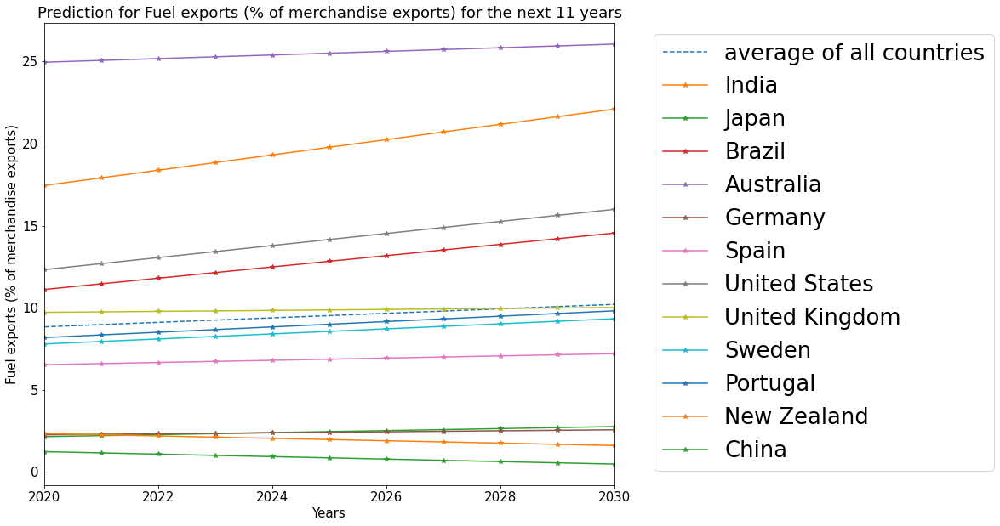

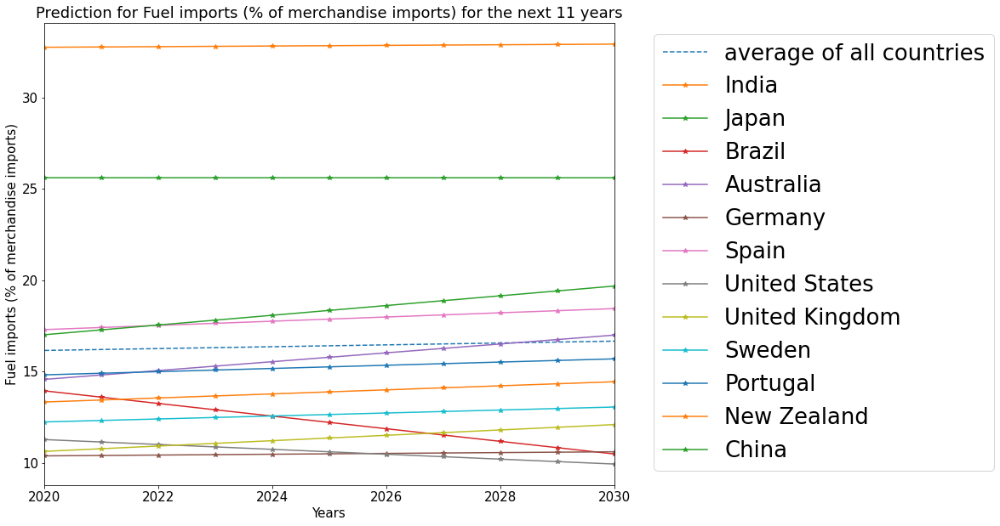

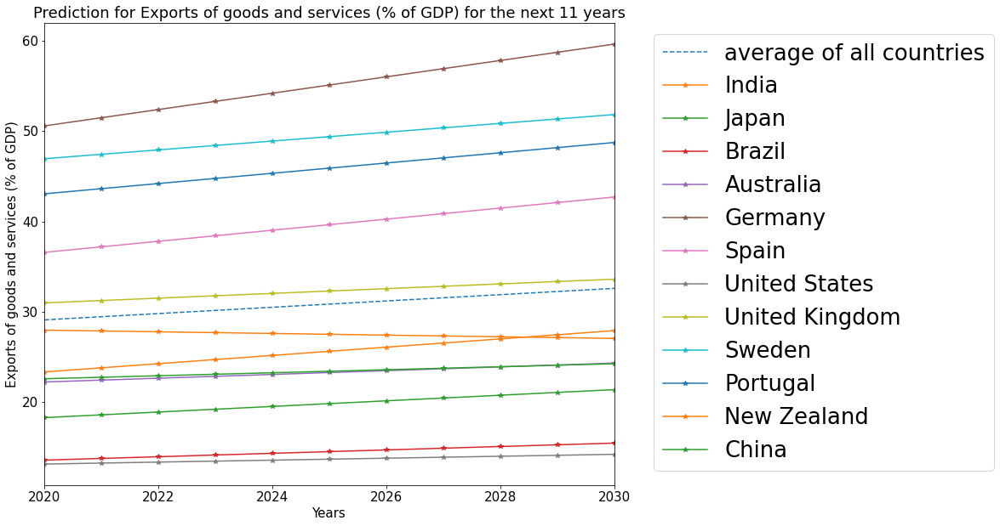

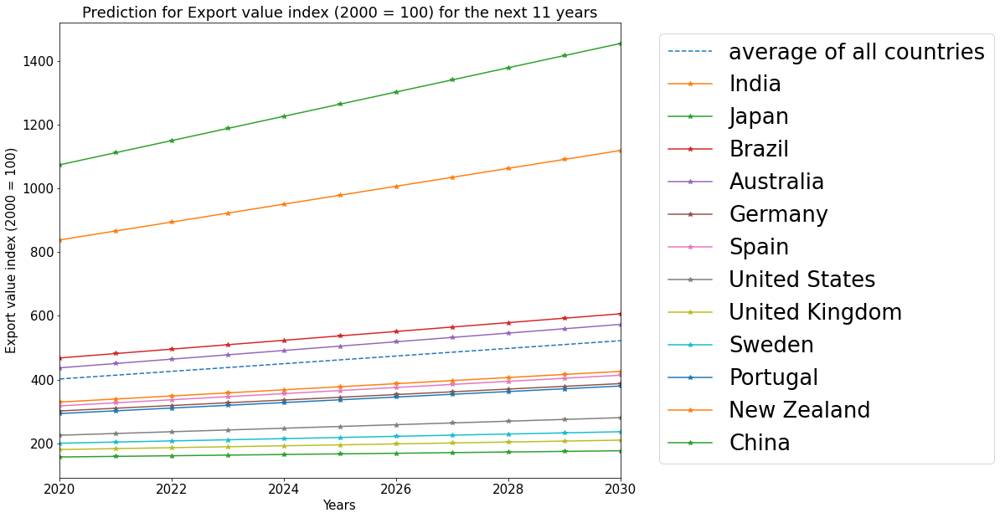

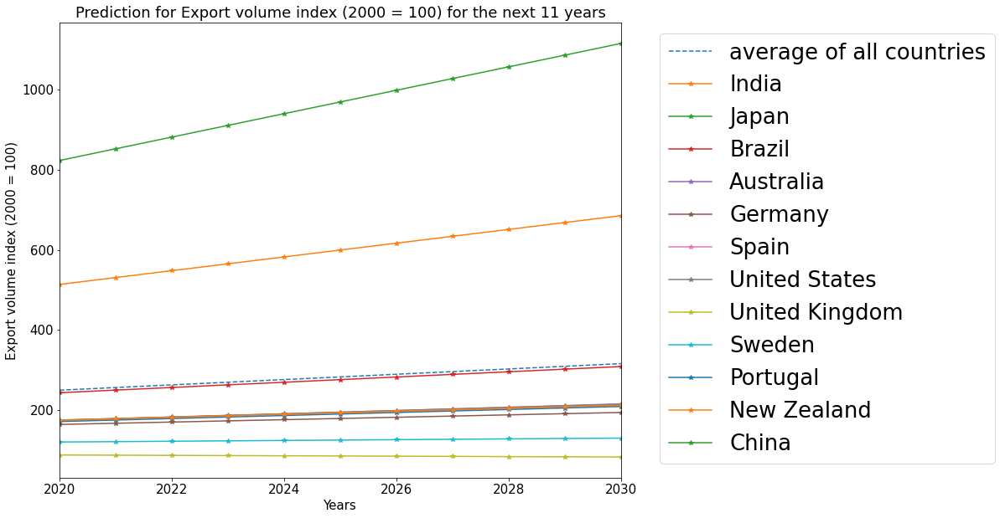

In [ ]:
# list of years from 2020 to 2030 as input for prediction
X_pred = np.array(list(range(2020,2031,1))).reshape(-1,1)
# plot the prediction data for all the countries
for service in services:
    y_pred_all = {}
    for country in countries:
        y_pred = linear_reg(services_dict, service, country, X_pred)
        y_pred_all[country] = y_pred
    plot_linear_reg(X_pred, y_pred_all, service, countries)